# Airbus Helicopter Anormaly Detection


- First of all, I would like to dedicate this work to **Louis Charles BREGUET**, designer, builder, pioneer and inventor of modern helicopter.

<img src="https://static.lpnt.fr/images/2016/07/09/4659795-4659790-g-jpg_3660959_1000x667.jpg" alt="drawing" width="800"/>

## Challenge Large Scale Machine Learning

- Authors: 
- Pavlo Mozharovskyi (pavlo.mozharovskyi@telecom-paris.fr), Stephan Clémençon, Jayant Sen Gupta


## Functional anomaly detection

**Anomaly detection** (or **outlier detection**) comprises the **machine learning** methods aimed at identification of observations that exhibit suspicious behaviour and are very likely to cause a problem. In the **unsupervised learning** framework, no label indicating whether a training observation is anomalous or not is available. Hence, anomalies should be identified in an automatic way by learning the *normal* behavior, that of the vast majority of the observations, and considering those differing significantly from it as *abnormal*. Logically, anomalies are rare in the data and thus fall in *low density* regions: anomaly detection thus boils down to identifying the *tail* of the distribution.

With the ubiquitous deployment of sensors monitoring nearly continuously the health of complex infrastructures, **anomaly detection** can now rely on measurements sampled at a very high frequency, providing a very rich representation of the phenomenon under surveillance. In order to exploit fully the collected information, the observations cannot be treated as multivariate data anymore and a functional analysis approach is required.

A (very) short list of **literature** regarding functional anomaly detection can include:
 - J.O. Ramsay, Silverman, B.W. (2005): Functional Data Analysis. Springer-Verlag, New-York.
 - Ferraty, F., Vieu, P. (2006): Nonparametric Functional Data Analysis: Theory and Practice. Springer Science & Business Media.
 - Chandola, V., Banerjee, A., Kumar, V. (2009): Anomaly detection: A survey. ACM Computing Surveys (CSUR) 41(3), 1-58.
 - Hubert, M., Rousseeuw, P.J., Segaert, P. (2015): Multivariate functional outlier detection. Statistical Methods & Applications 24(2), 177-202.
 - Wang, J.L., Chiou, J.M., Müller, H.G. (2016): Functional data analysis. Annual Review of Statistics and Its Application 3, 257-295.

## The properties of the dataset:


The data set is provided by the Airbus and consistst of the measures of the accelerometer of helicopters during  1 minute at frequency 1024 Hertz, which yields time series measured at in total 60 * 1024 = 61440 equidistant time points.

- Training data: 

The training set consists of one file, **airbus_train.csv**.

File **airbus_train.csv** contains one observation per row, each observation having 61440 entries, measures with equivalent time distance of 1 / 1024 seconds. There are in total 1677 training observations.

- Test data:

The training set consists of one file, **airbus_test.csv**, which has the same structure as file **airbus_train.csv**. There are in total 2511 test observations.

- Remark:

The task of the **unsupervised anomaly detection** is difficult, in the sense that, strictly speaking, your only feedback will be your score calculated by the submission website.

## The performance criterion:

You should submit a file that contains in each row anomaly score for the observation in the corresponding row of the file **airbus_test.csv**. For a sample submission please see the codes below. Please note, that your score should provide ordering which allows to identify anomalies, i.e. the higher the value of the score, the **more abnormal** the observation should be considered.

The performance criterion is the **Area Under the Receiver Operating Characteristic** (AUC), see also:
https://en.wikipedia.org/wiki/Receiver_operating_characteristic#Area_under_the_curve

- Training Data

Training data, input (file **airbus_train.csv**): https://partage.imt.fr/index.php/s/zqrRggLBY8GRc9i

- Test Data 

Training data, output (file **airbus_test.csv**): https://partage.imt.fr/index.php/s/WpiqcjMq8ymg8zA

## Import

In [1]:
import pandas as pd
import numpy as np

### Signal ###
from scipy import interpolate
from scipy import signal
from scipy import fftpack, fft

### Visualization ###
import matplotlib.pyplot as plt
%matplotlib inline
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
from matplotlib.lines import Line2D
from matplotlib.collections import EllipseCollection
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('retina')

### Machine Learning ###
from sklearn.svm import OneClassSVM
from sklearn.ensemble import IsolationForest
from sklearn.decomposition import PCA,kernel_pca
from sklearn.neighbors import LocalOutlierFactor
from sklearn.metrics import mean_squared_error,mean_absolute_error

### keras ###
import keras
from tensorflow.keras import layers
#from tensorflow import keras
from keras import backend as K
from keras.models import Sequential
from keras import layers
from keras.optimizers import RMSprop
from keras.models import Model
from keras.losses import mse, binary_crossentropy
from keras.callbacks import ModelCheckpoint, TensorBoard
from keras.layers import Conv1D, GlobalMaxPool1D, Dense, Flatten
from keras.callbacks import ModelCheckpoint

Using TensorFlow backend.


### Load and investigate the data

In [2]:
xtrain = np.loadtxt('airbus_train.csv', delimiter= ' ')
print(xtrain.shape)
xtest = np.loadtxt('airbus_test.csv', delimiter= ' ')
print(xtest.shape)

(1677, 61440)
(2511, 61440)


### A sample plot

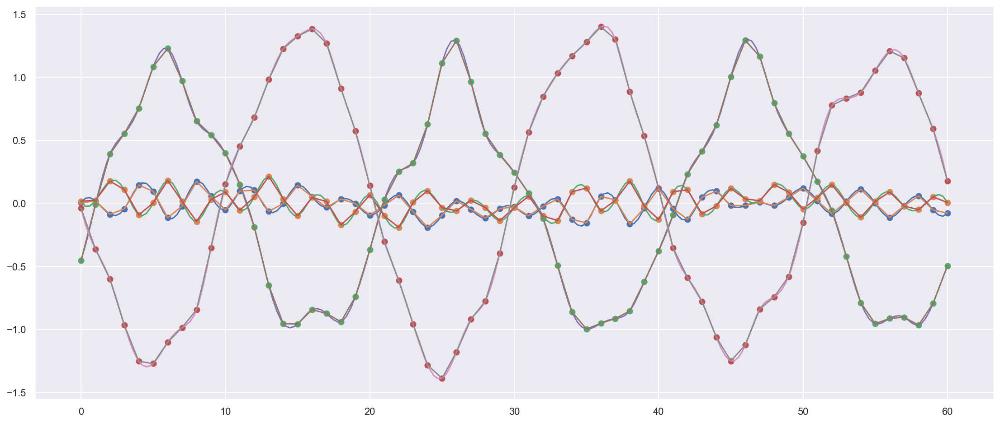

In [147]:
# Plot first 614 time points for first 4 observations
plt.figure(figsize=(19, 8))
for i in range(4):
    tck = interpolate.splrep(range(61), xtrain[i+8, :61], s=0)
    xnew = np.linspace(0, 60, 200)  # np.arange(0, 2*np.pi, np.pi/50)
    ynew = interpolate.splev(xnew, tck, der=0)
    # plt.scatter(xnew,ynew)
    plt.plot(xnew, ynew)
    plt.scatter(range(61), xtrain[i+8, :61])
    plt.plot(range(61), xtrain[i+8, :61])
plt.show()

# Some physics before start
## What can be the anormalies?
### Aircrafte Flutter
Flutter is a **dynamic instability of an elastic structure in a fluid flow, caused by positive feedback between the body's deflection and the force exerted by the fluid flow**. In a linear system, "**flutter point**" is the point at which the structure is undergoing simple harmonic motion—zero net damping—and so any further decrease in **net damping** will result in a **self-oscillation** and eventual failure. "Net damping" can be understood as the sum of the structure's natural positive damping and the negative damping of the aerodynamic force. Flutter can be classified into two types: **hard flutter**, in which the net damping decreases very suddenly, very close to the flutter point; and **soft flutter**, in which the net damping decreases gradually.
https://www.youtube.com/watch?v=qpJBvQXQC2M&t=59s

https://www.youtube.com/watch?v=MEhVk57ydhw

https://www.youtube.com/watch?v=0FeXjhUEXlc

## What are the possible approaches?
### Raw signal time series 

### Time Series Clustering
### Similarity
The objective of time series comparison methods is to produce a distance metric between two input time series. The similarity or dissimilarity of two-time series is typically calculated by converting the data into vectors and calculating the Euclidean distance between those points in vector space.
### DTW (Dynamic  Time Warping)
In time series analysis, dynamic time warping (DTW) is one of the algorithms for measuring similarity between two temporal sequences, which may vary in speed. For instance, similarities in walking could be detected using DTW, even if one person was walking faster than the other, or if there were accelerations and decelerations during the course of an observation. 

<img src="https://upload.wikimedia.org/wikipedia/commons/6/69/Euclidean_vs_DTW.jpg" alt="drawing" width="310"/>


Clearly these two series follow the same pattern, but the blue curve is longer than the red. If we apply the one-to-one match, shown in the top, the mapping is not perfectly synced up and the tail of the blue curve is being left out.
DTW overcomes the issue by developing a one-to-many match so that the troughs and peaks with the same pattern are perfectly matched, and there is no left out for both curves(shown in the bottom top).

In [142]:
def dtw(s, t, window):
    n, m = len(s), len(t)
    w = np.max([window, abs(n-m)])
    dtw_matrix = np.zeros((n+1, m+1))

    for i in range(n+1):
        for j in range(m+1):
            dtw_matrix[i, j] = np.inf
    dtw_matrix[0, 0] = 0

    for i in range(1, n+1):
        for j in range(np.max([1, i-w]), np.min([m, i+w])+1):
            dtw_matrix[i, j] = 0

    for i in range(1, n+1):
        for j in range(np.max([1, i-w]), np.min([m, i+w])+1):
            cost = abs(s[i-1] - t[j-1])
            # take last min from a square box
            last_min = np.min(
                [dtw_matrix[i-1, j], dtw_matrix[i, j-1], dtw_matrix[i-1, j-1]])
            dtw_matrix[i, j] = cost + last_min
    return dtw_matrix

Python implementation of FastDTW, which is an approximate Dynamic Time Warping (DTW) algorithm that provides optimal or near-optimal alignments with an O(N) time and memory complexity.

In [144]:
from fastdtw import fastdtw
from scipy.spatial.distance import euclidean

x=xtrain[1]
y=xtrain[2]

distance, path = fastdtw(x, y, dist=euclidean)

print(distance)
print(path[:20])

18174.91575999992
[(0, 0), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1), (10, 1), (11, 1), (12, 1), (13, 1), (14, 1), (15, 1), (16, 2), (17, 3), (18, 3), (19, 4)]


## Periodogram-based distance

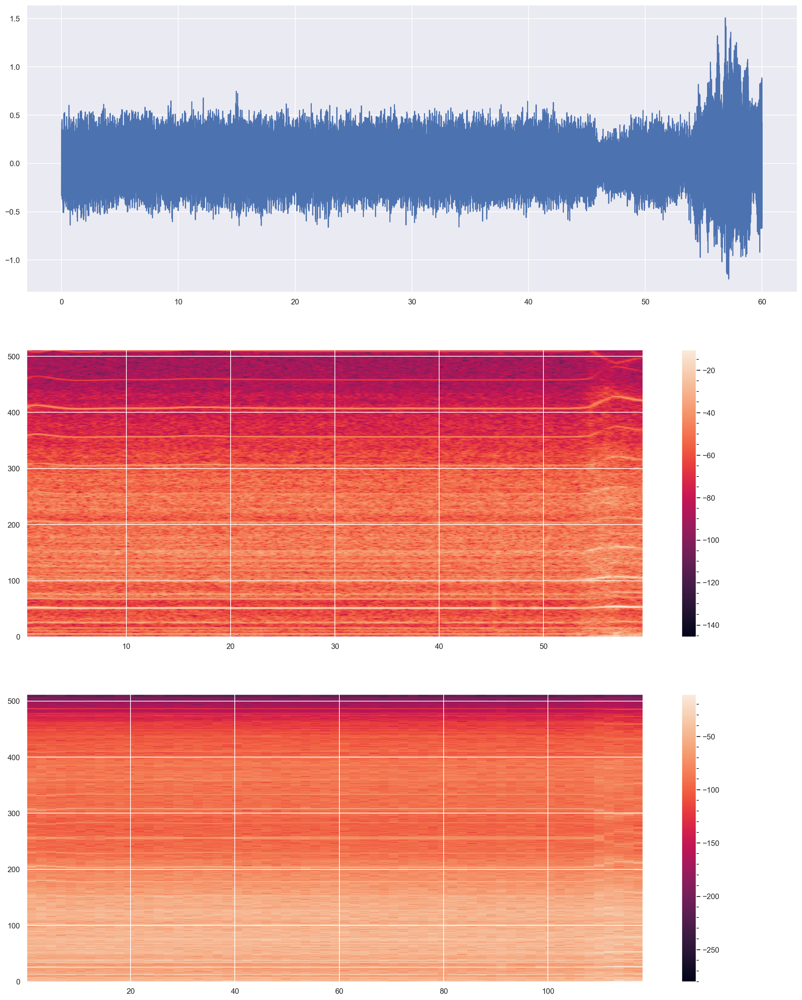

In [158]:
def draw_spectrum(x, dt=1/1024):
    dt = 1/1024
    t = np.arange(0.0, 60.0, dt)
    fig, (ax1, ax2, ax3) = plt.subplots(nrows=3, figsize=(20, 26))

    ax1.plot(t, x)
    # raw signal
    NFFT = 1024  # the length of the windowing segments
    Fs1 = int(1.0 / dt)  # the sampling frequency
    spectrum1, freqs1, bins1, im1 = ax2.specgram(
        x, NFFT=NFFT, Fs=Fs1, noverlap=900, mode='magnitude')  # mode : {'default', 'psd', 'magnitude', 'angle', 'phase'}
    cbar = fig.colorbar(im1, ax=ax2)
    cbar.minorticks_on()

    # the interpolated data
    i = 2
    tck = interpolate.splrep(range(len(x)), x, s=0)
    xnew = np.arange(0, 61440, 1/i)
    x2 = interpolate.splev(xnew, tck, der=0)
    NFFT = 1024*i  # the length of the windowing segments
    Fs2 = int(1.0 * 1 / dt)  # the sampling frequency

    spectrum2, freqs2, bins2, im2 = ax3.specgram(
        x2, NFFT=NFFT, Fs=Fs2, noverlap=128, mode='magnitude')
    cbar2 = fig.colorbar(im2, ax=ax3)
    cbar2.minorticks_on()

    return spectrum1, freqs1, spectrum2, freqs2


spectrum1, freqs1, spectrum2, freqs2 = draw_spectrum(xtrain[6])

In [152]:
pd.DataFrame(np.log2(spectrum1).T).describe()

,0,1,2,3,4,5,6,7,8,9,...,503,504,505,506,507,508,509,510,511,512
count,119.000000,119.000000,119.000000,119.000000,119.000000,119.000000,119.000000,119.000000,119.000000,119.000000,...,119.000000,119.000000,119.000000,119.000000,119.000000,119.000000,119.000000,119.000000,119.000000,119.000000
mean,-10.099309,-9.229992,-8.310577,-8.269961,-6.969925,-6.036250,-6.859622,-9.693458,-9.064631,-8.701457,...,-14.859223,-14.799617,-14.562696,-14.611068,-13.980611,-11.745300,-10.429138,-10.696932,-13.074852,-14.141326
std,1.637636,1.690498,1.530460,1.530745,0.588311,0.479357,0.537620,1.426120,1.260971,1.135588,...,0.974989,1.144621,0.992551,1.178429,1.269302,1.852346,1.744243,1.498240,1.907812,2.194793
min,-14.861751,-13.424947,-10.896369,-12.536328,-8.280608,-9.664204,-10.546948,-14.084723,-12.266227,-12.375279,...,-17.748618,-18.429889,-17.073681,-17.953997,-17.890723,-17.265897,-14.954537,-15.796906,-17.157375,-20.342147
25%,-10.906036,-10.015844,-9.158851,-9.129029,-7.344481,-6.133416,-7.037854,-10.432992,-9.752149,-9.247756,...,-15.412849,-15.550747,-15.007584,-15.242702,-14.632804,-12.620546,-10.459530,-10.603061,-14.299293,-15.239461
50%,-10.157486,-9.345526,-8.579695,-8.360844,-7.008360,-6.026244,-6.896915,-9.798751,-9.147092,-8.486553,...,-14.808976,-14.608263,-14.472274,-14.460222,-14.094426,-10.984496,-9.502863,-10.152055,-13.548436,-14.290094
75%,-9.439787,-8.724738,-7.822520,-7.675591,-6.673912,-5.878141,-6.739346,-9.135314,-8.430625,-8.033189,...,-14.216632,-14.040060,-13.943655,-13.877640,-13.405072,-10.506521,-9.423882,-9.854633,-12.002967,-13.275149
max,-5.171843,-3.466379,-2.784594,-3.422106,-4.773168,-4.078747,-3.896027,-3.986553,-4.892009,-5.608253,...,-10.991042,-10.888062,-11.077318,-11.150856,-10.350767,-9.426684,-9.205716,-9.340369,-9.291918,-8.488384


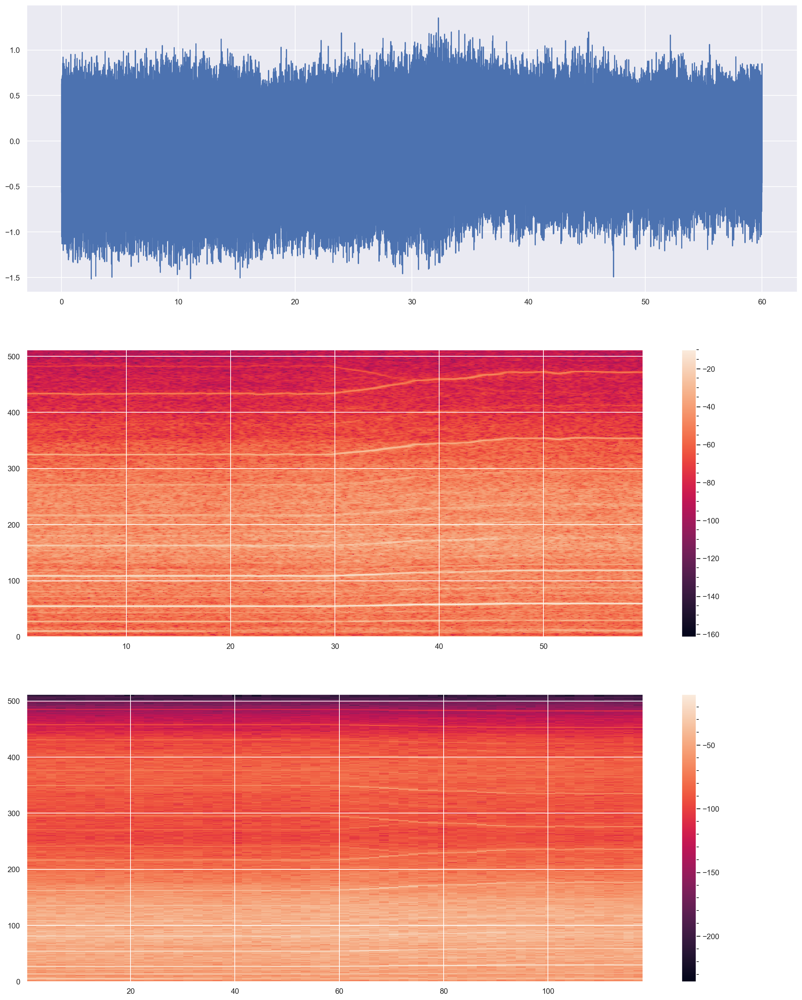

In [159]:
spectrum1, freqs1, spectrum2, freqs2 = draw_spectrum(xtrain[157])

## First order/seconde order derivative and other feature engenieering

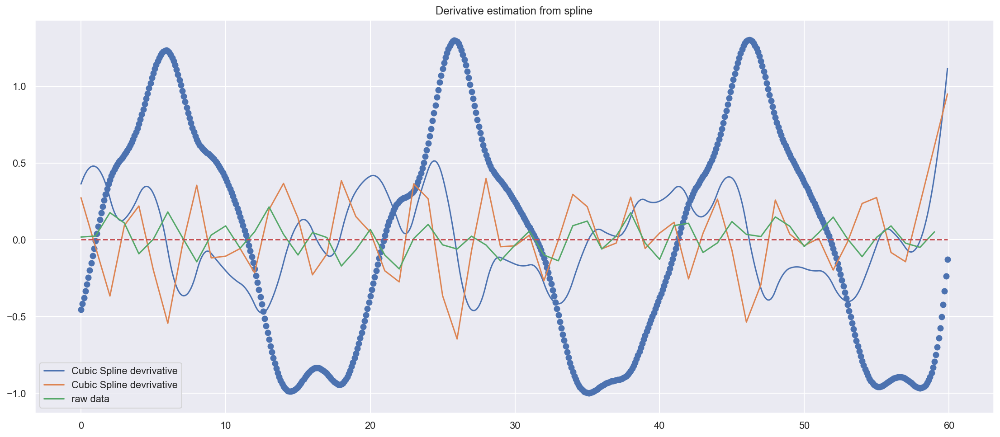

In [145]:
# first order derivative and seconde order derivative
yder1 = interpolate.splev(xnew, tck, der=1)
yder2 = interpolate.splev(xnew, tck, der=2)
plt.figure(figsize=(19, 8))

# plot Derivative of spline
plt.plot(xnew, yder1, label='Cubic Spline devrivative')
plt.plot(xnew, yder2, label='Cubic Spline devrivative')

# spline
plt.scatter(xnew, ynew)
plt.plot(range(length), xtrain[i, start:end], label='raw data')

# plot axe y=0
plt.plot(xnew, np.zeros(len(xnew)), 'r--')
#plt.axis([-0.05, 6.33, -1.05, 1.05])
plt.title('Derivative estimation from spline')
plt.legend()
plt.show()

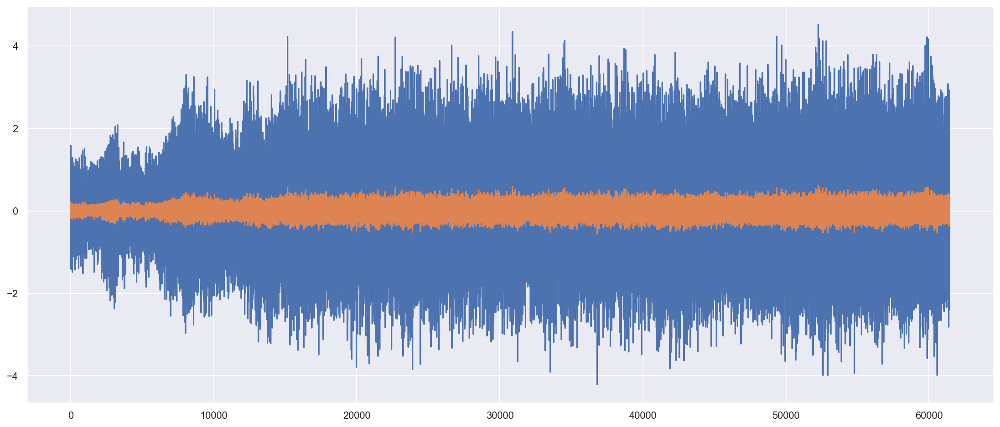

In [148]:
plt.figure(figsize=(19,8))
i=1
plt.plot(range(61440),xtrain[i+8,:61440]/abs(xtrain[i+8,:61440]).mean())
plt.plot(range(61440),xtrain[i+8,:61440])
plt.show()

## Build fonctionnal space
The Nyquist–Shannon sampling theorem is a theorem in the field of digital signal processing which serves as a fundamental bridge between continuous-time signals and discrete-time signals. It establishes a sufficient condition for a sample rate that permits a discrete sequence of samples to capture all the information from a continuous-time signal of finite bandwidth.

If a function ${\displaystyle }x(t)$ contains no frequencies higher than B hertz, it is completely determined by giving its ordinates at a series of points spaced ${\displaystyle }{\displaystyle 1/(2B)}$ seconds apart.

A sufficient sample-rate is therefore anything larger than ${\displaystyle }2B$ samples per second. Equivalently, for a given sample rate ${\displaystyle }f_{s}$, perfect reconstruction is guaranteed possible for a bandlimit ${\displaystyle }{\displaystyle B<f_{s}/2}$.

## Interpolation - Spline
In mathematics, a spline is a special function defined piecewise by polynomials. In interpolating problems, spline interpolation is often preferred to polynomial interpolation because it yields similar results, even when using low degree polynomials, while avoiding Runge's phenomenon for higher degrees.

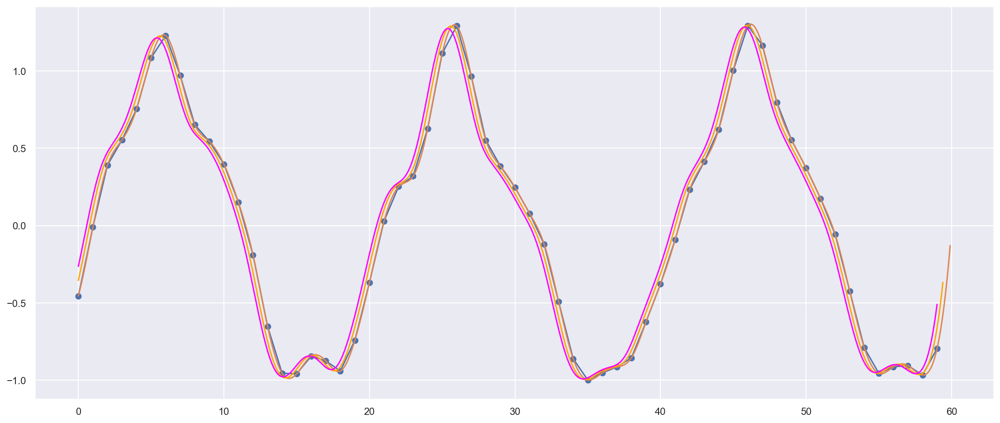

In [113]:
i = 10
k = 1
start = 0
end = 60
length = end-start
ynew = []

def rolling_window(a, window):
    shape = a.shape[:-1] + (a.shape[-1] - window + 1, window)
    strides = a.strides + (a.strides[-1],)
    return np.lib.stride_tricks.as_strided(a, shape=shape, strides=strides)

plt.figure(figsize=(19, 8))
for n in range(k):
    # spline interpolation
    tck = interpolate.splrep(range(start, end), xtrain[i+n, start:end], s=0)
    xnew = np.arange(start, end, 1/10)
    ynew = interpolate.splev(xnew, tck, der=0)

    # raw data
    plt.scatter(range(start, end), xtrain[i+n, start:end])
    plt.plot(range(start, end), xtrain[i+n, start:end])

    # spline
    # plt.scatter(xnew,ynew)
    plt.plot(xnew, ynew)

    # SMA pandas rolling
    #rolling_mean = ynew.rolling(window=20).mean()
    #rolling_mean2 = ynew.rolling(window=50).mean()

    # SMA numpy
    rolling_mean1 = np.mean(rolling_window(ynew, 6), -1)
    rolling_mean2 = np.mean(rolling_window(ynew, 10), -1)

    plt.plot(xnew[:len(rolling_mean1)], rolling_mean1,
             label='AMD 20 Day SMA', color='orange')
    plt.plot(xnew[:len(rolling_mean2)], rolling_mean2,
             label='AMD 50 Day SMA', color='magenta')

## 1st , 2nd order derivative

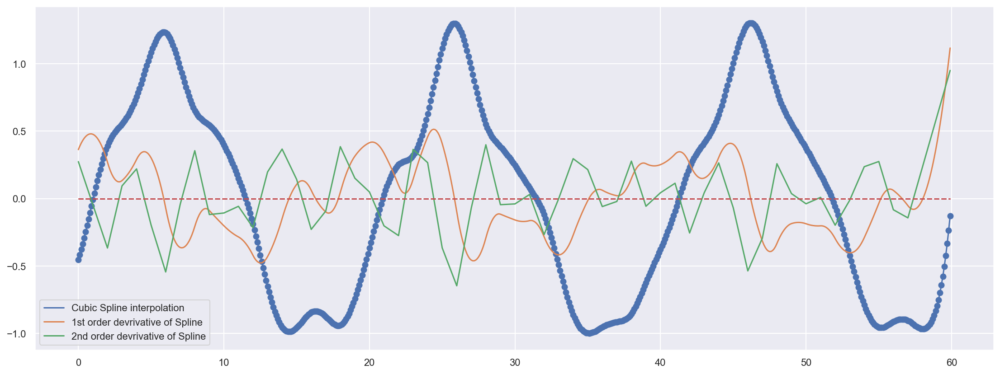

In [116]:
yder1 = interpolate.splev(xnew, tck, der=1)
yder2 = interpolate.splev(xnew, tck, der=2)

plt.figure(figsize=(19, 7))
# spline
plt.scatter(xnew, ynew)
plt.plot(xnew, ynew, label='Cubic Spline interpolation ')

# plot Derivative of spline
plt.plot(xnew, yder1, label='1st order devrivative of Spline')
plt.plot(xnew, np.zeros(len(xnew)), 'r--')

# plot Derivative of spline
plt.plot(xnew, yder2, label='2nd order devrivative of Spline')
plt.plot(xnew, np.zeros(len(xnew)), 'r--')
plt.legend()

//anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


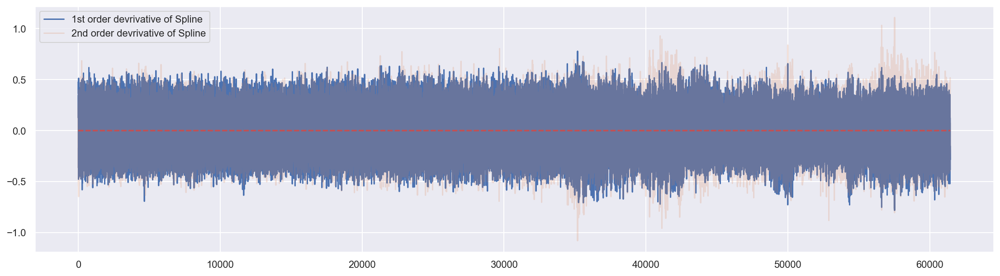

In [106]:
i=10
k=1

def plot_derive(x):
    #spline interpolation
    tck = interpolate.splrep(range(61440),x, s=0)
        #xnew = np.linspace(start,end,length*10) 
    xnew = np.arange(0,61440,1/10) 
    ynew = interpolate.splev(xnew, tck, der=0)

    yder1 = interpolate.splev(xnew, tck, der=1)
    yder2 = interpolate.splev(xnew, tck, der=2)

    plt.figure(figsize=(19,5))
    #plt.scatter(xnew,ynew)
    #plt.plot(xnew,ynew,label='Cubic Spline interpolation ')

    #plot Derivative of spline
    plt.plot(xnew, yder1,label='1st order devrivative of Spline')
    # plot axe y=0
    plt.plot(xnew,np.zeros(len(xnew)),'r--')


    #plot Derivative of spline
    plt.plot(xnew, yder2,label='2nd order devrivative of Spline',alpha=0.2)
    # plot axe y=0
    plt.plot(xnew,np.zeros(len(xnew)),'r--')
    plt.legend()
    plt.show()
    
plot_derive(xtrain[i])

//anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in true_divide
//anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


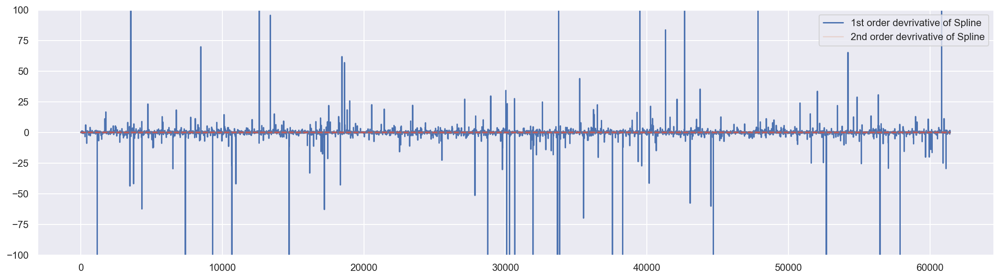

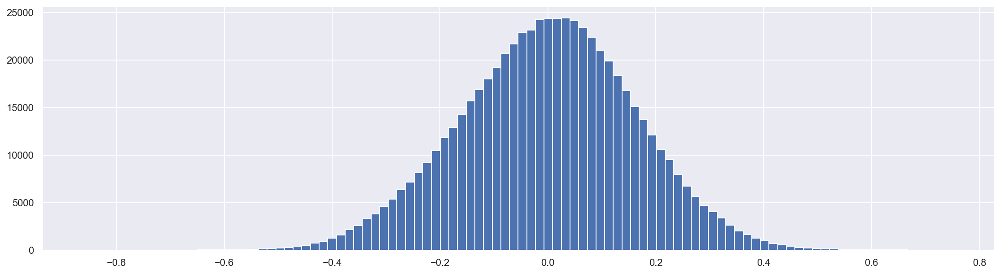

In [110]:
def plot_derive(x):
    #spline interpolation
    tck = interpolate.splrep(range(61440),x, s=0)
        #xnew = np.linspace(start,end,length*10) 
    xnew = np.arange(0,61440,1/10) 
    ynew = interpolate.splev(xnew, tck, der=0)
    yder1 = interpolate.splev(xnew, tck, der=1)
    yder2 = interpolate.splev(xnew, tck, der=2)

    plt.figure(figsize=(19,5))
    plt.ylim(-100, 100)  
    #plt.scatter(xnew,ynew)
    #plt.plot(xnew,ynew,label='Cubic Spline interpolation ')

    #plot Derivative of spline
    plt.plot(xnew, yder1/ynew/100,label='1st order devrivative of Spline')
    plt.plot(xnew,np.zeros(len(xnew)),'r--')
    
    #plot Derivative of spline
    plt.plot(xnew, yder2,label='2nd order devrivative of Spline',alpha=0.2)
    plt.legend()
    
    plt.figure(figsize=(19,5))
    plt.hist(yder2, bins=100)
    plt.show()
    
for i in range(1):    
    plot_derive(xtrain[1+i])

# Frequency Domaine
Frequency domain refers to the analysis of mathematical functions or signals with respect to frequency, rather than time. Put simply, a time-domain graph shows how a signal changes over time, whereas a frequency-domain graph shows how much of the signal lies within each given frequency band over a range of frequencies.

## Perodogram

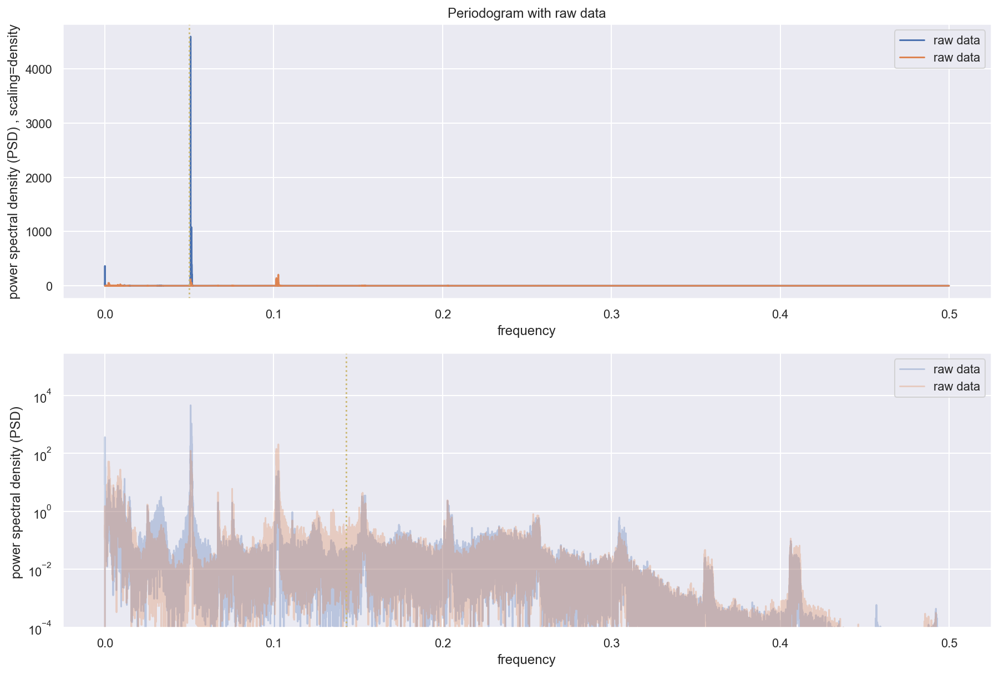

In [222]:
# plot Pedrodogram
i = 20
k = 2
ynew = []
start = 0
end = 61440
sns.set()
plt.figure(figsize=(15, 10))
plt.subplot(2, 1, 1)

for n in range(k):
    # f : ndarray : Array of sample frequencies.
    # Pxx : ndarray :Power spectral density or power spectrum of x.
    f, Pxx_den = signal.periodogram(xtrain[i+n, start:end], scaling='density')
    plt.plot(f, Pxx_den, label='raw data')
plt.xlabel('frequency')
plt.axvline(x=0.05, c='y', linestyle=':')
plt.ylabel('power spectral density (PSD) , scaling=density')
plt.title('Periodogram with raw data')
plt.legend()

plt.subplot(2, 1, 2)
for n in range(k):
    f, Pxx_den = signal.periodogram(xtrain[i+n, start:end], scaling='density')
    # This is just a thin wrapper around plot which additionally changes the y-axis to log scaling.
    plt.semilogy(f, Pxx_den, alpha=0.3, label='raw data')
# https://matplotlib.org/3.1.1/api/_as_gen/matplotlib.pyplot.semilogy.html
plt.ylim(10e-5,)
plt.axvline(x=1/7, c='y', linestyle=':')
plt.xlabel('frequency')
plt.ylabel('power spectral density (PSD) ')
plt.legend()
plt.show()

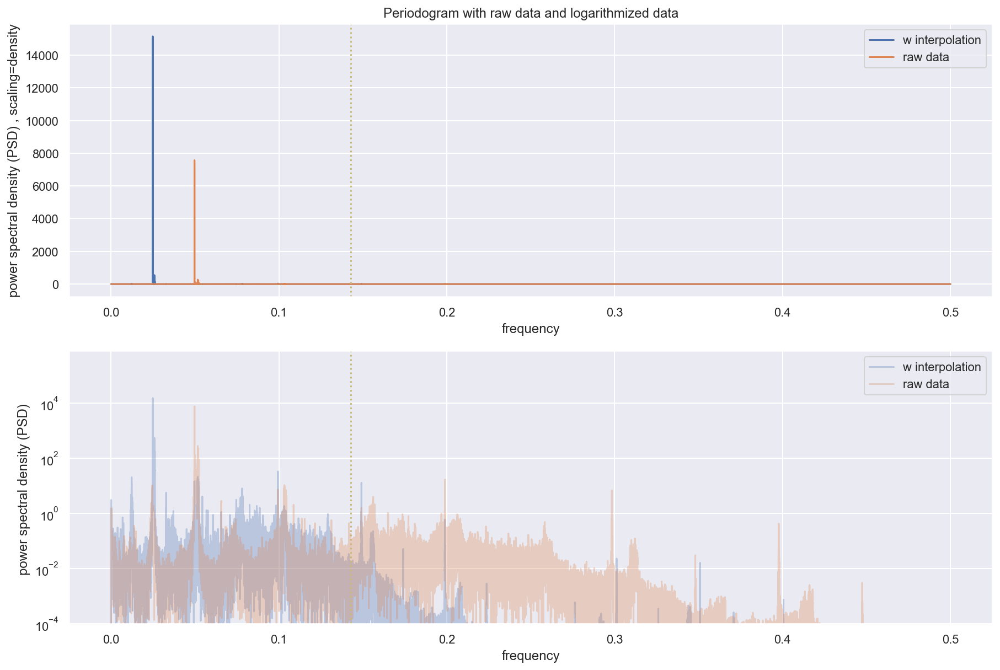

In [214]:
# plot Pedrodogram for interpolated data
i = 10
k = 1
ynew = []
start=0
end=61440

for n in range(k):
    # spline interpolation
    tck = interpolate.splrep(range(61440), xtrain[i+n, ], s=0)
    xnew = np.arange(start, end, 1/2)
    y = interpolate.splev(xnew, tck, der=0)
    ynew.append(y)

sns.set()
plt.figure(figsize=(15, 10))
plt.subplot(2, 1, 1)

for n in range(k):
    # f : ndarray : Array of sample frequencies.
    # Pxx : ndarray :Power spectral density or power spectrum of x.
    f, Pxx_den = signal.periodogram(ynew[n], scaling='density')
    plt.plot(f, Pxx_den,label='w interpolation')
    f, Pxx_den = signal.periodogram(xtrain[i+n, start:end], scaling='density')
    plt.plot(f, Pxx_den,label='raw data')

plt.xlabel('frequency')
plt.axvline(x=1/7, c='y', linestyle=':')

plt.ylabel('power spectral density (PSD) , scaling=density')
plt.title('Periodogram with raw data ')
plt.legend()

plt.subplot(2, 1, 2)

for n in range(k):
    f, Pxx_den = signal.periodogram(ynew[n], scaling='density')
    # This is just a thin wrapper around plot which additionally changes the y-axis to log scaling.
    plt.semilogy(f, Pxx_den, alpha=0.3,label='w interpolation')
    
    f, Pxx_den = signal.periodogram(xtrain[i+n, start:end], scaling='density')
    # This is just a thin wrapper around plot which additionally changes the y-axis to log scaling.
    plt.semilogy(f, Pxx_den, alpha=0.3,label='raw data')
# https://matplotlib.org/3.1.1/api/_as_gen/matplotlib.pyplot.semilogy.html
plt.ylim(10e-5,)
plt.axvline(x=1/7, c='y', linestyle=':')
plt.xlabel('frequency')
plt.ylabel('power spectral density (PSD) ')
plt.legend()
plt.show()

## FFT Fast Fourier Transformation

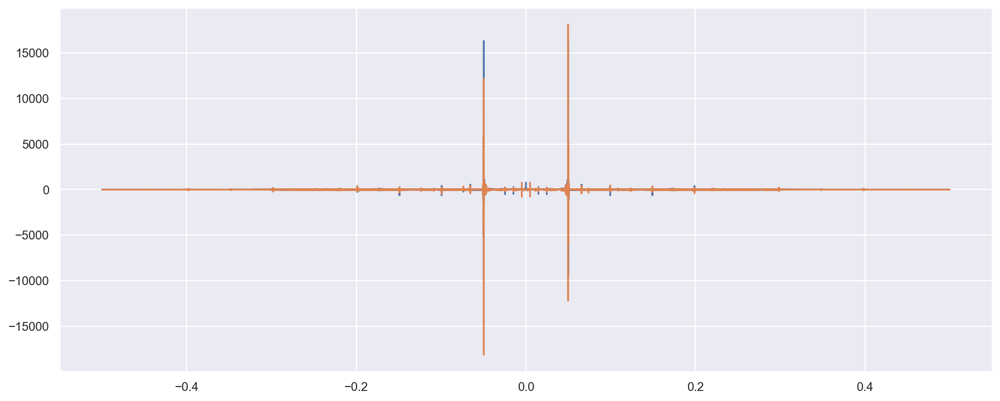

In [68]:
i=2
start=0
end=61440
length=end-start
sp = np.fft.fft(xtrain[i,start:end])
freq = np.fft.fftfreq(length)
sns.set()
plt.figure(figsize=(15, 6))
plt.plot(freq, sp.real, freq, sp.imag)
plt.show()

The DTFT, X(e
jΩ), is periodic. One period extends from f = 0 to fs, where fs
is the sampling frequency.

The FFT contains information between 0 and fs, however, we know that the sampling frequency
5
must be at least twice the highest frequency component. Therefore, the signal’s spectrum should
be entirly below
fs
2
, the Nyquist frequency.

//anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:23: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.


(-5, 110)

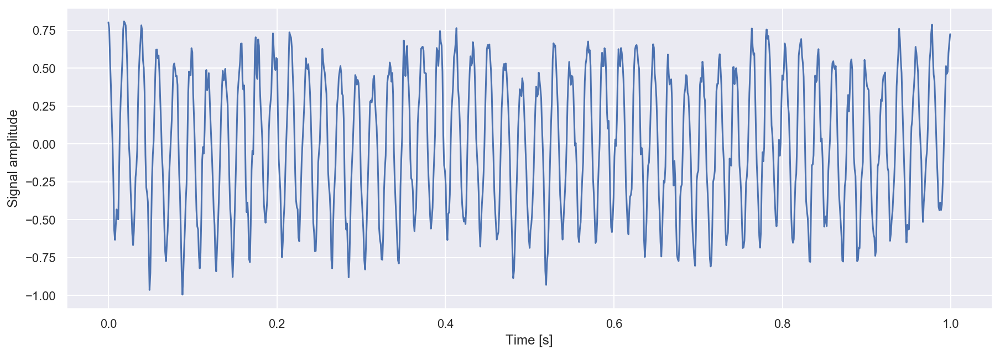

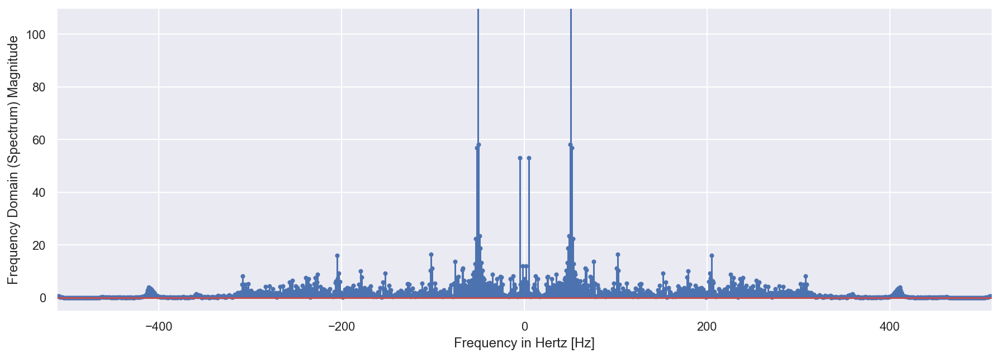

In [554]:
f = 1  # Frequency, in cycles per second, or Hertz
f_s = 1024  # Sampling rate, or number of measurements per second
i=5
start=0
end=1024
length=end-start

#t = np.linspace(0, 60, 60*f_s, endpoint=False)
t = np.linspace(0, 1, 1*f_s, endpoint=False)
x = xtrain[i,start:end]

fig, ax = plt.subplots(figsize=(15, 5))
ax.plot(t, x)
ax.set_xlabel('Time [s]')
ax.set_ylabel('Signal amplitude')

X = fftpack.fft(x)
freqs = fftpack.fftfreq(len(x)) * f_s

fig, ax = plt.subplots(figsize=(15, 5))

ax.stem(freqs, np.abs(X),markerfmt='C0.',basefmt='C3-')
ax.set_xlabel('Frequency in Hertz [Hz]')
ax.set_ylabel('Frequency Domain (Spectrum) Magnitude')
ax.set_xlim(-f_s / 2, f_s / 2)
ax.set_ylim(-5, 110)

//anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:31: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
//anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.


(-5, 110)

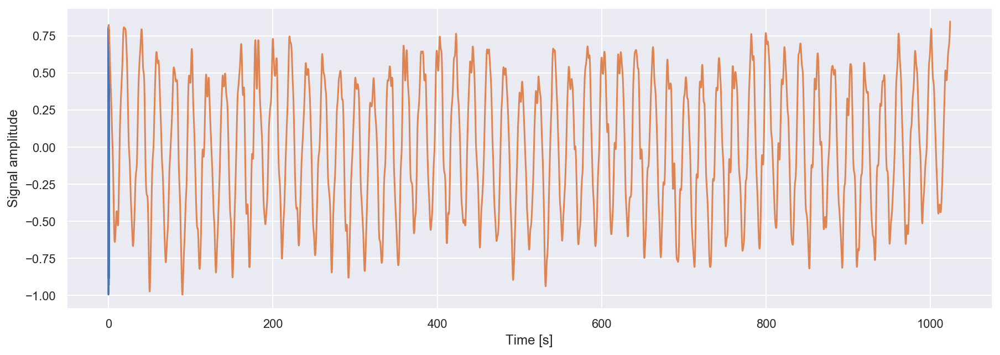

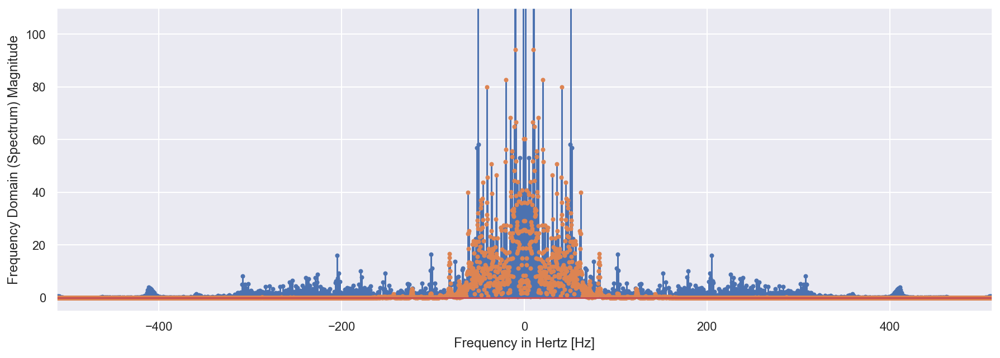

In [670]:
f = 1  # Frequency, in cycles per second, or Hertz
f_s = 1024  # Sampling rate, or number of measurements per second

i = 5
start = 0
end = 1024
length = end-start

tck = interpolate.splrep(range(length), xtrain[i+n, start:end], s=0)
xnew = np.arange(start, end, 1/5)
ynew = interpolate.splev(xnew, tck, der=0)

t = np.linspace(0, 1, 1*f_s, endpoint=False)

fig, ax = plt.subplots(figsize=(15, 5))
ax.plot(t, xtrain[i+n, start:end])
ax.plot(xnew, ynew)
ax.set_xlabel('Time [s]')
ax.set_ylabel('Signal amplitude')

x = xtrain[i+n, start:end]
X = fftpack.fft(x)
freqs = fftpack.fftfreq(len(x)) * f_s

fig, ax = plt.subplots(figsize=(15, 5))

ax.stem(freqs, np.abs(X), markerfmt='C0.', basefmt='C3-')

x2 = ynew
X = fftpack.fft(x2)
freqs = fftpack.fftfreq(len(x2)) * f_s
ax.stem(freqs, np.abs(X), markerfmt='C1.', basefmt='C3-')
ax.set_xlabel('Frequency in Hertz [Hz]')
ax.set_ylabel('Frequency Domain (Spectrum) Magnitude')
ax.set_xlim(-f_s / 2, f_s / 2)
ax.set_ylim(-5, 110)

## STFT Short-term Fourier Transformation
Short time Fourier transform (STFT) is one of the methods of linear time-frequency analysis that can provide localized spectrum in time domain by applying Fourier transform in a localized time window.

In [ ]:
scipy.signal.stft(x, fs=1.0, window='hann', nperseg=256, noverlap=None, nfft=None,
                  detrend=False, return_onesided=True, boundary='zeros', padded=True, axis=-1)[source]

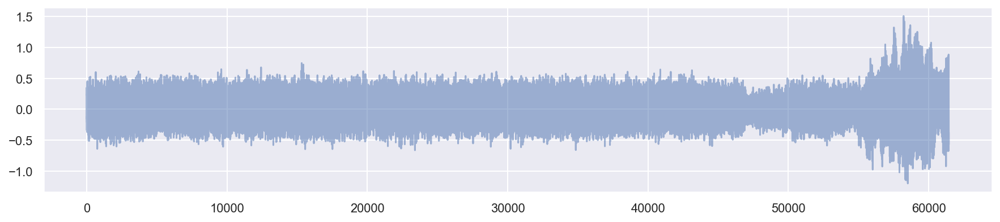

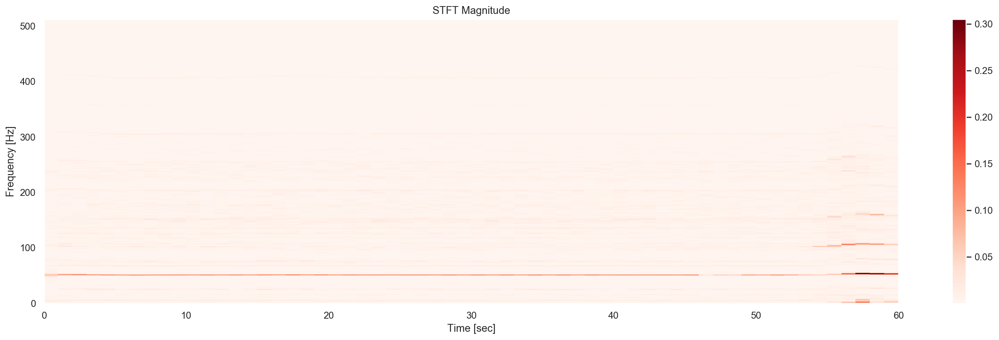

In [134]:
# Sampling frequency of the x time series
fs = 1024
i = 6
plt.figure(figsize=(15, 3))
plt.plot(xtrain[i], alpha=0.5)

def cal_STFT(x):
    """f  Array of sample frequencies.
    t  Array of segment times.
    Zxx - STFT of x. By default, the last axis of Zxx corresponds to the segment times."""
    f, t, Zxx = signal.stft(x, fs, nperseg=1024, noverlap=0)  # 100 // 20)
    return f,Zxx

def plot_STFT(x):
    plt.figure(figsize=(22, 6))
    """f  Array of sample frequencies.
    t  Array of segment times.
    Zxx - STFT of x. By default, the last axis of Zxx corresponds to the segment times."""
    f, t, Zxx = signal.stft(x, fs, nperseg=1024, noverlap=0)  # 100 // 20)
    plt.pcolormesh(t, f, np.abs(Zxx), cmap='Reds')  # , vmin=0)
    plt.title('STFT Magnitude')
    plt.ylabel('Frequency [Hz]')
    plt.xlabel('Time [sec]')
    plt.colorbar()
    return 

plot_STFT(xtrain[i])
#spectrum, freqs = plot_spectrum(xtrain[i])

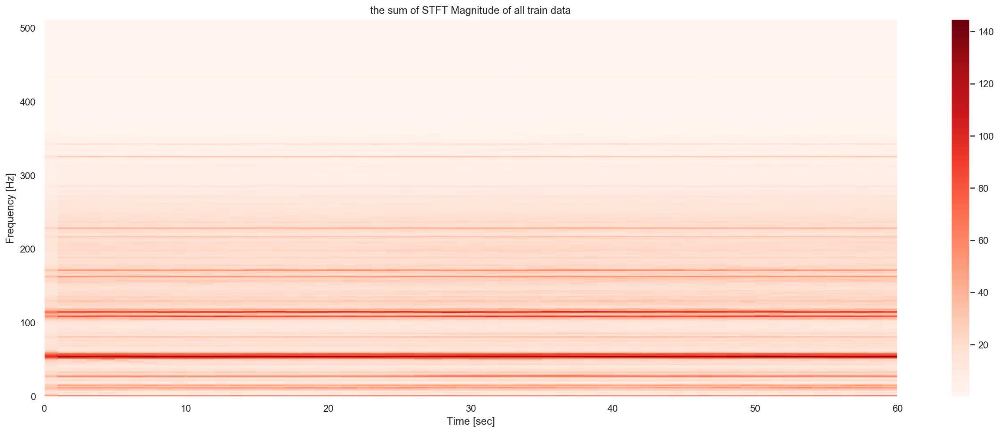

In [135]:
# the sum of STFT of all train data
plt.figure(figsize=(22, 8))
ZxxTotal=np.zeros(Zxx.shape)
for i in range(len(xtrain)):
    f, t, Zxx = signal.stft(xtrain[i], fs, nperseg=1024, noverlap=0)  # 100 // 20)
    ZxxTotal=ZxxTotal+np.abs(Zxx)
plt.pcolormesh(t, f, np.abs(ZxxTotal), cmap='Reds')  # , vmin=0)
plt.title('the sum of STFT Magnitude of all train data')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
plt.colorbar()
plt.show()

I observe the great difference of global patern of train and test dataset, in the test dataset, a lot of samples are concentrated on 0Hz frenquency.  While in the **train dataset we can see a very strong density around 50Hz and 100Hz, and their multiples. This corresponde an hypothese of self-exciting ocillation anormaly**. 

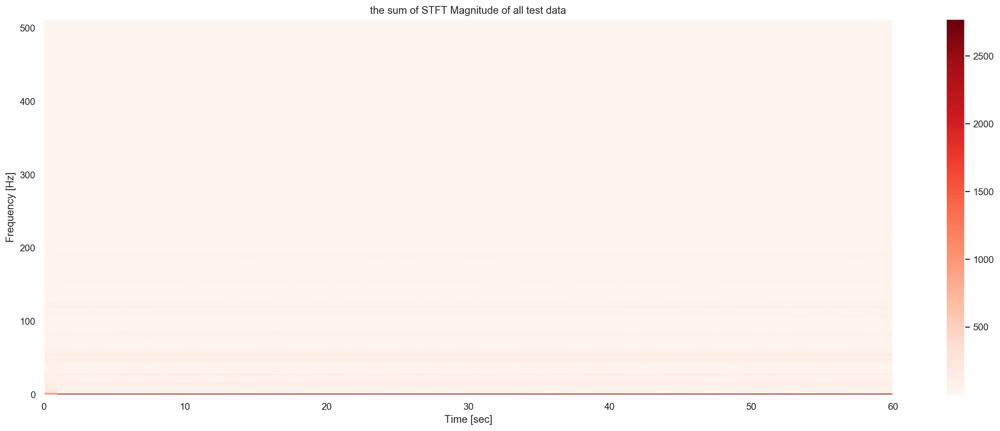

In [138]:
# the sum of STFT of all test data
plt.figure(figsize=(22, 8))
ZxxTotal=np.zeros(Zxx.shape)
for i in range(len(xtest)):
    f, t, Zxx = signal.stft(xtest[i], fs, nperseg=1024, noverlap=0)  # 100 // 20)
    ZxxTotal=ZxxTotal+np.abs(Zxx)
plt.pcolormesh(t, f, np.abs(ZxxTotal), cmap='Reds')  # , vmin=0)
plt.title('the sum of STFT Magnitude of all test data')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
plt.colorbar()
plt.show()

In [1027]:
pd.DataFrame(np.abs(Zxx)).T.describe()

,0,1,2,3,4,5,6,7,8,9,...,41,42,43,44,45,46,47,48,49,50
count,616.000000,616.000000,616.000000,616.000000,616.000000,616.000000,616.000000,616.000000,616.000000,616.000000,...,616.000000,616.000000,616.000000,616.000000,616.000000,616.000000,616.000000,616.000000,616.000000,616.000000
mean,0.032502,0.017276,0.021068,0.020759,0.229899,0.450074,0.221167,0.013343,0.010071,0.019957,...,0.001450,0.000304,0.000160,0.000289,0.000394,0.000170,0.000092,0.000094,0.000160,0.000225
std,0.018123,0.010109,0.011643,0.012321,0.040605,0.060651,0.021299,0.008100,0.005901,0.006707,...,0.000581,0.000587,0.000446,0.000426,0.000425,0.000418,0.000418,0.000419,0.000412,0.000422
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.026377,0.012484,0.012453,0.011646,0.232824,0.455731,0.217639,0.007815,0.005941,0.015581,...,0.001180,0.000119,0.000071,0.000211,0.000337,0.000117,0.000039,0.000038,0.000094,0.000099
50%,0.030782,0.016234,0.019834,0.019252,0.240609,0.464186,0.224038,0.012367,0.009323,0.020171,...,0.001339,0.000180,0.000114,0.000275,0.000398,0.000152,0.000063,0.000058,0.000138,0.000199
75%,0.036612,0.020613,0.028318,0.027131,0.247539,0.471800,0.229840,0.017453,0.012947,0.024303,...,0.001584,0.000263,0.000164,0.000334,0.000446,0.000190,0.000091,0.000087,0.000188,0.000299
max,0.240832,0.123651,0.067580,0.094502,0.279502,0.529780,0.265941,0.098793,0.065294,0.063497,...,0.011561,0.010952,0.010645,0.010593,0.010586,0.010430,0.010310,0.010280,0.010233,0.010196


## STFT Matrix and UMAP

In [58]:
# STFT matrix
xtrain_STFT = []
for i in range(400):
    f, Zxx = cal_STFT(xtrain[i])
    xtrain_STFT.append(np.abs(Zxx))
xtrain_STFT.shape

AttributeError: 'list' object has no attribute 'shape'

In [1335]:
# PCA transform only on 2 dimension , can use average frequence sequence
#average frequence
#plt.plot((f@np.abs(Zxx))/np.sum(np.abs(Zxx),axis=0))
xtrain_STFT_2D_mean=np.zeros
for i,Zxx in enumerate (xtrain_STFT):
    if i==0:
        xtrain_STFT_2D_mean=Zxx
    else:
        xtrain_STFT_2D_mean=np.vstack((xtrain_STFT_2D_mean,f@Zxx/np.sum(Zxx,axis=0)))
pca1 = PCA(n_components=2, whiten=True)
#pca1.fit(xtrain[:500, :])
xtrain_fpca = pca1.fit_transform(xtrain_STFT_2D_mean)

# Fit the low-dimensional method
lof1 = LocalOutlierFactor(n_neighbors=5, contamination='auto', novelty=True)
lof1.fit(xtrain_fpca)

# Calculate anomaly score on the (PCA-transformed) test data
xtest_fpca = pca1.fit_transform(xtest[:1000])
sscore = -lof1.score_samples(xtest_fpca)
print(np.argmax(sscore))

111


In [1329]:
pca2 = PCA(n_components=2, whiten=True)
datapoint = pca2.fit_transform(xtrain[:500, :])
#datapoint = pca2.transform(xtrain_fpca)

# Fit the low-dimensional method
lof1 = LocalOutlierFactor(n_neighbors=5, contamination='auto', novelty=True)
lof1.fit(datapoint)
# Calculate anomaly score on the (PCA-transformed) test data
sscore = -lof1.score_samples(datapoint)
#print(sscore[:100])
label=np.where( sscore>3,1 , 0)


print('percent of the variance '+ str(sum(pca2.explained_variance_ratio_)))

plt.figure(figsize=(5, 5))
plt.scatter(datapoint[:, 0], datapoint[:, 1], c=label, cmap='Set1')
plt.show()

(61, 1)

In [ ]:
!pip uninstall umap
!pip uninstall umap-learn
!pip install umap-learn --ignore-installed llvmlite

In [60]:
import umap
from sklearn.utils.fixes import lobpcg
import umap.umap_ as umap
#from sklearn.cluster import KMeans
#import umap.plot

embedding = umap.UMAP(n_neighbors=5,
                      min_dist=0.3,
                      metric='correlation').fit_transform(xtrain[:100])

umap.plot.points(embedding)

//anaconda3/lib/python3.7/site-packages/umap/plot.py:29: UserWarning: The umap.plot package requires extra plotting libraries to be installed.
    You can install these via pip using

    pip install umap-learn[plot]

    or via conda using

    conda install datashader bokeh holoviews colorcet
    
  """


ImportError: umap.plot requires matplotlib, datashader, colorcet and holoviews to be installed

## Time–frequency analysis

Time–frequency analysis comprises those techniques that study a signal **in both the time and frequency domains simultaneously**, using various **time–frequency representations**. Rather than viewing a 1-dimensional signal (a function, real or complex-valued, whose domain is the real line) and some transform (another function whose domain is the real line, obtained from the original via some transform), time–frequency analysis studies a **two-dimensional signal – a function whose domain is the two-dimensional real plane**, obtained from the signal via a time–frequency transform.


- Why I will focus on Time–frequency analysis?

 Because signal frequency characteristics are varying with time. We can see clearly on the graphes below.

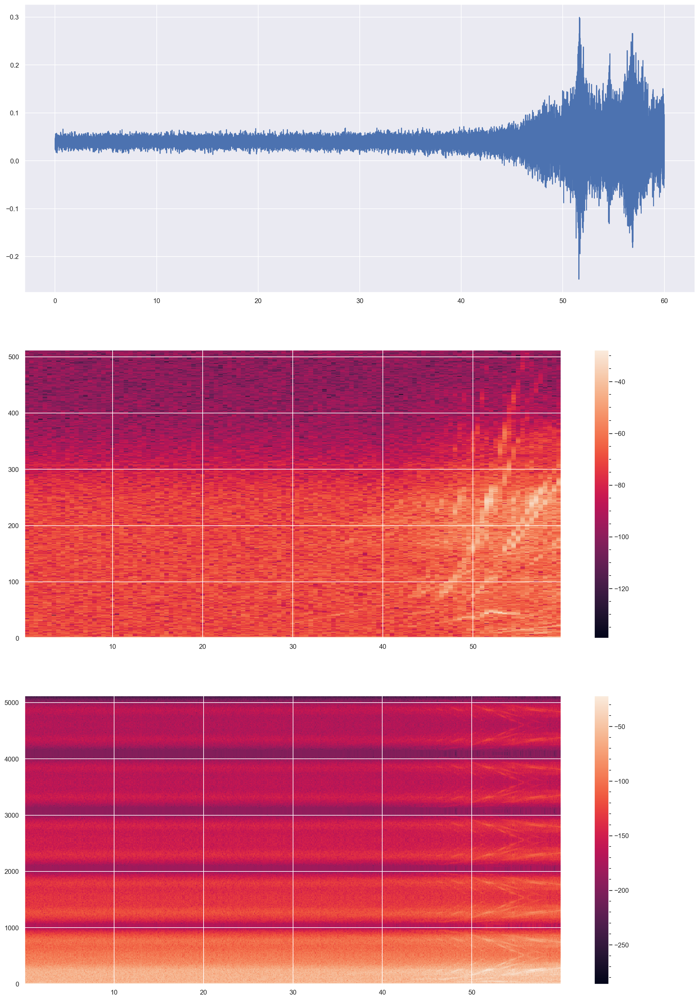

In [81]:
i = 6
for i in range(1):
    dt = 1/1024
    t = np.arange(0.0, 60.0, dt)
    s1 = xtrain[i, :]

    tck = interpolate.splrep(range(len(xtrain[i, :])), xtrain[i, :], s=0)
    xnew = np.arange(0, 61440, 1/10)
    s2 = interpolate.splev(xnew, tck, der=0)

    # the raw data
    x1 = s1   # the signal
    NFFT = 1024  # the length of the windowing segments
    Fs1 = int(1.0 / dt)  # the sampling frequency

    # the interpolated data
    x2 = s2   # the signal
    NFFT = 1024  # the length of the windowing segments
    Fs2 = int(1.0 * 10 / dt)  # the sampling frequency

    fig, (ax1, ax2, ax3) = plt.subplots(nrows=3, figsize=(20, 30))
    ax1.plot(t, x1)
    #mode : {'default', 'psd', 'magnitude', 'angle', 'phase'}
    spectrum1, freqs1, bins1, im1 = ax2.specgram(
        x1, NFFT=NFFT, Fs=Fs1, noverlap=512, mode='magnitude')
    cbar = fig.colorbar(im1, ax=ax2)
    cbar.minorticks_on()

    spectrum2, freqs2, bins2, im2 = ax3.specgram(
        x2, NFFT=NFFT, Fs=Fs2, noverlap=128, mode='magnitude')
    cbar2 = fig.colorbar(im2, ax=ax3)
    cbar2.minorticks_on()
    # The `specgram` method returns 4 objects. They are:
    # - Pxx: the periodogram
    # - freqs: the frequency vector
    # - bins: the centers of the time bins
    # - im: the matplotlib.image.AxesImage instance representing the data in the plot
    plt.show()

(513, 119)

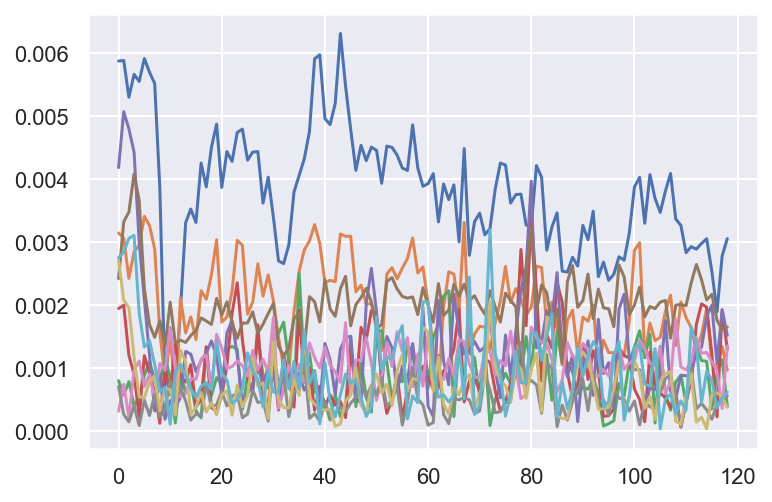

In [652]:
for i in range(10):
    plt.plot(spectrum1[i])
spectrum1.shape

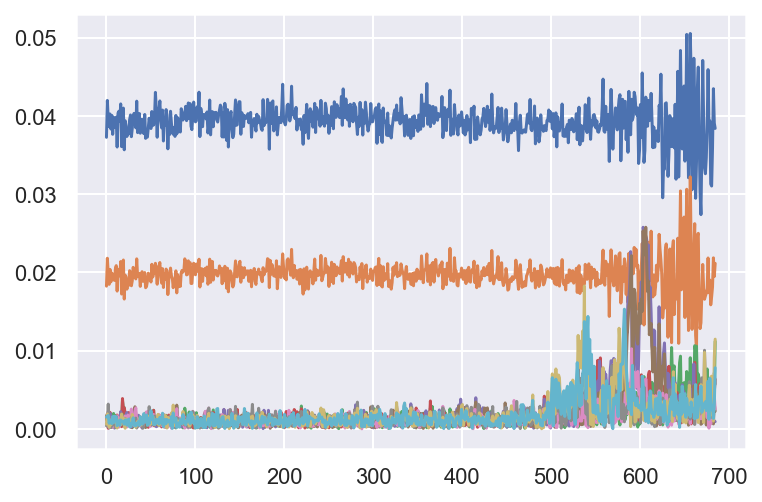

In [140]:
spectrum2[1]
for i in range(10):
    plt.plot(spectrum2[i])

# Frequency Domaine approach with STFT Matrix based 

## 2 D and 3 D STFT Matrix
**Short time Fourier transform (STFT)** is one of the methods of linear time-frequency analysis that can provide localized spectrum in time domain by applying Fourier transform in a localized time window.
A sigle STFT is a 2D time-frequency matrix, here we have a 3rd dimention which is samples.

- Why I use STFT instead of FFT? 

**Because STFT contains the frequency evolution in time**, FFT only reflect the frequency on the whole time sequence.

Here we can consider STFT as a multivariate time series.

I use weighted average STFT frenquce sequence to transforme the problem into univariate time series using 2D features (time, average freqs) for each data. 

The **3 Dimensions STFT Matrx has 3 dimension of (time, frequence , power)**. I treat this multivariate time series as image, using **2D convolutional VAE**.

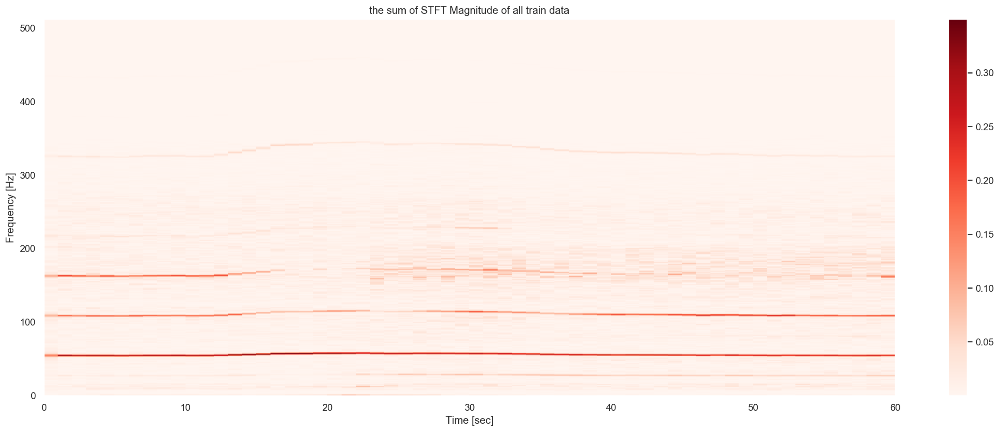

In [207]:
# a STFT spectrum example
plt.figure(figsize=(22, 8))
i=211
f, t, Zxx = signal.stft(xtrain[i], fs, nperseg=1024, noverlap=0) 
plt.pcolormesh(t, f, np.abs(np.abs(Zxx)), cmap='Reds')  
plt.title('the sum of STFT Magnitude of all train data')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
plt.colorbar()
plt.show()

In [82]:
# STFT matrix for neuro networks
def STFT_matrix_3D_array(data, n_samples):
    f, Zxx = cal_STFT(data[0])
    xtrain_STFT_3D = np.zeros(Zxx.shape)
    for i in range(n_samples):
        if i == 0:
            xtrain_STFT_3D = np.abs(Zxx)
        else:
            f, Zxx = cal_STFT(data[i])
            xtrain_STFT_3D = np.dstack([xtrain_STFT_3D, np.abs(Zxx)])
    xtrain_STFT_3D = np.moveaxis(xtrain_STFT_3D, -1, 0)
    return xtrain_STFT_3D

def STFT_matrix_3D_array_1sample(data):
    f, Zxx = cal_STFT(data)
    xtrain_STFT_3D = np.abs(Zxx)
    xtrain_STFT_3D=np.expand_dims(xtrain_STFT_3D, 0)
    return xtrain_STFT_3D


result = STFT_matrix_3D_array_1sample(xtest[2])
result.shape


(1, 513, 61)

In [87]:
# STFT matrix as list
def STFT_matrix_3D_list(data,n_samples):
    xtrain_STFT_3D = []
    for i in range(n_samples):
        f, Zxx = cal_STFT(xtrain[i])
        xtrain_STFT_3D.append(np.abs(Zxx))
    return xtrain_STFT_3D


In [91]:
# PCA transform only on 2 dimension , can use average frequence sequence
#average frequence
#plt.plot((f@np.abs(Zxx))/np.sum(np.abs(Zxx),axis=0))
xtrain_STFT_3D=STFT_matrix_3D_array(xtrain,200)
f, Zxx = cal_STFT(xtrain[1])
xtrain_STFT_2D_mean=np.zeros
for i,Zxx in enumerate (xtrain_STFT_3D):
    if i==0:
        xtrain_STFT_2D_mean=(f@Zxx)/np.sum(Zxx,axis=0)
    else:
        xtrain_STFT_2D_mean=np.vstack((xtrain_STFT_2D_mean,(f@Zxx)/np.sum(Zxx,axis=0)))


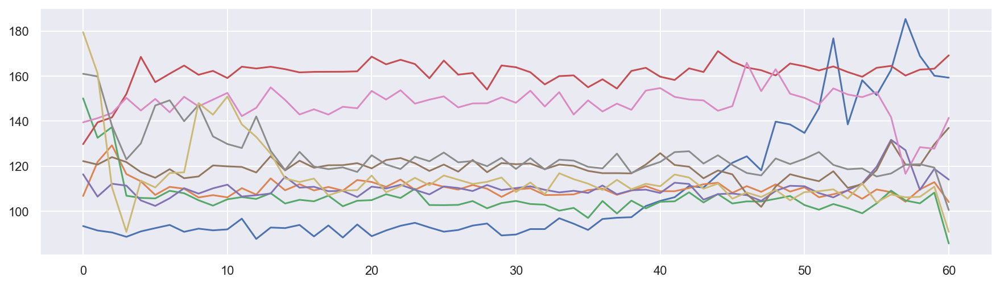

In [92]:
plt.figure(figsize=(15,4))
for i in range(9):
    plt.plot(xtrain_STFT_2D_mean[i])

In [98]:
def viz_PCA(x, labels):
    pca = PCA(n_components=2).fit(x)
    datapoint = pca.transform(x)
    plt.figure(figsize=(5, 5))
    plt.scatter(datapoint[:, 0], datapoint[:, 1], c=labels, cmap='Set1', s=1)
    plt.show()


def viz_PCA3D(x, labels):
    pca3D = PCA(n_components=3).fit(x)
    datapoint3D = pca3D.transform(x)
    fig = plt.figure(figsize=(5, 5))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(datapoint3D[:, 0], datapoint3D[:, 1],
               datapoint3D[:, 2], c=labels, cmap='Set1', s=1)
    plt.show()

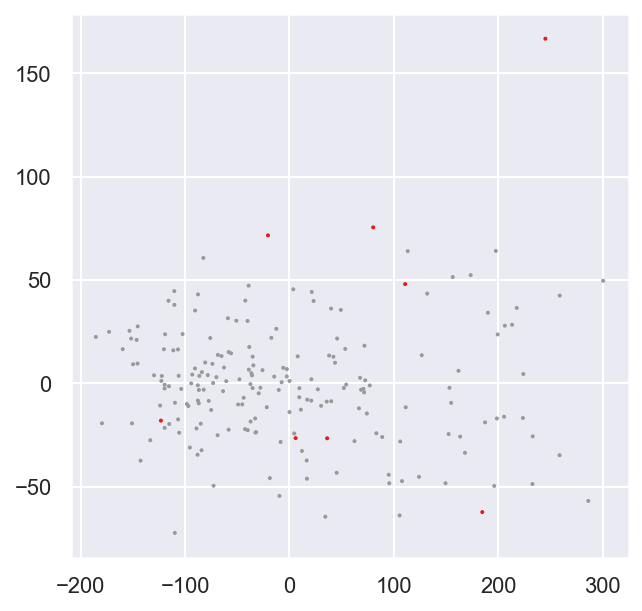

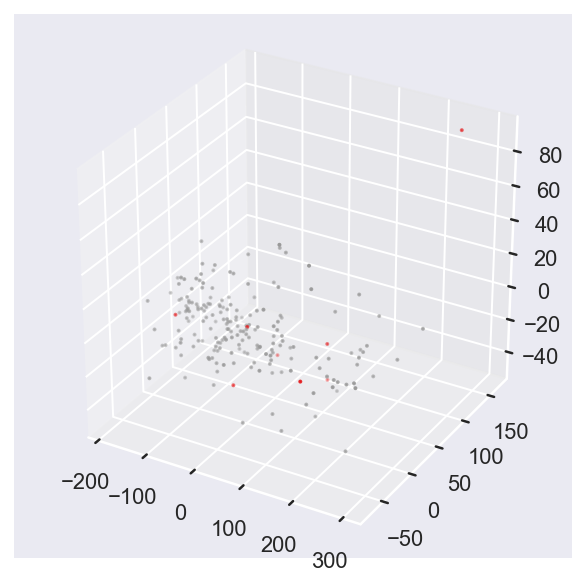

In [100]:
# Fit the low-dimensional method
lof1 = LocalOutlierFactor(n_neighbors=5, contamination='auto', novelty=False)
labels=lof1.fit_predict(xtrain_STFT_2D_mean)
# Calculate anomaly score on the (PCA-transformed) train data
#sscore = -lof1.score_samples(xtrain_STFT_2D_mean)

#labels=np.where( sscore<np.percentile(sscore,10),1 , 0)
viz_PCA(xtrain_STFT_2D_mean,labels)
viz_PCA3D(xtrain_STFT_2D_mean,labels)


percent of the variance 0.9959792068249499


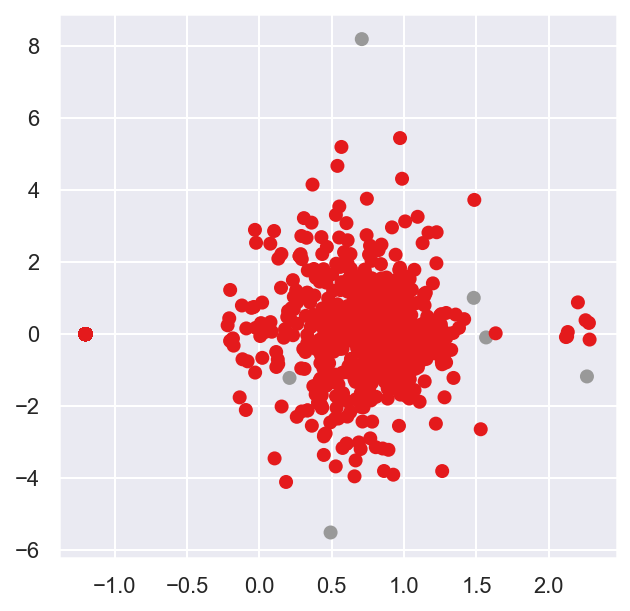

5


In [1359]:
pca2 = PCA(n_components=2, whiten=True)
datapoint = pca2.fit_transform(xtrain_STFT_2D_mean)

# Fit the low-dimensional method
lof1 = LocalOutlierFactor(n_neighbors=5, contamination='auto', novelty=True)
lof1.fit(datapoint)
# Calculate anomaly score on the (PCA-transformed) test data
sscore = -lof1.score_samples(datapoint)
#print(sscore[:100])
label=np.where( sscore>np.percentile(sscore,99),1 , 0)

print('percent of the variance '+ str(sum(pca2.explained_variance_ratio_)))

plt.figure(figsize=(5, 5))
plt.scatter(datapoint[:, 0], datapoint[:, 1], c=label, cmap='Set1')
plt.show()
print(np.argmax(sscore))

## Univariate Time Series treatment
### LOF - on STFT 61-dimensional space
- Features: STFT (average frequence for T )
- Features dimenstion: 61
- Data: train data
- Algorithm: PCA + LOF
- Parameter: Novelty 
- Scoring:
- ** AUC :0.598095653034**  

In [14]:
# STFT matrix
xtrain_STFT = []
for i in range(len(xtrain)):
    f, Zxx = cal_STFT(xtrain[i])
    xtrain_STFT.append(np.abs(Zxx))

xtest_STFT = []
for i in range(len(xtest)):
    f, Zxx = cal_STFT(xtest[i])
    xtest_STFT.append(np.abs(Zxx))
print(len(xtrain_STFT),xtrain_STFT[1].shape, len(xtest_STFT),xtest_STFT[1].shape)

1677 (513, 61) 2511 (513, 61)


In [71]:
# LOF only take 2 dimension data, 
#we can use average frequence for each second to reduce the dimenstion form 1677*513*61 to 1677*61
#plt.plot((f@np.abs(Zxx))/np.sum(np.abs(Zxx),axis=0))
xtrain_STFT_2D_mean=np.zeros
for i,Zxx in enumerate (xtrain_STFT):
    if i==0:
        xtrain_STFT_2D_mean=f@Zxx/np.sum(Zxx,axis=0)
    else:
        xtrain_STFT_2D_mean=np.vstack((xtrain_STFT_2D_mean,f@Zxx/np.sum(Zxx,axis=0)))
        

xtest_STFT_2D_mean=np.zeros
for i,Zxx in enumerate (xtest_STFT):
    if i==0:
        xtest_STFT_2D_mean=f@Zxx/np.sum(Zxx,axis=0)
    else:
        xtest_STFT_2D_mean=np.vstack((xtest_STFT_2D_mean,f@Zxx/np.sum(Zxx,axis=0)))

//anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in true_divide


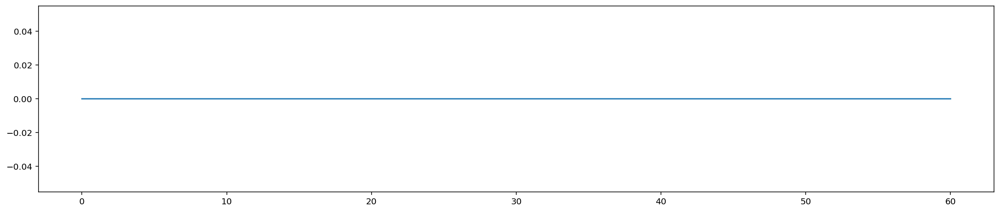

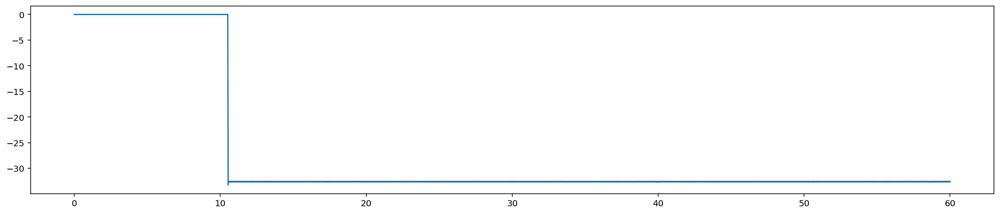

In [100]:
xtest_STFT_2D_mean[2433]
plot_wave(xtest[2019])
plot_wave(xtest[2433])

In [93]:
#for data 2019 and 2433, we get Nan STFT value , we put into 0 
#xtest_STFT_2D_mean=np.where(xtest_STFT_2D_mean=='nan',0,xtest_STFT_2D_mean)
xtest_STFT_2D_mean[2019]=0
xtest_STFT_2D_mean[2433,:11]=0
np.argwhere(np.isnan(xtest_STFT_2D_mean))

array([], shape=(0, 2), dtype=int64)

In [95]:
# Fit the low-dimensional method (61 dimentions)
lof1 = LocalOutlierFactor(n_neighbors=5, contamination='auto', novelty=True)
lof1.fit(xtrain_STFT_2D_mean)

# Calculate anomaly score on the 61 dimentions test data
sscore = -lof1.score_samples(xtest_STFT_2D_mean)
print(np.argmax(sscore))
print(sscore[:100])

2311
[2.14230192 1.11135362 1.35384811 1.4521224  1.18375365 1.00607235
 1.67000401 1.04319292 1.34493132 1.08161104 1.57777483 1.09737071
 1.32693148 1.42654253 1.54360029 1.54377987 1.19542616 1.37705771
 1.2376554  1.0105305  1.12764334 1.00225473 0.97788934 1.439226
 1.57469122 0.99459786 1.05443873 1.34751686 1.58683548 1.45528778
 1.94314679 1.17690795 2.16308591 1.17353958 2.74496248 1.07331479
 1.91877051 1.47795736 1.01077838 1.61537414 1.01330358 1.05118697
 1.74378951 1.76517957 1.63894878 1.15366661 1.03735768 1.19322504
 1.44005321 0.99744058 1.44199473 0.99057194 1.07444872 1.909906
 1.04979519 0.98305079 1.11060691 1.61465882 2.31594236 1.01027891
 2.46329005 1.07860257 1.15273693 1.12218013 1.34045482 1.00911019
 2.98103279 0.9958891  1.47778824 1.65602411 2.24029097 0.98169738
 1.06934452 0.98756354 1.41336969 1.47771291 1.01534822 1.02494109
 1.30349208 0.98278264 1.23225156 3.84589322 1.26524887 1.11680578
 1.47042921 1.42343774 1.57388363 1.59768455 1.36923146 1.389

1.772134178279798
10892.022004092021


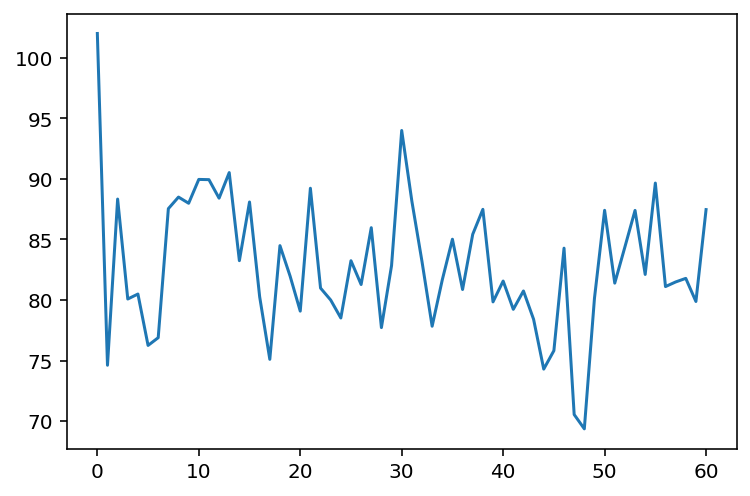

In [96]:
print(sscore[2019])
print(sscore[2433])
plt.plot(xtest_STFT_2D_mean[1])

In [97]:
# Save the anomaly scores to file
print(sscore.shape)
np.savetxt('ytest_challenge_student3.csv', sscore, fmt = '%1.6f', delimiter=',')

(2511,)


### LOF on a STFT PCA 10-dimensional space
- Features: STFT (average frequence for T )
- Features dimenstion: 10
- Data: train data
- Algorithm: PCA + LOF
- Parameter: Novelty 
- Scoring:
- ** AUC :0.516262498919**  

In [106]:
# PCA transform
pca1 = PCA(n_components = 10, whiten = True)
xtrain_fpca = pca1.fit_transform(xtrain_STFT_2D_mean)
# Fit the low-dimensional method
lof1 = LocalOutlierFactor(n_neighbors = 5 ,contamination = 'auto', novelty = True)
lof1.fit(xtrain_fpca)
# Calculate anomaly score on the (PCA-transformed) test data
xtest_fpca = pca1.fit_transform(xtest_STFT_2D_mean)
sscore = -lof1.score_samples(xtest_fpca)
print(sscore[:100])

[3.01517002e+00 1.30388187e+00 1.44563409e+00 1.36828837e+00
 1.04447512e+00 1.13864849e+00 1.32161137e+00 1.48011556e+00
 1.24997893e+00 9.93220428e-01 1.46206566e+00 1.42423436e+00
 1.25280066e+00 1.08001269e+00 1.50302260e+00 1.12726388e+00
 1.14216855e+00 5.24836859e+03 1.53860835e+00 1.15970435e+00
 5.93068318e+02 1.22228785e+00 1.27887212e+00 1.51981131e+00
 1.20927726e+00 1.16550304e+00 1.18545922e+00 1.25453156e+00
 2.10031127e+03 1.65565833e+00 1.50664282e+00 1.20541997e+00
 2.00063726e+03 1.22879727e+00 1.46918214e+00 1.19674342e+00
 1.15323784e+00 1.60929937e+00 7.58104484e+02 2.00394428e+00
 1.22200512e+00 1.30557672e+00 4.73638749e+02 1.56901876e+00
 1.97156059e+00 1.28465525e+00 1.10269450e+00 1.16382347e+00
 1.57066663e+00 1.16182259e+00 1.24682574e+00 1.19902392e+00
 1.39318204e+00 1.55370802e+00 1.13448521e+00 1.13312108e+00
 1.12008381e+00 2.34207130e+00 2.31219825e+00 1.10113221e+00
 1.61151248e+00 1.39134691e+00 1.20778336e+00 1.05308193e+00
 1.46611631e+00 9.884763

## 3D STFT Matrix and LSTM - Multivariate Time Series

In [102]:
def get_batch(source, i, seq_len, evaluation=False):
    # Deal with the possibility that there's not enough data left for a full sequence
    seq_len = min(seq_len, len(source) - 1 - i)
    # Take the input data seq
    data = source[:,i:i+seq_len]
    # target data is the next slice after input data
    target = source[:,i+1+seq_len]
    return data, target

In [192]:


"""for i in range(4):
    if i ==0:
        xtrain_STFT=np.abs(Zxx)
    else:
        Zxx=cal_STFT(xtrain[i])
        xtrain_STFT=np.dstack([xtrain_STFT,np.abs(Zxx)])
xtrain_STFT = np.moveaxis(xtrain_STFT, -1, 0)"""

seq_len=3

model=Sequential()
model.add(layers.LSTM(units=268,input_shape=(513,seq_len),return_sequences=False))

model.add(layers.Dense(513))

model.compile(optimizer=RMSprop(lr=0.01),loss='mae')
#history=model.fit(data_batch,targets_batch,steps_per_epoch=5,          epochs=2)
model.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_4 (LSTM)                (None, 268)               291584    
_________________________________________________________________
dense_13 (Dense)             (None, 513)               137997    
Total params: 429,581
Trainable params: 429,581
Non-trainable params: 0
_________________________________________________________________


In [197]:
len(xtrain_STFT_3D[:100])

100

In [198]:
# k for each 60s data
for k in range(len(xtrain_STFT_3D[:])):

    # i:range(0,61,2)
    for i in (range(0, xtrain_STFT_3D[k].shape[-1], seq_len)):
        if i+seq_len+1 < xtrain_STFT_3D[k].shape[-1]:
            # get data:(513*seq_len)  targets:(513*1)
            data, targets = get_batch(xtrain_STFT_3D[k], i, seq_len)

        if i == 0:
            data_seq = data
            targets_seq = targets
        else:
            if data.shape[1] != seq_len:
                pass
            else:
                # build a batch of data/targets for xtrain_STFT_3D[k]
                data_seq = np.dstack([data_seq, data])
                targets_seq = np.dstack([targets_seq, targets])

        # print(data_seq.shape)
    data_seq = np.moveaxis(data_seq, -1, 0)
    targets_seq = np.moveaxis(targets_seq, -1, 0)

    # Build k batchs of data/targets
    if k == 0:
        data_batch = data_seq
        targets_batch = targets_seq
    else:
        data_batch = np.dstack([data_batch, data_seq])
        targets_batch = np.dstack([targets_batch, targets_seq])

    #targets_batch= np.moveaxis(targets_batch, -1, 1)
    targets_seq_squeezed = np.squeeze(targets_seq)
    history = model.fit(data_seq, targets_seq_squeezed, steps_per_epoch=5, verbose=0,
                        epochs=2)

In [1192]:
pred_STFT=model.predict(self, x, batch_size=32, verbose=0)

4

In [1542]:
# k for each 60s data
for k in range(20):
    
    # i:range(0,61,2)
    for i in (range(0, xtrain_STFT_3D[k].shape[-1])):
        if i+seq_len+1<xtrain_STFT_3D[k].shape[-1]:
            #get data:(513*seq_len)  targets:(513*1)
            data, targets = get_batch(xtrain_STFT_3D[k], i, seq_len)
            
        if i==0:
            data_seq=data
            targets_seq=targets
            pred_seq=pred
        else:
            if data.shape[1]!=seq_len:
                pass
            else:
                #build a batch of data/targets for xtrain_STFT_3D[k]
                data_seq=np.dstack([data_seq,data])
                targets_seq=np.dstack([targets_seq,targets])
                pred_seq=np.dstack([pred_seq,pred])
    
        #print(data_seq.shape)
    data_seq= np.moveaxis(data_seq, -1, 0)
    targets_seq= np.moveaxis(targets_seq, -1, 0)
    
    
    pred_seq=model.predict(data_seq, batch_size=32, verbose=1)
    
    #Build k batchs of data/targets
    if k==0:
        data_batch=data_seq
        targets_batch=targets_seq
        pred_batch=pred_seq
        print(pred_seq.shape)
        print(pred_batch.shape)
        
    else:
        data_batch=np.dstack([data_batch,data_seq])
        targets_batch=np.dstack([targets_batch,targets_seq])
        pred_batch=np.dstack([pred_batch,pred_seq])
        print(pred_seq.shape)
        print(pred_batch.shape)
    
    #targets_batch= np.moveaxis(targets_batch, -1, 1)
    targets_seq_squeezed= np.squeeze(targets_seq)
    
pred_batch= np.moveaxis(pred_batch, -1, 0)

61/61 [==============================] - 1s 15ms/step
(61, 513)
(61, 513)
(61, 513)
(61, 513)
61/61 [==============================] - 1s 14ms/step
(61, 513)
(61, 513, 2)
(61, 513)
(61, 513, 2)
61/61 [==============================] - 1s 20ms/step
(61, 513)
(61, 513, 3)
(61, 513)
(61, 513, 3)
61/61 [==============================] - 1s 15ms/step
(61, 513)
(61, 513, 4)
(61, 513)
(61, 513, 4)
61/61 [==============================] - 1s 16ms/step
(61, 513)
(61, 513, 5)
(61, 513)
(61, 513, 5)
61/61 [==============================] - 1s 15ms/step
(61, 513)
(61, 513, 6)
(61, 513)
(61, 513, 6)
61/61 [==============================] - 1s 18ms/step
(61, 513)
(61, 513, 7)
(61, 513)
(61, 513, 7)
61/61 [==============================] - 1s 18ms/step
(61, 513)
(61, 513, 8)
(61, 513)
(61, 513, 8)
61/61 [==============================] - 1s 18ms/step
(61, 513)
(61, 513, 9)
(61, 513)
(61, 513, 9)
61/61 [==============================] - 1s 15ms/step
(61, 513)
(61, 513, 10)
(61, 513)
(61, 513, 10)
61/6

In [1544]:
pred_batch.shape

(20, 61, 513)

In [194]:
for i in range(1):
    plt.figure(figsize=(22, 4))
    plt.pcolormesh(t, f, pred.T, cmap='Reds')  # , vmin=0)
    plt.title('STFT Magnitude')
    plt.ylabel('Frequency [Hz]')
    plt.xlabel('Time [sec]')
    plt.colorbar()
    plt.show()

AttributeError: 'tensorflow.python.framework.ops.EagerTensor' object has no attribute 'T'

<Figure size 1584x288 with 0 Axes>

In [1548]:
pred_batch[1]-pred_batch[9]

array([[ 1.8626451e-07, -1.7881393e-07, -2.1755695e-06, ...,
         1.2814999e-06,  0.0000000e+00,  2.8312206e-07],
       [-1.1920929e-07, -1.7881393e-07,  2.9802322e-08, ...,
        -7.4505806e-08, -1.4901161e-07,  1.3411045e-07],
       [ 2.9802322e-07, -1.4901161e-08,  8.9406967e-08, ...,
         4.7683716e-07, -2.9802322e-07, -2.9802322e-08],
       ...,
       [-5.6624413e-07,  4.4554472e-06,  4.5597553e-06, ...,
        -2.3990870e-06,  5.9604645e-06,  1.6391277e-07],
       [-5.6624413e-07,  4.4554472e-06,  4.5597553e-06, ...,
        -2.3990870e-06,  5.9604645e-06,  1.6391277e-07],
       [-5.8114529e-07,  4.4107437e-06,  4.5001507e-06, ...,
        -2.4437904e-06,  5.9306622e-06,  1.4901161e-07]], dtype=float32)

## 3D STFT VAE conv2D

### Train VAE on Frequency Domain

In [9]:
import tensorflow as tf
#train VAE on frequency domain
#get data of 4Dimensions (samples, 513,61, channel=1)
fs = 1024
def cal_STFT(x):
    """f  Array of sample frequencies.
    t  Array of segment times.
    Zxx - STFT of x. By default, the last axis of Zxx corresponds to the segment times."""
    f, t, Zxx = signal.stft(x, fs, nperseg=1024, noverlap=512)  
    return f,Zxx

def STFT_matrix_3D_array(data, n_samples):
    f, Zxx = cal_STFT(data[0])
    xtrain_STFT_3D = np.zeros(Zxx.shape)
    for i in range(n_samples):
        if i == 0:
            xtrain_STFT_3D = np.abs(Zxx)
        else:
            f, Zxx = cal_STFT(data[i])
            xtrain_STFT_3D = np.dstack([xtrain_STFT_3D, np.abs(Zxx)])
    xtrain_STFT_3D = np.moveaxis(xtrain_STFT_3D, -1, 0)
    return xtrain_STFT_3D

x_train=STFT_matrix_3D_array(xtrain,len(xtrain))
x_train=np.expand_dims(x_train, axis=3)
x_train=tf.convert_to_tensor(x_train)

x_test=STFT_matrix_3D_array(xtest,len(xtest))
x_test=np.expand_dims(x_test, axis=3)
x_test=tf.convert_to_tensor(x_test)
print(x_train.shape,x_test.shape)

(1677, 513, 121, 1) (2511, 513, 121, 1)


In [ ]:
tf.io.write_file(
    x_test_tensorSTFT, x_test, name=None
)
tf.io.write_file(
    x_train_tensorSTFT, x_train, name=None
)

In [201]:
import keras
from tensorflow.keras import layers
#from tensorflow import keras
from keras import backend as K
from keras.models import Model
from keras.losses import mse, binary_crossentropy
class Sampling(layers.Layer):
    """Uses (z_mean, z_log_var) to sample z, the vector encoding a digit."""

    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon

In [19]:
#22222
# Train VAE
input_shape = (513, 121, 1)
original_dim = (513, 121, 1)
intermediate_dim = 64
latent_dim = 2
batch_size = 128
image_size1 = 513
image_size2 =61
filters=12
kernel_size=(2,2)

# VAE model = encoder + decoder
# build encoder model
inputs = tf.keras.Input(shape=input_shape, name='encoder_input')
x = inputs

for i in range(2):
    filters *= 2
    x = layers.Conv2D(filters=filters,
               kernel_size=kernel_size,
               activation='relu',
               strides=1,padding='valid')(x)

# shape info needed to build decoder model
shape_before_flattening = K.int_shape(x)

# generate latent vector Q(z|X)
x = layers.Flatten()(x)
x = layers.Dense(intermediate_dim, activation='relu')(x)

# use reparameterization trick to push the sampling out as input
z_mean = layers.Dense(latent_dim, name='z_mean')(x)
z_log_var = layers.Dense(latent_dim, name='z_log_var')(x)

z = Sampling()((z_mean, z_log_var))
print(z)

# instantiate encoder model
encoder = tf.keras.Model(inputs=inputs, outputs=[z_mean, z_log_var, z], name='encoder')

###############
# build decoder model
latent_inputs = tf.keras.Input(shape=(latent_dim,), name='z_sampling')
x = layers.Dense(shape_before_flattening[1] * shape_before_flattening[2]*shape_before_flattening[3], activation='relu')(latent_inputs)


x = layers.Reshape((shape_before_flattening[1],shape_before_flattening[2],shape_before_flattening[3]))(x)

for i in range(2):
    x = layers.Conv2DTranspose(filters=filters,
                        kernel_size=kernel_size,
                        activation='relu',
                        strides=1,padding='valid')(x)
    filters //= 2

outputs = layers.Conv2DTranspose(filters=1,
                          kernel_size=kernel_size,
                          activation='sigmoid',
                          padding='same',
                          name='decoder_output')(x)
    
# instantiate decoder model
decoder = tf.keras.Model(inputs=latent_inputs, outputs=outputs, name='decoder')
encoder.summary()
decoder.summary()

################### instantiate VAE model
#outputs2 = decoder(encoder(inputs)[2])
outputs2 = decoder(z)
vae = tf.keras.Model(inputs=inputs, outputs=outputs2, name='vae')

########### VAE loss = mse_loss or xent_loss + kl_loss
reconstruction_loss = mse(K.flatten(inputs), K.flatten(outputs2))
reconstruction_loss *= image_size1 * image_size2
kl_loss = 1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var)
kl_loss = K.sum(kl_loss, axis=-1)
kl_loss *= -0.5
vae_loss = K.mean(reconstruction_loss + kl_loss)
vae.add_loss(vae_loss)
vae.compile(optimizer='adam') #'rmsprop')
#vae.summary()
    

Tensor("sampling_4/Identity:0", shape=(None, 2), dtype=float32)
Model: "encoder"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input (InputLayer)      [(None, 513, 121, 1) 0                                            
__________________________________________________________________________________________________
conv2d_8 (Conv2D)               (None, 512, 120, 24) 120         encoder_input[0][0]              
__________________________________________________________________________________________________
conv2d_9 (Conv2D)               (None, 511, 119, 48) 4656        conv2d_8[0][0]                   
__________________________________________________________________________________________________
flatten_4 (Flatten)             (None, 2918832)      0           conv2d_9[0][0]                   
____________________________

In [209]:
from keras.callbacks import ModelCheckpoint, TensorBoard
tensorboard = TensorBoard(log_dir='./logs',
                          histogram_freq=0,
                          write_graph=True,
                          write_images=True)
checkpointer = ModelCheckpoint(filepath="VAE0425_model.h5",
                               verbose=0,
                               save_best_only=True)
history=vae.fit(x_train[:100],epochs=1,batch_size=batch_size,shuffle=True,callbacks=[ checkpointer,tensorboard]).history
                #validation_data=(x_test, None))

Train on 100 samples
100/100 [==============================] - 116s 1s/sample - loss: 7325.8545


//anaconda3/lib/python3.7/site-packages/keras/callbacks/callbacks.py:707: RuntimeWarning: Can save best model only with val_loss available, skipping.
  'skipping.' % (self.monitor), RuntimeWarning)


### Reconstruction Error

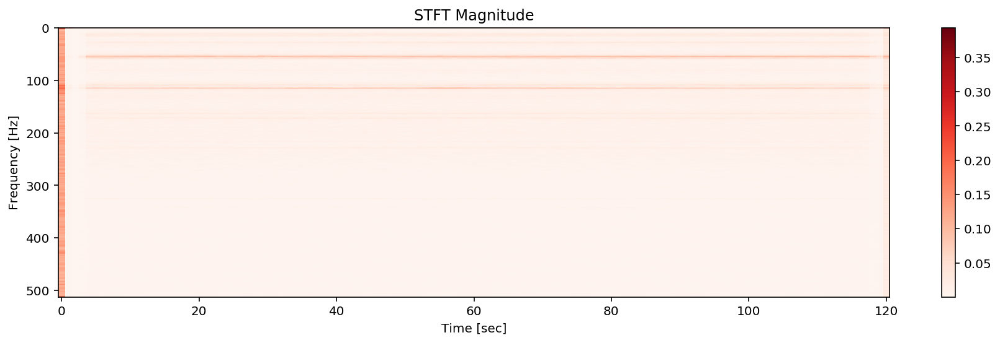

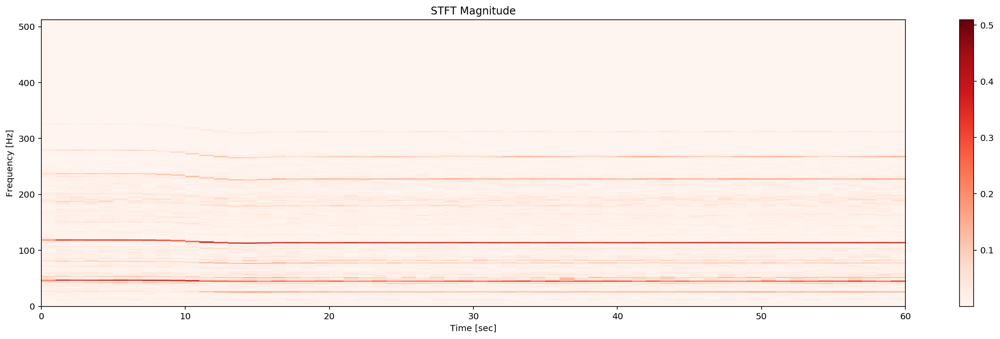

In [40]:
#Get the prediction of STFT for test data
k=20
outputs=vae.predict(tf.reshape(x_test[k],[1,513,121,1]))
STFT_predction=tf.reshape(outputs, [513, 121])

def plot_STFT_imshow(data):
    plt.figure(figsize=(15,4))
    plt.imshow(data, cmap='Reds',aspect='auto')
    plt.title('STFT Magnitude')
    plt.ylabel('Frequency [Hz]')
    plt.xlabel('Time [sec]')
    plt.colorbar()
    plt.show()
    
plot_STFT_imshow(STFT_predction)
plot_STFT(xtest[k])

In [41]:
STFT_predction=vae.predict(x_test,batch_size=batch_size)

In [44]:
MAE=[]
MSE=[]
for i in range(len(x_test)):
    inputs=tf.reshape(x_test[i],[513,121])[:,1:]
    pred=tf.reshape(STFT_predction[i], [513, 121])[:,1:]
    MAE.append(mean_absolute_error(inputs, pred))
    MSE.append(mean_squared_error(inputs, pred,squared=False))
MSE=np.asarray(MSE)
MAE=np.asarray(MAE)
print(MAE[:20])
print(MSE[:20])

[0.00289638 0.0018085  0.01803598 0.00612773 0.00464895 0.00317461
 0.01407987 0.01283127 0.00166958 0.0349665  0.01240927 0.00334508
 0.00237204 0.00171939 0.00554883 0.00193388 0.0025196  0.00316206
 0.00427051 0.00404185]
[0.00866966 0.00390684 0.0495273  0.01114647 0.00850514 0.00685783
 0.04287197 0.04260274 0.00649017 0.09143113 0.03554526 0.0069261
 0.00566253 0.00422288 0.00969066 0.00550283 0.00524909 0.00748929
 0.00911729 0.00753795]


In [45]:
MSE[2433]
MSE[2019]
# baseline LOF
pca1 = PCA(n_components = 10, whiten = True)
pca1.fit(xtrain)
xtrain_fpca = pca1.fit_transform(xtrain[:,:])
# Fit the low-dimensional method
lof1 = LocalOutlierFactor(n_neighbors = 5 ,contamination = 'auto', novelty = True)
lof1.fit(xtrain_fpca)
# Calculate anomaly score on the (PCA-transformed) test data
xtest_fpca = pca1.fit_transform(xtest)
sscore = -lof1.score_samples(xtest_fpca)
print(sscore[:100])

0.005345745096942441

In [46]:
# Save the anomaly scores to file
print(MSE.shape)
#0.627493603767
#0.621231784642
np.savetxt('ytest_challenge_student15.csv', MSE, fmt = '%1.6f', delimiter=',')
np.savetxt('ytest_challenge_student16.csv', MAE, fmt = '%1.6f', delimiter=',')

(2511,)


### VAE Latent Space Visualisation 

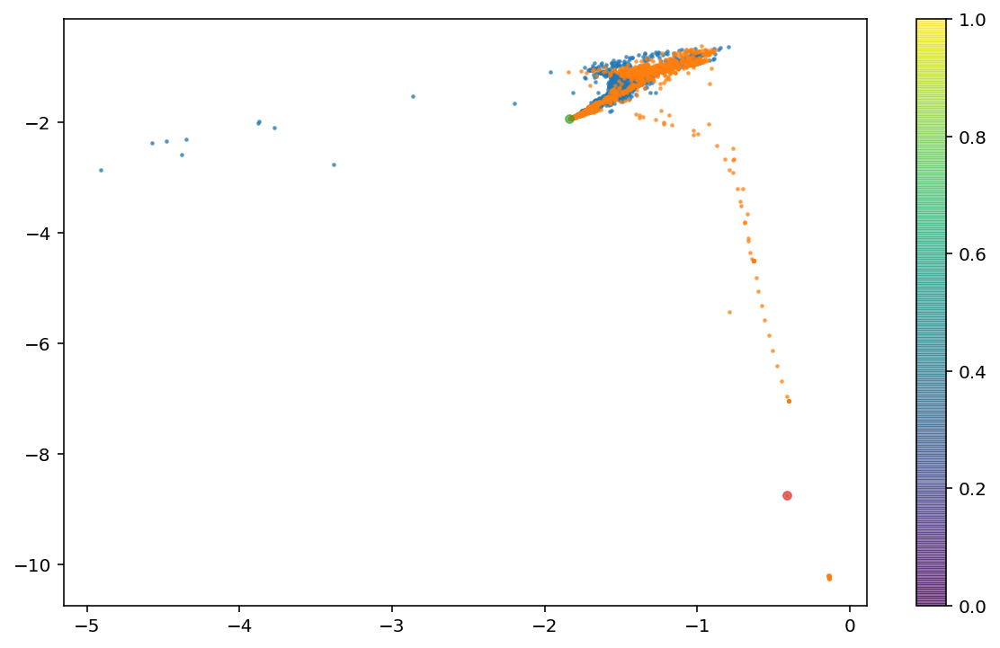

In [296]:
# display a 2D plot in the latent space
X_train_encoded = encoder.predict(x_train, batch_size=batch_size)
X_test_encoded = encoder.predict(x_test, batch_size=batch_size)
plt.figure(figsize=(10, 6))
plt.scatter(X_train_encoded[0][:, 0], X_train_encoded[0][:, 1],alpha=0.6,s=2)
plt.scatter(X_test_encoded[0][:, 0], X_test_encoded[0][:, 1],alpha=0.6,s=2)
plt.scatter(X_test_encoded[0][2019, 0], X_test_encoded[0][2019, 1],alpha=0.6,s=20)
plt.scatter(X_test_encoded[0][2433, 0], X_test_encoded[0][2433, 1],alpha=0.6,s=20)
plt.colorbar()
plt.show()

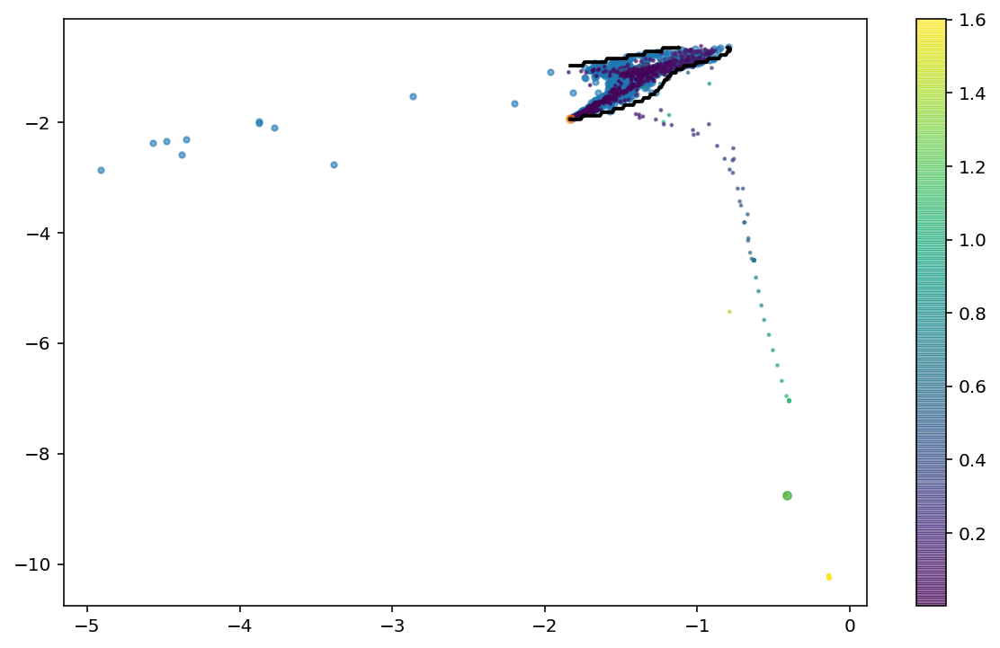

In [310]:

X = X_train_encoded[0]
clf = OneClassSVM(nu=0.001,kernel="rbf", gamma=4).fit(X)
clf.predict(X)
c=clf.score_samples(X)  

# Compare given classifiers under given settings
xx, yy = np.meshgrid(np.linspace(X_test_encoded[0][:,0].min(),X_test_encoded[0][:,0].max(), 150),
                     np.linspace(X_test_encoded[0][:,1].min(),X_test_encoded[0][:,1].max(), 150))
Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)
plt.figure(figsize=(10, 6))
plt.scatter(X_train_encoded[0][:, 0], X_train_encoded[0][:, 1],alpha=0.6,s=10)
plt.scatter(X_test_encoded[0][:, 0], X_test_encoded[0][:, 1],alpha=0.6,s=2,c=MSE)
plt.colorbar()
plt.scatter(X_test_encoded[0][2019, 0], X_test_encoded[0][2019, 1],alpha=0.6,s=20)
plt.scatter(X_test_encoded[0][2433, 0], X_test_encoded[0][2433, 1],alpha=0.6,s=20)
plt.contour(xx, yy, Z, levels=[0], linewidths=2, colors='black')

plt.show()

#### IsolationForest

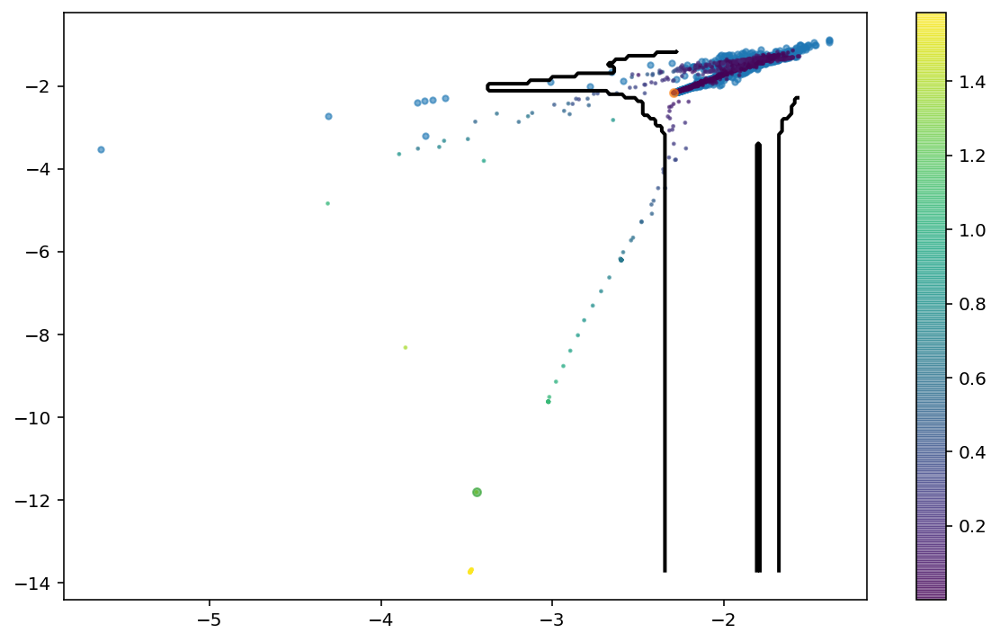

In [283]:

clf = IsolationForest(n_estimators=200, max_samples='auto', contamination=0.01,
                      max_features=1.0,
                      bootstrap=True, n_jobs=-1, behaviour='deprecated',
                      random_state=None, verbose=0, warm_start=True
                     ).fit(X)
clf.score_samples(X)
clf.predict(X[:100])
# Compare given classifiers under given settings
xx, yy = np.meshgrid(np.linspace(X_test_encoded[0][:,0].min(),X_test_encoded[0][:,0].max(), 150),
                     np.linspace(X_test_encoded[0][:,1].min(),X_test_encoded[0][:,1].max(), 150))
Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)
plt.figure(figsize=(10, 6))
plt.scatter(X_train_encoded[0][:, 0], X_train_encoded[0][:, 1],alpha=0.6,s=10)
plt.scatter(X_test_encoded[0][:, 0], X_test_encoded[0][:, 1],alpha=0.6,s=2,c=MSE)
plt.colorbar()
plt.scatter(X_test_encoded[0][2019, 0], X_test_encoded[0][2019, 1],alpha=0.6,s=20)
plt.scatter(X_test_encoded[0][2433, 0], X_test_encoded[0][2433, 1],alpha=0.6,s=20)
plt.contour(xx, yy, Z, levels=[0], linewidths=2, colors='black')

plt.show()

//anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: UserWarning: No contour levels were found within the data range.
//anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:33: UserWarning: No contour levels were found within the data range.


[1.57961424 1.07322015 1.4431127  1.86366691 0.9699948  1.06917981
 1.03822776 1.07182033 1.6861587  1.21862049]


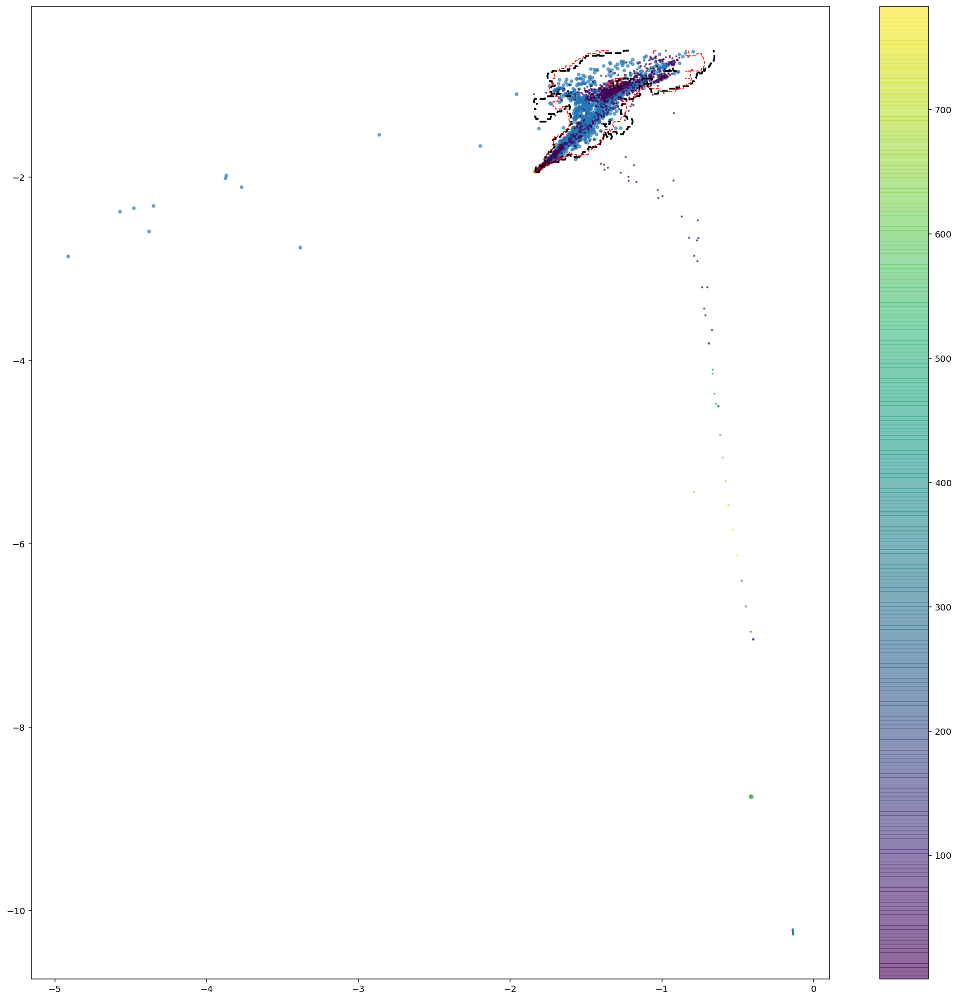

In [298]:
# Fit the low-dimensional method
lof = LocalOutlierFactor(n_neighbors = 2 ,contamination = 0.02, novelty = True)
lof.fit(X_train_encoded[0])
# Calculate anomaly score on the (PCA-transformed) test data
sscore = -lof.score_samples(X_test_encoded[0])


# Compare given classifiers under given settings
xx, yy = np.meshgrid(np.linspace(X_test_encoded[0][:,0].min(),X_test_encoded[0][:,0].max(), 350),
                     np.linspace(X_test_encoded[0][:,1].min(),X_test_encoded[0][:,1].max(), 350))
Z = lof.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)
plt.figure(figsize=(20, 20))
plt.scatter(X_train_encoded[0][:, 0], X_train_encoded[0][:, 1],alpha=0.6,s=10)
plt.scatter(X_test_encoded[0][:, 0], X_test_encoded[0][:, 1],alpha=0.6,s=2,c=sscore)
plt.colorbar()
plt.scatter(X_test_encoded[0][2019, 0], X_test_encoded[0][2019, 1],alpha=0.6,s=20)
plt.scatter(X_test_encoded[0][2433, 0], X_test_encoded[0][2433, 1],alpha=0.6,s=20)
#plt.contour(xx, yy, Z, levels=[0], linewidths=1, colors='black')


lof = LocalOutlierFactor(n_neighbors = 5 ,contamination = 0.02, novelty = True)
lof.fit(X_train_encoded[0])
Z = lof.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)
plt.contour(xx, yy, Z, levels=[2], linewidths=2, colors='black')
sscore = -lof.score_samples(X_test_encoded[0])

lof = LocalOutlierFactor(n_neighbors = 10 ,contamination = 0.02, novelty = True)
lof.fit(X_train_encoded[0])
Z = lof.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)
plt.contour(xx, yy, Z, levels=[2], linewidths=1, colors='red')
sscore = -lof.score_samples(X_test_encoded[0])
print(sscore[:10])
plt.show()

In [285]:
# Save the anomaly scores to file
print(sscore.shape)
#0.580314435092
#0.598135822611
np.savetxt('ytest_challenge_student18.csv', sscore, fmt = '%1.6f', delimiter=',')

(2511,)


# Raw Signal Time Series Approach

## LSTM

In [433]:
def get_batch(source, i, seq_len, evaluation=False):
    # Deal with the possibility that there's not enough data left for a full sequence
    seq_len = min(seq_len, len(source) - 1 - i)
    # Take the input data seq
    data = source[:,i*seq_len:i*seq_len+seq_len]
    # target data is the next slice after input data
    target = source[:,(i+1)*seq_len+seq_len]
    return data, target

In [164]:
from keras.models import Sequential
from keras import layers
from keras.optimizers import RMSprop

"""for i in range(4):
    if i ==0:
        xtrain_STFT=np.abs(Zxx)
    else:
        Zxx=cal_STFT(xtrain[i])
        xtrain_STFT=np.dstack([xtrain_STFT,np.abs(Zxx)])
xtrain_STFT = np.moveaxis(xtrain_STFT, -1, 0)"""

seq_len = 3
model = Sequential()
model.add(layers.LSTM(units=268, input_shape=(
    1024, seq_len), return_sequences=False))

model.add(layers.Dense(512))
#model.add(layers.Dense(512))

model.compile(optimizer=RMSprop(lr=0.01), loss='mae')
#history=model.fit(data_batch,targets_batch,steps_per_epoch=5,          epochs=2)
model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_3 (LSTM)                (None, 268)               291584    
_________________________________________________________________
dense_4 (Dense)              (None, 512)               137728    
Total params: 429,312
Trainable params: 429,312
Non-trainable params: 0
_________________________________________________________________


In [ ]:
# k for each 60s data
for k in range(20):
    
    # i:range(0,61,2)
    for i in (range(0, xtrain_STFT_3D[k].shape[-1])):
        if i+seq_len+1<xtrain_STFT_3D[k].shape[-1]:
            #get data:(513*seq_len)  targets:(513*1)
            data, targets = get_batch(xtrain_STFT_3D[k], i, seq_len)
            
        if i==0:
            data_seq=data
            targets_seq=targets
            pred_seq=pred
        else:
            if data.shape[1]!=seq_len:
                pass
            else:
                #build a batch of data/targets for xtrain_STFT_3D[k]
                data_seq=np.dstack([data_seq,data])
                targets_seq=np.dstack([targets_seq,targets])
                pred_seq=np.dstack([pred_seq,pred])
    
        #print(data_seq.shape)
    data_seq= np.moveaxis(data_seq, -1, 0)
    targets_seq= np.moveaxis(targets_seq, -1, 0)
    
    
    pred_seq=model.predict(data_seq, batch_size=32, verbose=1)
    
    #Build k batchs of data/targets
    if k==0:
        data_batch=data_seq
        targets_batch=targets_seq
        pred_batch=pred_seq
        print(pred_seq.shape)
        print(pred_batch.shape)
        
    else:
        data_batch=np.dstack([data_batch,data_seq])
        targets_batch=np.dstack([targets_batch,targets_seq])
        pred_batch=np.dstack([pred_batch,pred_seq])
        print(pred_seq.shape)
        print(pred_batch.shape)
    
    #targets_batch= np.moveaxis(targets_batch, -1, 1)
    targets_seq_squeezed= np.squeeze(targets_seq)
    
    pred_batch= np.moveaxis(pred_batch, -1, 0)
    print(data_seq.shape)
    print(data_batch.shape)
    print(targets_seq.shape)
    print(targets_batch.shape)
    history=model.fit(data_seq,targets_seq_squeezed,steps_per_epoch=5,verbose=1,
                 epochs=2)

## LOF Using the projection on a low-dimensional space
- Features: Raw singal
- Data: train data
- Algorithm: PCA + LOF
- Parameter: Novelty 
- Scoring:
- ** AUC :0.7143**  

In [168]:
# PCA transform
pca1 = PCA(n_components=10, whiten=True)
pca1.fit(xtrain[:, :])
xtrain_fpca = pca1.fit_transform(xtrain[:, :])
# Fit the low-dimensional method
lof1 = LocalOutlierFactor(n_neighbors=5, contamination='auto', novelty=True)
lof1.fit(xtrain_fpca)
# Calculate anomaly score on the (PCA-transformed) test data
xtest_fpca = pca1.fit_transform(xtest)
sscore = -lof1.score_samples(xtest_fpca)
print(sscore[:100])

[2.31222147 3.21920169 2.32452172 5.2416519  3.77868812 2.48401327
 1.60473781 2.08579464 3.62659859 1.51251174 2.38662206 2.50738985
 2.53381672 3.7031445  2.54672502 1.7408619  3.73473917 2.84198658
 2.96931812 2.00665609 2.59616066 2.41765589 2.11218523 4.8581478
 3.82995185 2.34813006 2.33433001 2.87554115 2.21877324 3.45815205
 2.33508349 2.77534772 2.63497815 2.28615506 2.65251437 5.98637398
 1.74203358 3.02999749 2.63603981 3.89133284 2.99970299 2.93207293
 3.18996343 2.84854187 3.69942921 3.21495621 2.09673527 3.04956052
 2.07690722 3.20542142 2.48597064 2.08116068 2.89436276 2.53010919
 1.72682643 2.17525652 2.33569795 2.07993293 2.37915679 2.44682609
 1.88143338 2.51731689 1.88324066 2.70340383 2.64562268 2.45633819
 2.59444114 2.44419078 3.26238809 3.18518807 3.21228093 2.85333342
 3.11405378 2.7419172  2.24284782 2.23024267 3.07355636 2.06936584
 1.96645779 2.47559168 2.34208299 3.33483183 1.72857621 2.32563373
 2.7811836  1.36257703 2.81461841 3.46023745 2.9316191  2.81334

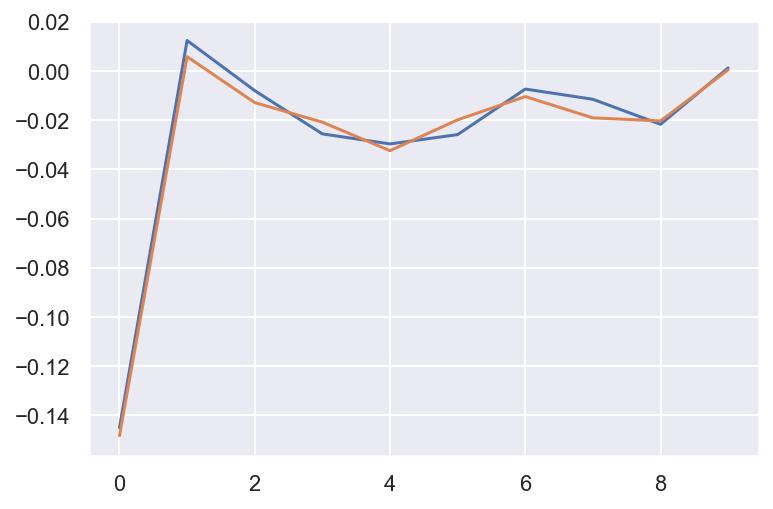

In [169]:
plt.plot(xtest_fpca[4])
plt.plot(xtest_fpca[2019])

In [ ]:
# Save the anomaly scores to file
print(sscore.shape)
np.savetxt('ytest_challenge_student.csv', sscore, fmt = '%1.6f', delimiter=',')

## kernel PCA

In [173]:
from sklearn.decomposition import KernelPCA
pca1 = KernelPCA(n_components = 10, kernel='rbf')
#pca1 = PCA(n_components = 10,whiten = True)
pca1.fit(xtrain)
xtrain_fpca = pca1.fit_transform(xtrain)

# Fit the low-dimensional method
lof1 = LocalOutlierFactor(n_neighbors = 5 ,contamination = 'auto', novelty = True)
lof1.fit(xtrain_fpca)

xtest_fpca = pca1.transform(xtest)

sscore = -lof1.score_samples(xtest_fpca )
print(sscore[:10])

[1.04133824 2.03553452 0.99993827 1.08801806 3.13066476 1.07867853
 0.97939616 0.97188638 1.00060463 1.23200188]


## OneClassSVM 
- Features: Raw singal+der1+der2
- Data: train data
- Algorithm: OneClassSVM
- Parameter: Novelty 
- Scoring:
- ** AUC :0.632120830089.**  

In [34]:
clf = OneClassSVM(kernel='rbf',gamma='auto').fit(xtrain)
#clf.predict(Xtest)
sscore=clf.score_samples(Xtest)

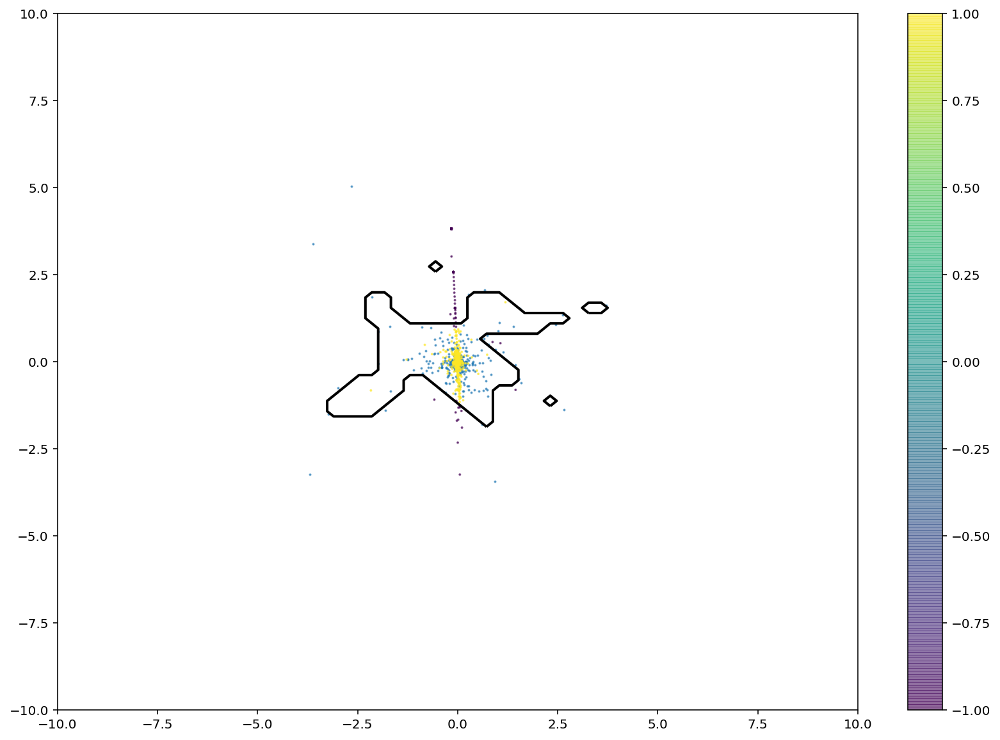

In [466]:
pca2d = PCA(n_components=2, whiten=True)
# xtrain_fpca2d=pca2d.fit_transform(xtrain_scaled)
X = xtrain_fpca2d
clf = OneClassSVM(nu=0.01, kernel="rbf", gamma=1).fit(X)
c = clf.predict(xtest_fpca2d)
#############
xmin = np.min([xtest_fpca2d[:, 0].min(), xtrain_fpca2d[:, 0].min()])
xmax = np.max([xtest_fpca2d[:, 0].max(), xtrain_fpca2d[:, 0].max()])
ymin = np.min([xtest_fpca2d[:, 1].min(), xtrain_fpca2d[:, 1].min()])
ymax = np.max([xtest_fpca2d[:, 1].max(), xtrain_fpca2d[:, 1].max()])
xx, yy = np.meshgrid(np.linspace(xmin, xmax, 150),
                     np.linspace(ymin, ymax, 150))
Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)
plt.figure(figsize=(14, 10))
plt.xlim(-10, 10)
plt.ylim(-10, 10)
plt.scatter(xtrain_fpca2d[:, 0], xtrain_fpca2d[:, 1],
            alpha=0.6, s=1)  # ,c=MSE)
plt.scatter(xtest_fpca2d[:, 0], xtest_fpca2d[:, 1], alpha=0.6, s=1, c=c)
plt.colorbar()
#plt.scatter(X_test_encoded[0][2019, 0], X_test_encoded[0][2019, 1],alpha=0.6,s=20)
#plt.scatter(X_test_encoded[0][2433, 0], X_test_encoded[0][2433, 1],alpha=0.6,s=20)
plt.contour(xx, yy, Z, levels=[0], linewidths=2, colors='black')

plt.show()

## Isolation Forest Raw data 
- Features: interpolated data 
- Features dimenstion: 61440
- Data: train data
- Algorithm: Isolation Forest
- Parameter: 
- Scoring:
- ** AUC : 0.623563165116** 

In [4]:
clf = IsolationForest(n_estimators=100, max_samples='auto', contamination='auto',
                      max_features=1.0,
                      bootstrap=False, n_jobs=-1, behaviour='deprecated',
                      random_state=None, verbose=0, warm_start=False
                     ).fit(xtrain[:])
clf.predict(xtest[:100])

array([ 1,  1,  1,  1,  1,  1,  1,  1,  1, -1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1, -1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1, -1,  1, -1,  1,  1,  1,  1,  1,  1, -1,  1,  1, -1,  1,
        1,  1,  1, -1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1, -1,  1,  1,  1, -1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1])

In [6]:
sscore = -clf.score_samples(xtest)
print(sscore[:100])

[0.32048616 0.31646783 0.47250222 0.31703725 0.31659962 0.31684678
 0.43839803 0.43907239 0.31920178 0.56655159 0.40768529 0.31672667
 0.31525738 0.31626624 0.31531431 0.31614293 0.31569801 0.31585585
 0.32002287 0.3154356  0.41541473 0.31758544 0.3158513  0.41550012
 0.65992233 0.31602659 0.31526542 0.3155702  0.41594825 0.31551013
 0.31704875 0.3156731  0.32000091 0.31610535 0.32360097 0.44372107
 0.31569936 0.68229738 0.44621987 0.50554967 0.43606573 0.32179819
 0.40390218 0.31533716 0.31523597 0.31562654 0.5692208  0.43888223
 0.47907199 0.56782175 0.31620857 0.43034314 0.31550799 0.32338928
 0.55885561 0.31687316 0.31549579 0.32637177 0.316792   0.31587354
 0.32016053 0.47836974 0.42567084 0.31582372 0.31807914 0.31744145
 0.3247535  0.31784015 0.48357606 0.46800851 0.71194831 0.31602247
 0.4473729  0.40440935 0.50770872 0.4189623  0.31576365 0.31578758
 0.38611324 0.31570274 0.31983628 0.31964248 0.49790545 0.31603601
 0.31602493 0.31650624 0.31518627 0.31579898 0.31565074 0.3171

In [9]:
# Save the anomaly scores to file
print(sscore.shape)
np.savetxt('ytest_challenge_student7.csv', sscore, fmt = '%1.6f', delimiter=',')

(2511,)


## LOF + PCA + Derivatives 
- Features: Raw singal  + Derivatives 1 + Derivatives 2
- Features dimenstions: 61440*3
- Data: 
- Algorithm: PCA + LOF
- Parameter: Novelty
- Scoring:
- ** AUC :0.634** contamination='auto',neigbour=5
- ** AUC :0.605713967889 ** contamination='0.02' ,neigbour=3  

In [40]:
# interpolation matrix
def derivative_matrix(xtrain):
    xnew = np.arange(0, 61440, 1)
    for i in range(len(xtrain)):

        # spline interpolation
        tck = interpolate.splrep(range(61440), xtrain[i], s=0)
        #ynew = interpolate.splev(xnew, tck, der=0)
        yder1 = interpolate.splev(xnew, tck, der=1)
        #yder2 = interpolate.splev(xnew, tck, der=2)
        if i % 200 == 0:
            print(i)
        if i == 0:
            interpolation = interpolate.splev(xnew, tck, der=0)
            derivative1=interpolate.splev(xnew, tck, der=1)
            derivative2=interpolate.splev(xnew, tck, der=2)
        else:
            #interpolation = np.vstack((interpolation, ynew))
            derivative1=np.vstack((derivative1,yder1))
            #derivative2=np.vstack((derivative2,yder2))
    return interpolation,derivative1, derivative2


#xtrain_interpolation, xtrain_derivative1, xtrain_derivative2 = derivative_matrix(
 #   xtrain)
xtest_interpolation, xtest_derivative1, xtest_derivative2 = derivative_matrix(
    xtest)

0
200
400
600
800
1000
1200
1400
1600
1800
2000
2200
2400


In [41]:
#np.savetxt('xtrain_der1_X1.csv', xtrain_derivative1, fmt = '%1.6f', delimiter=',')
np.savetxt('xtest_der1_X1.csv', xtest_derivative1, fmt = '%1.6f', delimiter=',')

In [31]:
#2nd order derivative

# PCA transform
pca = PCA(n_components = 10, whiten = True)
xtrain_fpca = pca.fit_transform(xtrain_derivative2[:,:])
# Fit the low-dimensional method
lof = LocalOutlierFactor(n_neighbors = 5 ,contamination = 'auto', novelty = True)
lof.fit(xtrain_fpca)
# Calculate anomaly score on the (PCA-transformed) test data
xtest_fpca = pca.fit_transform(xtest_derivative2)
sscore = -lof.score_samples(xtest_fpca)
print(sscore[:100])

[1.9657198  1.89369335 2.71453218 2.14009202 2.20136775 2.46513439
 2.07411111 1.35850272 1.85261668 2.47175589 1.48242438 2.21448029
 2.28309438 2.2066407  2.41108312 3.0308287  2.18820082 1.62349879
 3.1400977  2.49080711 1.18929089 2.47646837 2.05284307 1.99468207
 2.18218016 2.57229875 2.3292533  1.87836024 1.45782464 2.23660653
 2.04563339 2.17438899 1.57928881 2.54198428 1.32957589 1.91710495
 2.20723822 1.46594127 1.86789527 1.91628492 2.14031512 2.17470193
 1.83302977 2.1966174  2.20770657 2.25973704 1.82274552 1.46202263
 2.00424114 1.56239172 2.31952236 1.53690084 2.18453936 2.1030268
 1.78425253 2.30196645 2.18780778 2.55552586 1.89328896 2.51818672
 2.20046202 2.35402657 2.49411554 2.18085714 2.31706203 3.03510245
 1.92146982 2.02760991 1.42323704 1.84803682 1.61381357 2.24932298
 2.18218241 2.01969501 1.73088564 1.59496846 1.89269809 1.73224706
 1.99320935 2.48486155 1.76472983 2.17538929 2.76379497 2.48048523
 2.3545205  2.42354869 2.19281497 2.46080312 3.32599624 2.27491

2.1955592080920874
2.233305828807223


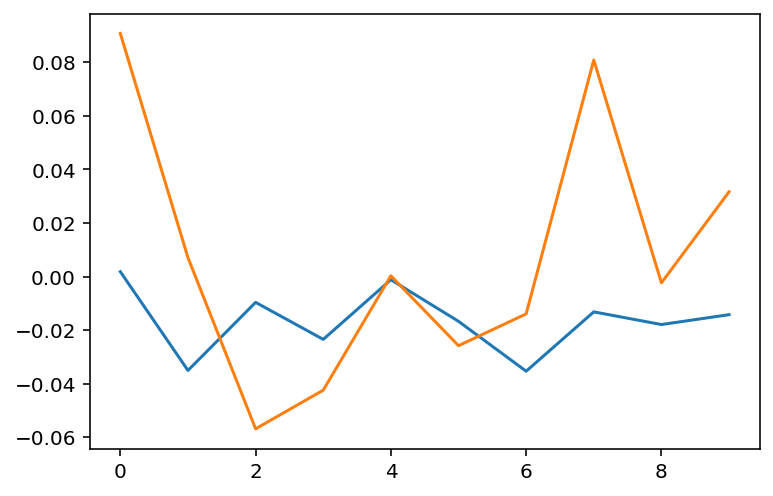

In [35]:
print(sscore[2019])
print(sscore[2433])
plt.plot(xtest_fpca[2019])
plt.plot(xtest_fpca[24])

In [36]:
# Save the anomaly scores to file
print(sscore.shape)
np.savetxt('ytest_challenge_student8.csv', sscore, fmt = '%1.6f', delimiter=',')

(2511,)


In [33]:
k=np.hstack((xtrain[:5], xtrain_derivative1[:5]))
k.shape
xtrain_derivative2[:5].shape

TypeError: 'int' object is not subscriptable

In [5]:
import numpy as np
xtrain_derivative1 = np.loadtxt(
    'xtrain_der1_X1.csv',  delimiter=',')
xtest_derivative1 = np.loadtxt(
    'xtest_der1_X1.csv',  delimiter=',')

In [6]:
xtrain = np.loadtxt('airbus_train.csv', delimiter= ' ')
print(xtrain.shape)
xtest = np.loadtxt('airbus_test.csv', delimiter= ' ')
print(xtest.shape)

(1677, 61440)
(2511, 61440)


In [8]:
xtrain_derivative2 = np.loadtxt(
    'xtrain_der2_X1.csv',  delimiter=',')
xtest_derivative2 = np.loadtxt(
    'xtest_der2_X1.csv',  delimiter=',')

In [9]:
Xtrain = np.hstack(
    (np.hstack((xtrain, xtrain_derivative1)), xtrain_derivative2))
xtrain_derivative1=0
xtrain_derivative2=0
xtrain=0

In [10]:
Xtest = np.hstack(
    (np.hstack((xtest, xtest_derivative1)), xtest_derivative2))

In [12]:
np.savetxt('Xtrain_xder1der2_X1.csv', Xtrain, fmt = '%1.6f', delimiter=',')
np.savetxt('Xtest_xder1der2_X1.csv', Xtest, fmt = '%1.6f', delimiter=',')

In [28]:
# PCA transform
pca = PCA(n_components = 100, whiten = True)
xtrain_fpca = pca.fit_transform(Xtrain)
# Fit the low-dimensional method
lof = LocalOutlierFactor(n_neighbors = 3 ,contamination = 0.02, novelty = True)
lof.fit(xtrain_fpca)
# Calculate anomaly score on the (PCA-transformed) test data
xtest_fpca = pca.fit_transform(Xtest)
sscore = -lof.score_samples(xtest_fpca)
print(sscore[:100])

[7.50622507 3.86520882 3.32975609 4.52529125 4.45480612 3.90876835
 3.63493963 5.97026324 4.28146037 4.93607468 7.70226021 3.78271975
 3.98802516 4.23438377 3.95705119 4.74002022 3.50773592 4.11545262
 3.68818656 4.50619935 4.69065993 4.80546824 4.04409106 4.83160186
 6.3936794  4.11205354 3.87467241 4.05699438 4.43256059 3.98467251
 2.80108062 3.5422597  4.51179453 3.91992717 5.55568172 4.55613969
 4.11261856 2.9236154  3.14939203 4.44395722 3.91946878 4.49711229
 4.32656275 3.907553   3.84453833 4.17645336 9.72486055 4.07683804
 4.80175048 2.74408388 3.43758017 5.33151827 3.97071217 5.45253351
 4.60981764 4.41924586 3.77658276 6.59953766 3.53471133 3.80661963
 6.52097732 4.00685744 4.21081324 3.8961832  2.6366209  3.58136571
 5.54887849 4.07154448 2.81249747 3.48593397 3.36170104 3.54616866
 3.86046898 4.16263916 6.3269842  5.22071969 3.80735558 3.70582189
 6.14297969 4.26695605 3.94358637 4.12735538 6.11501779 3.8524693
 3.53082237 3.56601758 3.88437897 3.92912534 3.89616352 3.82607

3.903252170507732
7.7768009926364705


array([0.88093371, 0.01077892, 0.00413147, 0.00316665, 0.00199988])

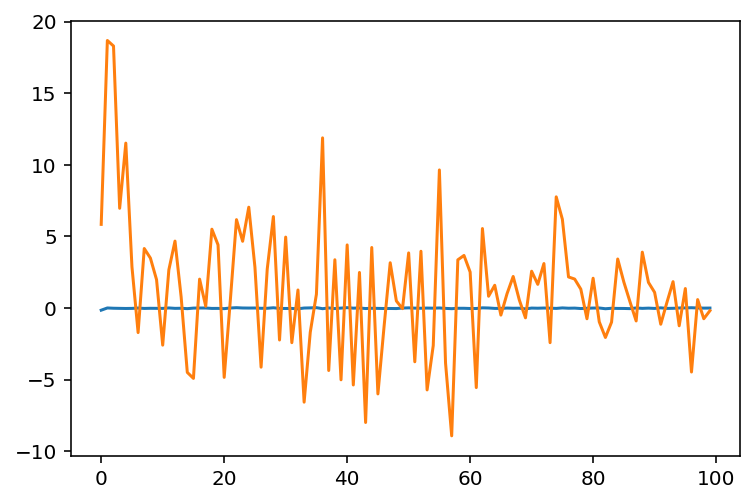

In [30]:
print(sscore[2019])
print(sscore[2433])
plt.plot(xtest_fpca[2019])
plt.plot(xtest_fpca[2433])
plt.plot(xtest_fpca[2434])
plt.plot(xtest_fpca[2435])
pca.explained_variance_ratio_[:5]

In [31]:
# Save the anomaly scores to file
print(sscore.shape)
np.savetxt('ytest_challenge_student10.csv', sscore, fmt = '%1.6f', delimiter=',')

(2511,)


## LOF interpolated data
- Features: interpolated data
- Features dimenstion: 61440*2
- Data: train data
- Algorithm: PCA + LOF
- Parameter: Novelty 
- Scoring:
- ** AUC :0.52973475719** 

In [14]:
# interpolation matrix
def interpolation_matrix(xtrain):
    xnew = np.arange(0, 61440, 1/2)
    for i in range(len(xtrain)):

        # spline interpolation
        tck = interpolate.splrep(range(61440), xtrain[i], s=0)
        ynew = interpolate.splev(xnew, tck, der=0)
        yder1 = interpolate.splev(xnew, tck, der=1)
        yder2 = interpolate.splev(xnew, tck, der=2)
        if i % 100 == 0:
            print(i)
        if i == 0:
            interpolation = ynew
            derivative1=yder1
            derivative2=yder2
        else:
            interpolation = np.vstack((interpolation, ynew))
            # derivative1=np.vstack((derivative1,yder1))
            # derivative2=np.vstack((derivative2,yder2))
    return interpolation, derivative1, derivative2


xtrain_interpolation, xtrain_derivative1, xtrain_derivative2 = interpolation_matrix(
    xtrain)
xtest_interpolation, xtest_derivative1, xtest_derivative2 = interpolation_matrix(
    xtest)

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500


In [15]:
xtest_interpolation.shape
np.savetxt('xtrain_interpolationX2.csv',
           xtrain_interpolation, fmt='%1.6f', delimiter=',')
np.savetxt('xtest_interpolationX2.csv',
           xtest_interpolation, fmt='%1.6f', delimiter=',')

In [33]:
# PCA transform
pca1 = PCA(n_components=10, whiten=True)
xtrain_fpca = pca1.fit_transform(xtrain_interpolation)
# Fit the low-dimensional method
lof1 = LocalOutlierFactor(n_neighbors=2, contamination='auto', novelty=True)
# n_neighbors=10 AUC 0.408336114304
# n_neighbors=3 AUC 0.63531276651
# n_neighbors=2 AUC 0.649104836417
lof1.fit(xtrain_fpca)
# Calculate anomaly score on the (PCA-transformed) test data
xtest_fpca = pca1.fit_transform(xtest_interpolation)
sscore = -lof1.score_samples(xtest_fpca)
print(sscore[:100])

[2.44608028 1.20979371 1.37994128 4.39178276 1.20252021 1.32738297
 1.50007418 1.40581575 1.34423649 1.76622263 1.34666284 1.21258653
 1.2153796  1.73399158 1.22673102 1.43962163 1.23088521 1.18514108
 1.24965326 1.21260342 1.32080322 1.21626098 1.17573295 1.50393369
 4.20098683 1.19165419 1.18218612 1.18644271 1.36615569 1.22475717
 2.19806899 1.19201142 1.39802541 1.14792968 2.61491177 2.9487786
 1.24558579 3.62474499 1.79907625 2.34036014 1.37500319 1.23074342
 1.27815007 1.1870581  1.19505357 1.13698656 1.79126795 1.22644014
 1.19005779 1.11830462 1.40898562 1.81693093 1.16882405 1.0786123
 2.50779501 1.22870927 1.17306883 1.74194629 1.20267528 1.23351206
 1.56333707 1.29310016 2.62804277 1.20430337 3.29462154 1.24524194
 2.84010488 1.23395688 1.42509432 3.5555574  4.69884524 1.22047924
 2.20274324 1.27639435 2.55693042 1.33395909 1.14909813 1.32523576
 3.01582116 1.24647039 1.22085888 1.09295067 1.66009465 1.18404245
 1.27594041 1.18993434 1.17473509 1.21345797 1.17807037 1.232180

In [34]:
print(sscore[2019])
print(sscore[2433])
pca1.explained_variance_ratio_

1.1860836140297217
4.382270555059261


array([0.91600621, 0.01113232, 0.00421567, 0.00323661, 0.00200126,
       0.00194058, 0.00147035, 0.00142686, 0.00135086, 0.00124056])

## Isolation Forest Interpolation / 1st order derivative
- Features: interpolated data / 1st order derivative
- Features dimenstion: 61440*2
- Data: train data
- Algorithm: Isolation Forest
- Parameter: 
- Scoring:
- ** AUC : ** 

In [72]:
# interpolation matrix
def interpolation_matrix(xtrain):
    xnew = np.arange(0, 61440, 1/2)
    for i in range(len(xtrain)):

        # spline interpolation
        tck = interpolate.splrep(range(61440), xtrain[i], s=0)
        #ynew = interpolate.splev(xnew, tck, der=0)
        yder1 = interpolate.splev(xnew, tck, der=1)
        yder2 = interpolate.splev(xnew, tck, der=2)
        if i % 100 == 0:
            print(i)
        if i == 0:
            interpolation = interpolate.splev(xnew, tck, der=0)
            derivative1 = interpolate.splev(xnew, tck, der=1)
            derivative2 = interpolate.splev(xnew, tck, der=2)
        else:
            #interpolation = np.vstack((interpolation, ynew))
            # derivative1=np.vstack((derivative1,yder1))
            derivative2 = np.vstack((derivative2, yder2))
    return interpolation, derivative1, derivative2


# xtrain_interpolation, xtrain_derivative1, xtrain_derivative2 = interpolation_matrix(
#    xtrain)
xtest_interpolation, xtest_derivative1, xtest_derivative2 = interpolation_matrix(
    xtest)

0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500


In [39]:
xtrain_derivative2.shape

(122880,)

In [74]:
np.savetxt('xtrain_derivative1_interpolationX2.csv',
           xtrain_derivative1, fmt='%1.6f', delimiter=',')
np.savetxt('xtrain_derivative2_interpolationX2.csv',
           xtrain_derivative2, fmt='%1.6f', delimiter=',')
np.savetxt('xtest_derivative1_interpolationX2.csv',
           xtest_derivative1, fmt='%1.6f', delimiter=',')
np.savetxt('xtest_derivative2_interpolationX2.csv',
           xtest_derivative2, fmt='%1.6f', delimiter=',')

In [ ]:
#reload saved data
xtrain_derivative1=np.loadtxt('xtrain_derivative1_interpolationX2.csv', fmt = '%1.6f', delimiter=',')
xtrain_derivative2=np.loadtxt('xtrain_derivative2_interpolationX2.csv', fmt = '%1.6f', delimiter=',')
xtest_derivative1=np.loadtxt('xtest_derivative1_interpolationX2.csv', fmt = '%1.6f', delimiter=',')
xtest_derivative2=np.loadtxt('xtest_derivative2_interpolationX2.csv', fmt = '%1.6f', delimiter=',')


In [ ]:
clf = IsolationForest(n_estimators=200, max_samples='auto', contamination='auto',
                      max_features=1.0,
                      bootstrap=False, n_jobs=-1, behaviour='deprecated',
                      random_state=None, verbose=0, warm_start=False
                      ).fit(xtrain[:])
clf.predict(xtest[:100])

In [87]:
# Calculate anomaly score on the 61 dimentions test data
sscore = -clf.score_samples(xtest[:])
print(np.argmax(sscore))
print(sscore[:100])

2062
[0.35801135 0.34994937 0.58227268 0.35039162 0.35272693 0.35279258
 0.57778154 0.54862683 0.36106502 0.6448241  0.52013391 0.35119235
 0.34819058 0.35289676 0.3485598  0.34967267 0.34925452 0.35135943
 0.35745078 0.35094979 0.52085292 0.3514895  0.35015972 0.50271437
 0.69153209 0.35075853 0.34806981 0.3500284  0.53043151 0.34934668
 0.3514627  0.34948575 0.35705852 0.35157693 0.36091295 0.53112087
 0.34859505 0.67297942 0.56691264 0.56707238 0.53470435 0.35179852
 0.52537422 0.3476426  0.34935734 0.35226013 0.63950777 0.52384274
 0.57004818 0.60043287 0.35006337 0.53717926 0.34883184 0.35976194
 0.60193401 0.35193819 0.35010274 0.35975174 0.34975266 0.3494093
 0.35522331 0.57002142 0.53210653 0.35015813 0.35041831 0.34959993
 0.36348386 0.35181856 0.57876882 0.5536893  0.69876876 0.34945055
 0.51458789 0.50712491 0.57915692 0.55860034 0.35032128 0.35143114
 0.55025756 0.35264883 0.35075477 0.36109842 0.61061816 0.34989503
 0.3510389  0.34907193 0.34858375 0.35119405 0.34811514 0.

## Autoencoder with  data +der1+der2
- Features: interpolated data
- Features dimenstion: 61440*3
- Data: train data
- Algorithm: convlutional autoencoder
- Parameter: 
- Scoring:
- ** AUC :** 

In [11]:
Xtrain = np.loadtxt('Xtrain_xder1der2_X1.csv',  delimiter=',')
Xtest = np.loadtxt('Xtest_xder1der2_X1.csv',  delimiter=',')
Xtrain.shape

(1677, 184320)

In [15]:
Xtrain=Xtrain.reshape(1677,3,61440)

(1, 3, 61440)

In [185]:
import keras
#from tensorflow import keras
from keras import layers
from keras import backend as K

latent_dim=10
#tensor=(samples, height, width, channels)

#encoder:
encoder_input = keras.Input(shape=(1,61440,3), name='sequence')
x = layers.Conv2D(filters=12, kernel_size=(1,12), strides=2,
                  activation='relu',padding='same')(encoder_input)
x = layers.MaxPooling2D((1,2))(x)
x = layers.Conv2D(filters=5, kernel_size=(1,5), strides=2, activation='relu',padding='same')(x)
x = layers.MaxPooling2D((1,2))(x)
shape_before_flattening = K.int_shape(x)
x = layers.Flatten()(x)
encoder_output = layers.Dense(10)(x)
#encoder_output = layers.Dense(latent_dim + latent_dim)(x)
encoder = keras.Model(encoder_input, encoder_output, name='encoder')
#encoder.summary()

#decoder:
x = layers.InputLayer(input_shape=(latent_dim,))(encoder_output)
x = layers.Dense(np.prod(shape_before_flattening[1:]), activation='relu')(x)
x = layers.Reshape(shape_before_flattening[1:])(x)
x = layers.Conv2DTranspose(5, kernel_size=(1,5), strides=(1,2) ,padding='same',activation='relu')(x)
x = layers.UpSampling2D((1,2))(x)
x = layers.Conv2DTranspose(12, (1, 3), strides=(1,2),activation='relu',padding='same')(x)
#x = layers.Conv2D(1, 3, activation='relu')(x)
x = layers.UpSampling2D((1,2))(x)
x = layers.Conv2DTranspose(3, (1, 3), activation='relu',padding='same')(x)
decoder_output = x
#decoder = keras.Model(encoder_output, decoder_output)

autoencoder = keras.Model(encoder_input, decoder_output, name='autoencoder')
autoencoder.summary()

Model: "autoencoder"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequence (InputLayer)        (None, 1, 61440, 3)       0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 1, 30720, 12)      444       
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 1, 15360, 12)      0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 1, 7680, 5)        305       
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 1, 3840, 5)        0         
_________________________________________________________________
flatten_2 (Flatten)          (None, 19200)             0         
_________________________________________________________________
dense_11 (Dense)             (None, 10)                

In [88]:
Xtrain=np.moveaxis(Xtrain,1,0)
#autoencoder.fit(Xtrain)

In [111]:
autoencoder.compile(optimizer='adam', loss='mse')
log_dir = "logs"
tensorboard_callback = tf.keras.callbacks.TensorBoard(
    log_dir=log_dir, histogram_freq=1)
autoencoder.fit(Xtrain, Xtrain,
                epochs=1,
                batch_size=256, #callbacks=[tensorboard_callback],
                shuffle=True)

Epoch 1/1
1677/1677 [==============================] - 106s 63ms/step - loss: 0.9771


In [112]:
%tensorboard --logdir logs/fit

In [ ]:
autoencoder(tf.convert_to_tensor(xtrain[0]))

## VAE data+der1+der2

In [129]:
from tensorflow.keras import layers
from keras import backend as K

In [155]:
#Xtrain=np.squeeze(Xtrain)
Xtrain.shape

(1677, 3, 61440)

In [154]:
#prepare data for VAE
Xtrain = Xtrain.reshape(1677, 3,61440).astype('float32')

In [ ]:
# Train VAE
original_dim = 61440
intermediate_dim = 64
latent_dim = 32
time_window_size=5

class Sampling(layers.Layer):
    """Uses (z_mean, z_log_var) to sample z, the vector encoding a digit."""

    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon


# Define encoder model.
original_inputs = tf.keras.Input(shape=(3, 61440,), name='encoder_input')
x = layers.Conv1D(filters=32, kernel_size=3, activation='relu',
                  input_shape=(time_window_size, 1))(original_inputs)
# x=layers.MaxPooling1D()(x)
x = layers.Dense(intermediate_dim, activation='relu')(x)
z_mean = layers.Dense(latent_dim, name='z_mean')(x)
z_log_var = layers.Dense(latent_dim, name='z_log_var')(x)
z = Sampling()((z_mean, z_log_var))
encoder = tf.keras.Model(inputs=original_inputs, outputs=z, name='encoder')

# Define decoder model.
latent_inputs = tf.keras.Input(shape=(latent_dim,), name='z_sampling')
x = layers.Dense(intermediate_dim, activation='relu')(latent_inputs)
outputs = layers.Dense(original_dim, activation='sigmoid')(x)
decoder = tf.keras.Model(inputs=latent_inputs, outputs=outputs, name='decoder')

# Define VAE model.
outputs = decoder(z)
vae = tf.keras.Model(inputs=original_inputs, outputs=outputs, name='vae')

# Add KL divergence regularization loss.
kl_loss = - 0.5 * tf.reduce_mean(
    z_log_var - tf.square(z_mean) - tf.exp(z_log_var) + 1)
vae.add_loss(kl_loss)

# Train.
optimizer = tf.keras.optimizers.Adam(learning_rate=1e-2)
vae.compile(optimizer='adam', loss=tf.keras.losses.MeanSquaredError())

vae.fit(Xtrain, Xtrain, epochs=10, batch_size=64)

In [166]:
vae.summary()

Model: "vae"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input (InputLayer)      [(None, 3, 61440)]   0                                            
__________________________________________________________________________________________________
conv1d_22 (Conv1D)              (None, 1, 32)        5898272     encoder_input[0][0]              
__________________________________________________________________________________________________
dense_38 (Dense)                (None, 1, 64)        2112        conv1d_22[0][0]                  
__________________________________________________________________________________________________
z_mean (Dense)                  (None, 1, 32)        2080        dense_38[0][0]                   
________________________________________________________________________________________________

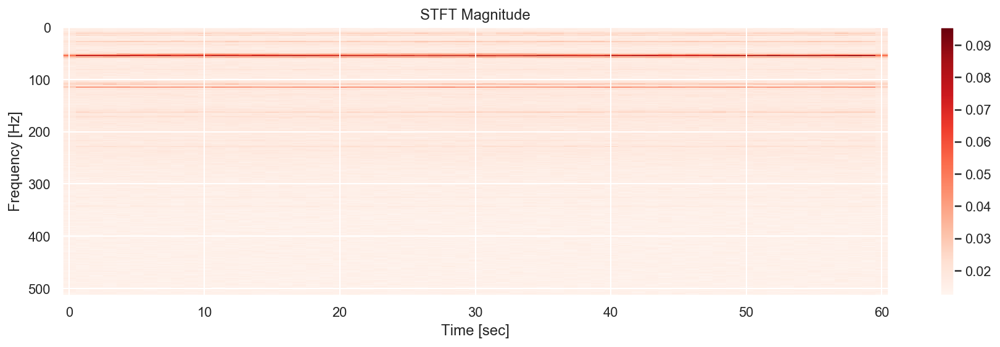

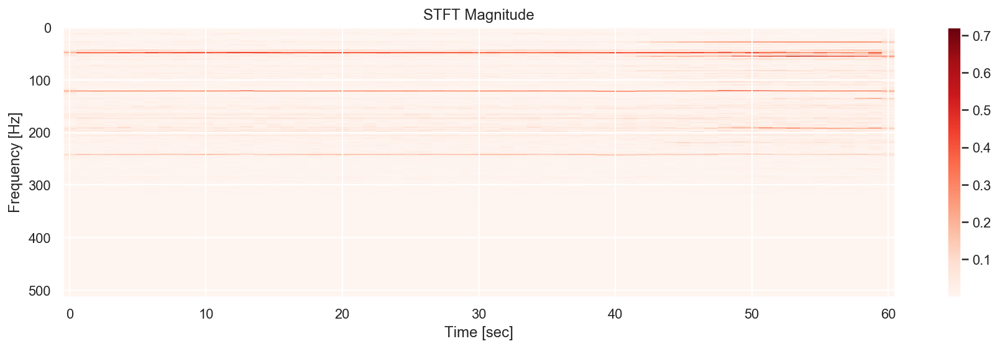

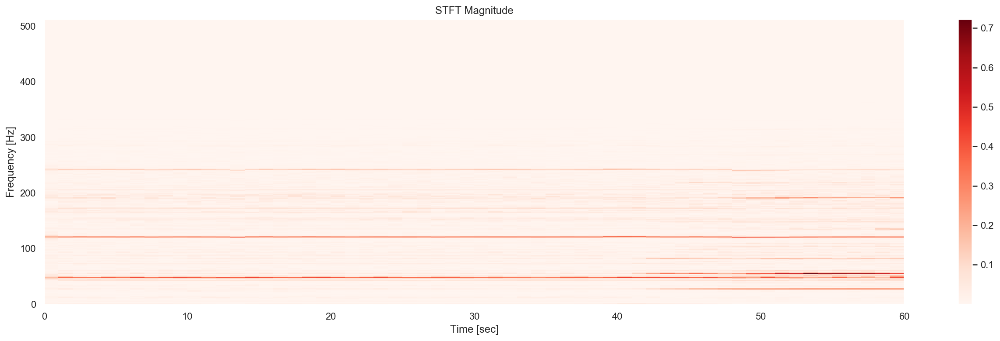

In [1728]:
#Get the prediction for test data
k=7

test_data=STFT_matrix_3D_array_1sample(xtest[k])
test_data_NN = test_data.reshape(1, 31293).astype('float32')
outputs=vae(test_data_NN)

STFT_predction=tf.reshape(outputs, [513, 61]) 

def plot_STFT_imshow(data):
    plt.figure(figsize=(15,4))
    plt.imshow(data, cmap='Reds',aspect='auto')
    plt.title('STFT Magnitude')
    plt.ylabel('Frequency [Hz]')
    plt.xlabel('Time [sec]')
    plt.colorbar()
    plt.show()
    
plot_STFT_imshow(STFT_predction)
plot_STFT_imshow(test_data[0])
plot_STFT(xtest[k])

In [1742]:
# Compare the difference
def compare_diff(data):

    test_data = STFT_matrix_3D_array_1sample(data)
    test_data_NN = test_data.reshape(1, 31293).astype('float32')
    outputs = vae(test_data_NN)
    STFT_predction = tf.reshape(outputs, [513, 61])
    diff = np.sum(STFT_predction-test_data)
    return diff

compare_diff(xtrain[3])

439.7153

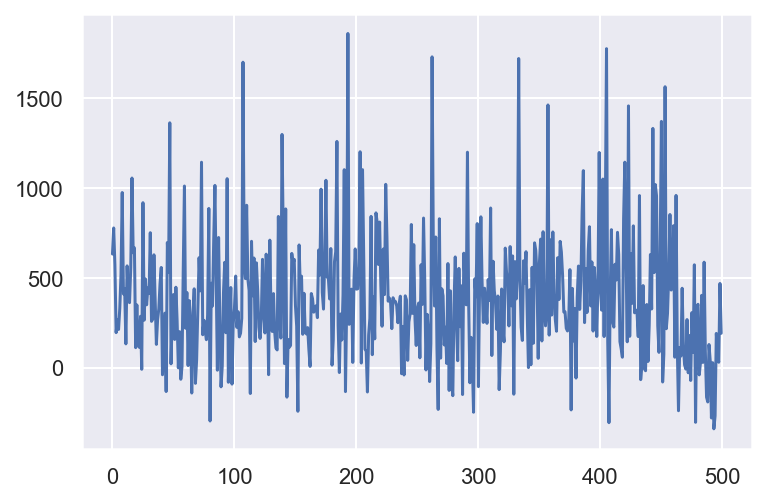

In [1747]:
diff=[]
for i in range(500):
    diff.append(compare_diff(xtrain[i]))
plt.plot(diff)

In [1746]:
pd.DataFrame(STFT_predction).describe()

,0,1,2,3,4,5,6,7,8,9,...,51,52,53,54,55,56,57,58,59,60
count,513,513,513,513,513,513,513,513,513,513,...,513,513,513,513,513,513,513,513,513,513
unique,511,513,512,512,513,513,513,513,512,513,...,512,512,512,513,513,511,512,513,510,512
top,"tf.Tensor(0.018061578, shape=(), dtype=float32)","tf.Tensor(0.015036911, shape=(), dtype=float32)","tf.Tensor(0.014560431, shape=(), dtype=float32)","tf.Tensor(0.017131567, shape=(), dtype=float32)","tf.Tensor(0.014535964, shape=(), dtype=float32)","tf.Tensor(0.013490647, shape=(), dtype=float32)","tf.Tensor(0.01456663, shape=(), dtype=float32)","tf.Tensor(0.0161435, shape=(), dtype=float32)","tf.Tensor(0.01476419, shape=(), dtype=float32)","tf.Tensor(0.015076429, shape=(), dtype=float32)",...,"tf.Tensor(0.018605262, shape=(), dtype=float32)","tf.Tensor(0.016264379, shape=(), dtype=float32)","tf.Tensor(0.016231388, shape=(), dtype=float32)","tf.Tensor(0.015295148, shape=(), dtype=float32)","tf.Tensor(0.013350785, shape=(), dtype=float32)","tf.Tensor(0.018034637, shape=(), dtype=float32)","tf.Tensor(0.01464808, shape=(), dtype=float32)","tf.Tensor(0.0136600435, shape=(), dtype=float32)","tf.Tensor(0.015023589, shape=(), dtype=float32)","tf.Tensor(0.016059548, shape=(), dtype=float32)"
freq,2,1,2,2,1,1,1,1,2,1,...,2,2,2,1,1,2,2,1,2,2


In [ ]:
# 3D STFT Matrix and VAE

import keras
#from tensorflow import keras
from tensorflow.keras import layers
#from keras import layers
from keras import backend as K

# prepare STFT data for VAE
n_samples = 800
data = STFT_matrix_3D_array(xtrain, n_samples)
x_train = data.reshape(n_samples, 31293).astype('float32')

# Train VAE
original_dim = 31293
intermediate_dim = 64
latent_dim = 32


class Sampling(layers.Layer):
    """Uses (z_mean, z_log_var) to sample z, the vector encoding a digit."""

    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon


# Define encoder model.
original_inputs = tf.keras.Input(shape=(original_dim,), name='encoder_input')
x = layers.Dense(intermediate_dim, activation='relu')(original_inputs)
z_mean = layers.Dense(latent_dim, name='z_mean')(x)
z_log_var = layers.Dense(latent_dim, name='z_log_var')(x)
z = Sampling()((z_mean, z_log_var))
encoder = tf.keras.Model(inputs=original_inputs, outputs=z, name='encoder')

# Define decoder model.
latent_inputs = tf.keras.Input(shape=(latent_dim,), name='z_sampling')
x = layers.Dense(intermediate_dim, activation='relu')(latent_inputs)
outputs = layers.Dense(original_dim, activation='sigmoid')(x)
decoder = tf.keras.Model(inputs=latent_inputs, outputs=outputs, name='decoder')

# Define VAE model.
outputs = decoder(z)
vae = tf.keras.Model(inputs=original_inputs, outputs=outputs, name='vae')

# Add KL divergence regularization loss.
kl_loss = - 0.5 * tf.reduce_mean(
    z_log_var - tf.square(z_mean) - tf.exp(z_log_var) + 1)
vae.add_loss(kl_loss)

# Train.
optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
vae.compile(optimizer, loss=tf.keras.losses.MeanSquaredError())

vae.fit(x_train, x_train, epochs=40, batch_size=64)

vae.summary()

# Get the prediction of STFT for test data
k = 7

test_data = STFT_matrix_3D_array_1sample(xtest[k])
test_data_NN = test_data.reshape(1, 31293).astype('float32')
outputs = vae(test_data_NN)

STFT_predction = tf.reshape(outputs, [513, 61])


def plot_STFT_imshow(data):
    plt.figure(figsize=(15, 4))
    plt.imshow(data, cmap='Reds', aspect='auto')
    plt.title('STFT Magnitude')
    plt.ylabel('Frequency [Hz]')
    plt.xlabel('Time [sec]')
    plt.colorbar()
    plt.show()


plot_STFT_imshow(STFT_predction)
plot_STFT_imshow(test_data[0])
plot_STFT(xtest[k])

# Compare the difference


def compare_diff(data):

    test_data = STFT_matrix_3D_array_1sample(data)
    test_data_NN = test_data.reshape(1, 31293).astype('float32')
    outputs = vae(test_data_NN)
    STFT_predction = tf.reshape(outputs, [513, 61])
    diff = np.sum(STFT_predction-test_data)
    return diff


compare_diff(xtrain[3])

diff = []
for i in range(500):
    diff.append(compare_diff(xtrain[i]))
plt.plot(diff)

pd.DataFrame(STFT_predction).describe()

## LOF - 1st order derivative and 2nd order derivative
- Features: STFT (Flatten STFT Matrix into 31293 features )
- Features dimenstion: 61440*3
- Data: train data
- Algorithm: PCA + LOF
- Parameter: Novelty 
- Scoring:
- ** AUC :**  

//anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


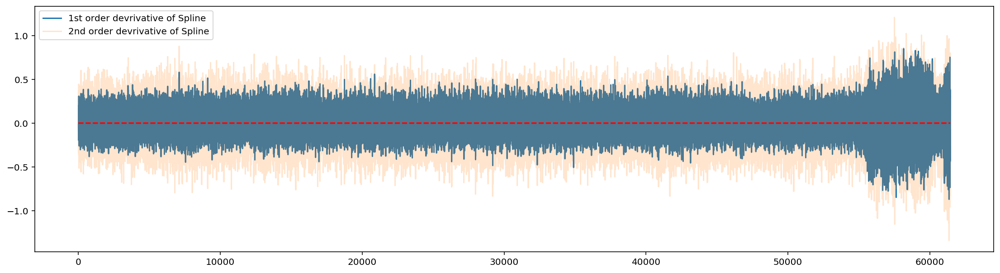

In [181]:
plot_derive(xtrain[6])

In [175]:
#spline interpolation
i=1
tck = interpolate.splrep(range(61440),xtrain[i], s=0)
      
xnew = np.arange(0,61440,1/10) 
ynew = interpolate.splev(xnew, tck, der=0)

yder1 = interpolate.splev(xnew, tck, der=1)
yder2 = interpolate.splev(xnew, tck, der=2)

In [178]:
xnew.shape
yder1.shape
yder2.shape

(614400,)

In [180]:
yder1.max()

0.8081555316475845

# Feature Engineering

# Data Augementation

In [1775]:
def cut_sequences(data, seq_len):
    sequences=np.zeros(((len(data))*int(61440/seq_len),seq_len))
    print(sequences.shape)
    if 61440 % seq_len != 0:
        return "seq_len not comapatible"
    for j in range(len(data)):
        for k in range(int(61440/seq_len)):
            sequences[int(j*(61440/seq_len))+k] = data[j, k*seq_len:(k+1)*seq_len]
            #print(j, k*seq_len,(k+1)*seq_len)
    return sequences

s=cut_sequences(xtrain[:6],2048)
s.shape


(180, 2048)


(180, 2048)

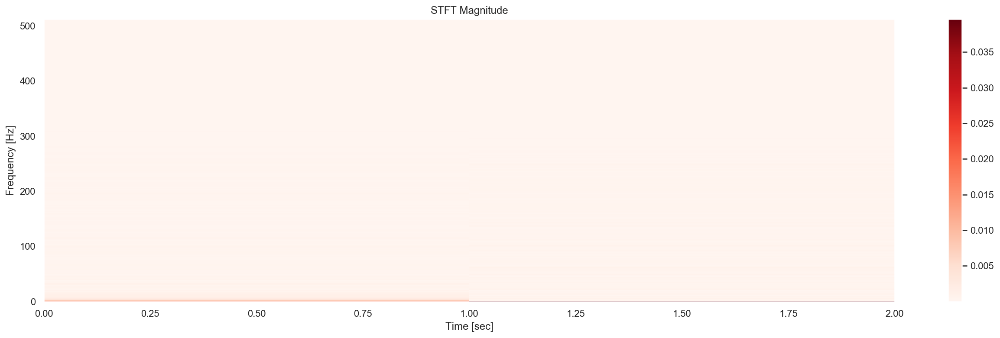

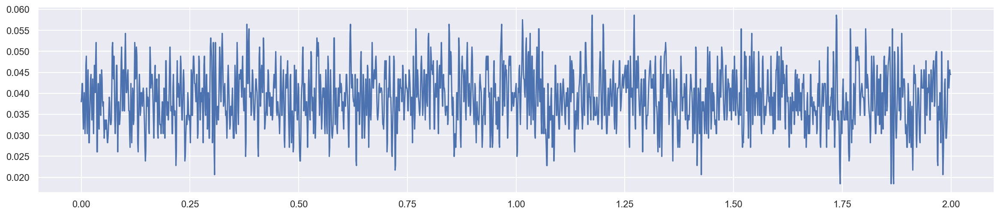

In [1788]:
plot_STFT(s[1])
plot_wave(np.arange(0.0, 2.0, 1/1024),s[1])
#plt.plot(s[1])

In [ ]:
# STFT matrix for neuro networks
def STFT_matrix_3D_array(data, n_samples):
    f, Zxx = cal_STFT(data[0])
    xtrain_STFT_3D = np.zeros(Zxx.shape)
    for i in range(n_samples):
        if i == 0:
            xtrain_STFT_3D = np.abs(Zxx)
        else:
            f, Zxx = cal_STFT(data[i])
            xtrain_STFT_3D = np.dstack([xtrain_STFT_3D, np.abs(Zxx)])
    xtrain_STFT_3D = np.moveaxis(xtrain_STFT_3D, -1, 0)
    return xtrain_STFT_3D

Treat the score of cutted sequences to calculated a score for the data
- take the highest abnormaly score as the score
- take the average score
- take the average of the 3 highest score

In [1797]:
#
seq_scores = sscore

def seq_scores(socre_list, seq_len):
    if 61440 % seq_len != 0:
        return "seq_len not comapatible"
    for j in range(int(len(seq_scores)/(61440/seq_len))):
        scores.append(np.max(score_list[int(j*(61440/seq_len)):int((j+1)*(61440/seq_len))]))
        # print(j, k*seq_len,(k+1)*seq_len)
    return scores

In [95]:
from scipy import fftpack
xtrain_FFT = np.abs(fftpack.fft(xtrain)[:30720])
xtest_FFT = np.abs(fftpack.fft(xtest)[:30720])
#freqs = fftpack.fftfreq(len(x)) * f_s
#plt.plot(xtrain_FFT)

#must use a one hot encoder
xtrain_FFT_argmax=np.argmax(xtrain_FFT,axis=1)/60
xtest_FFT_argmax=np.argmax(xtest_FFT,axis=1)/60

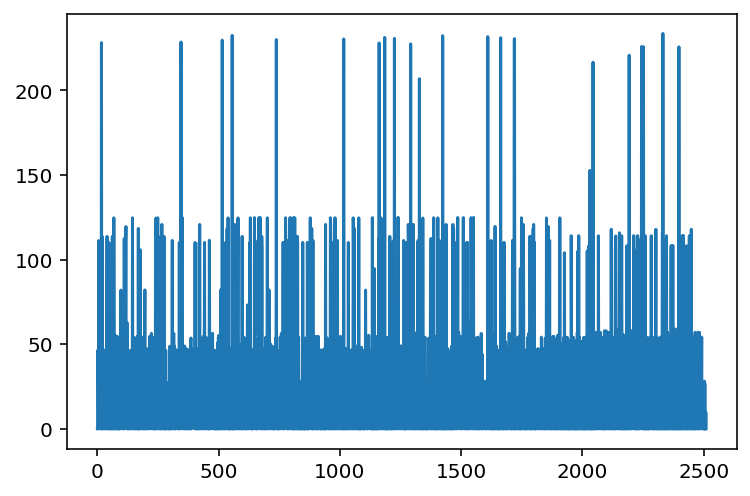

In [107]:
plt.plot(xtest_FFT_argmax)

(2511, 61440)

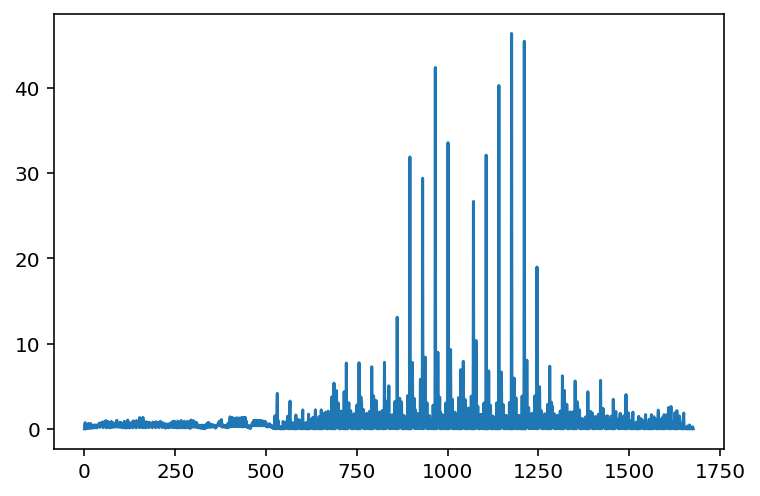

In [143]:
plt.plot(xtrain_var)

def derive(xtrain):
    xnew = np.arange(0, 61440, 1/1)
    for i in range(len(xtrain)):
        # spline interpolation
        tck = interpolate.splrep(range(61440), xtrain[i, :], s=0)

        ynew = interpolate.splev(xnew, tck, der=0)
        derive1 = interpolate.splev(xnew, tck, der=1)
        derive2 = interpolate.splev(xnew, tck, der=2)
        if i == 0:
            xtrain_interpolated = ynew
            derive1train = derive1
            derive2train = derive2
        else:
            #xtrain_interpolated = np.vstack((xtrain_interpolated, ynew))
            derive1train = np.vstack((derive1train, derive1))
            derive2train = np.vstack((derive2train, derive2))
    return derive1train, derive2train


derive1train, derive2train = derive(xtrain)
derive1test, derive2test = derive(xtest)
derive1test.shape

In [118]:
xtest.shape

(2511, 61440)

In [144]:
xtrain_der1_mean=np.mean(derive1train,axis=1) #np.abs ?
xtrain_der2_mean=np.mean(derive2train,axis=1)
xtrain_der2_var=np.var(derive2train,axis=1)
xtrain_der1_var=np.var(derive1train,axis=1)

pca3 = PCA(n_components = 10, whiten = True)
pca4 = PCA(n_components = 10, whiten = True)
xtrain_der1_fpca = pca3.fit_transform(derive1train)
xtrain_der2_fpca = pca4.fit_transform(derive2train)

In [145]:
derive1train=0
derive2train=0
xtest_der1_mean=np.mean(derive1test,axis=1)
xtest_der2_mean=np.mean(derive2test,axis=1)
xtest_der1_var=np.var(derive1test,axis=1)
xtest_der2_var=np.var(derive2test,axis=1)
pca5 = PCA(n_components = 10, whiten = True)
pca6 = PCA(n_components = 10, whiten = True)
xtest_der1_fpca = pca5.fit_transform(derive1test)
xtest_der2_fpca = pca6.fit_transform(derive2test)

In [146]:
derive1test=0
derive2test=0
derive1train=0
derive2train=0

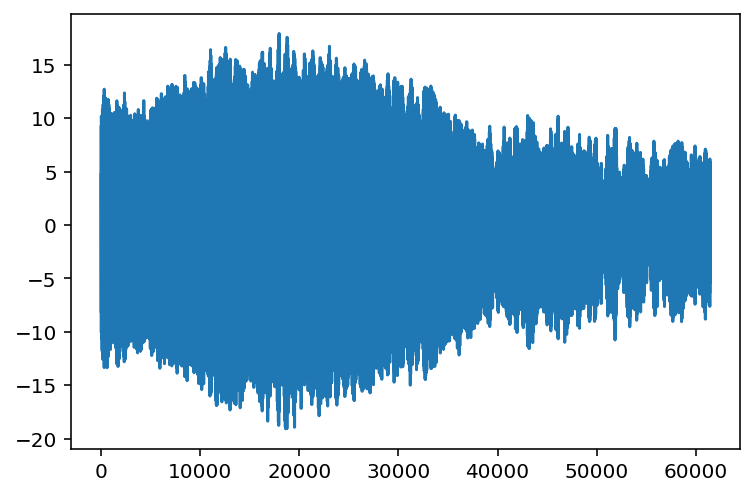

In [64]:
np.argmax(xtrain_var)
plt.plot(xtrain[1176])

In [158]:
from sklearn import preprocessing
xtrain_scaled = preprocessing.scale([2000,-1000],with_mean=False,axis=0) # axis0 feature axis1 sample
xtrain_scaled

array([ 1.33333333, -0.66666667])

In [160]:
#test standarsation

from sklearn import preprocessing
xtrain_scaled = preprocessing.scale(xtrain,with_mean=True,axis=0) # axis0 feature axis1 sample
xtrain_FFT_scaled=preprocessing.scale(xtrain_FFT,with_mean=True,axis=0)


In [161]:
# PCA transform
pca1 = PCA(n_components = 10, whiten = True)
pca1.fit(xtrain_scaled)
xtrain_fpca = pca1.fit_transform(xtrain_scaled)

pca2 = PCA(n_components = 10, whiten = True)
pca2.fit(xtrain_FFT_scaled)
xtrain_FFT_fpca = pca2.fit_transform(xtrain_FFT)


In [164]:
xtrain_new=np.vstack((xtrain_fpca.T, xtrain_mean.T,xtrain_var.T)).T

#xtrain_new=np.vstack((xtrain_fpca.T, xtrain_FFT_fpca.T,xtrain_mean.T,xtrain_var.T,xtrain_der1_fpca.T)).T
#xtrain_new=np.vstack((xtrain_fpca.T, xtrain_FFT_fpca.T,xtrain_mean.T,xtrain_var.T,xtrain_der1_fpca.T,xtrain_der2_fpca.T)).T
xtrain_new.shape

(1677, 12)

In [165]:
# Fit the low-dimensional method
lof1 = LocalOutlierFactor(n_neighbors = 5 ,contamination = 'auto', novelty = True)
lof1.fit(xtrain_new)

LocalOutlierFactor(algorithm='auto', contamination='auto', leaf_size=30,
                   metric='minkowski', metric_params=None, n_jobs=None,
                   n_neighbors=5, novelty=True, p=2)

In [166]:
# Calculate anomaly score on the (PCA-transformed) test data
xtest_scaled = preprocessing.scale(xtest,with_mean=True,axis=0)
xtest_FFT_scaled = preprocessing.scale(xtest_FFT,with_mean=True,axis=0)
xtest_fpca = pca1.fit_transform(xtest_scaled)
xtest_FFT_fpca=pca2.fit_transform(xtest_FFT_scaled)

xtest_new=np.vstack((xtest_fpca.T, xtest_mean.T,xtest_var.T)).T
#xtest_new=np.vstack((xtest_fpca.T,xtest_FFT_fpca.T, xtest_mean.T,xtest_var.T,xtest_der1_fpca.T)).T
#xtest_new=np.vstack((xtest_fpca.T,xtest_FFT_fpca.T, xtest_mean.T,xtest_var.T,xtest_der1_fpca,xtest_der2_fpca)).T

sscore = -lof1.score_samples(xtest_new)
print(sscore[:100])

[2.96631004 7.51950888 1.02182625 4.47440661 5.63716981 5.3059072
 1.07680825 1.13299931 4.71543374 1.0326938  1.70644744 6.30516673
 5.04266581 8.08815426 5.00712392 5.5745228  6.18193673 5.10039765
 5.17026449 5.34470472 1.54604433 5.51260902 5.08592955 2.25369766
 4.08835422 5.04420483 5.15562568 6.7589202  1.80284525 7.07802628
 7.52252    6.09435151 5.89952323 5.14734845 3.94055281 1.20934195
 3.59096578 3.32497    1.52666236 1.09835138 1.67183069 6.36462038
 1.75164925 5.22988643 4.19394938 5.053928   1.36104129 1.62125934
 1.05832515 1.01999993 4.22597259 1.52917881 5.06026666 2.61179959
 1.21527974 5.63392013 5.06384721 2.47799754 5.28244428 5.82728728
 4.89680339 1.0270796  1.51983436 5.02586593 4.48139017 5.2538816
 1.70289421 6.21807991 1.02469768 1.0809021  5.31116301 6.15642125
 2.41158111 2.32998645 1.87021194 1.43960786 5.10786479 4.97614594
 1.74889255 5.975441   6.22927689 8.51856241 1.12067359 5.16273692
 5.27462886 5.58814008 5.16749932 6.22436792 6.75699154 3.930792

In [168]:
# Save the anomaly scores to file
print(sscore.shape)
np.savetxt('ytest_challenge_student01.csv', sscore, fmt = '%1.6f', delimiter=',')
#0.672196163496 PCA + mean + var
#0.530522698901 PCA(raw+mean + var )
#0.46071106332 PCA(raw+mean + var+FFT )
#0.342011507039 sans whitening
#0.610795419432 PCA + + mean + var + argmaxFFT
#0.574823562856 PCA(raw) + PCA(FFT) + mean + var

(2511,)


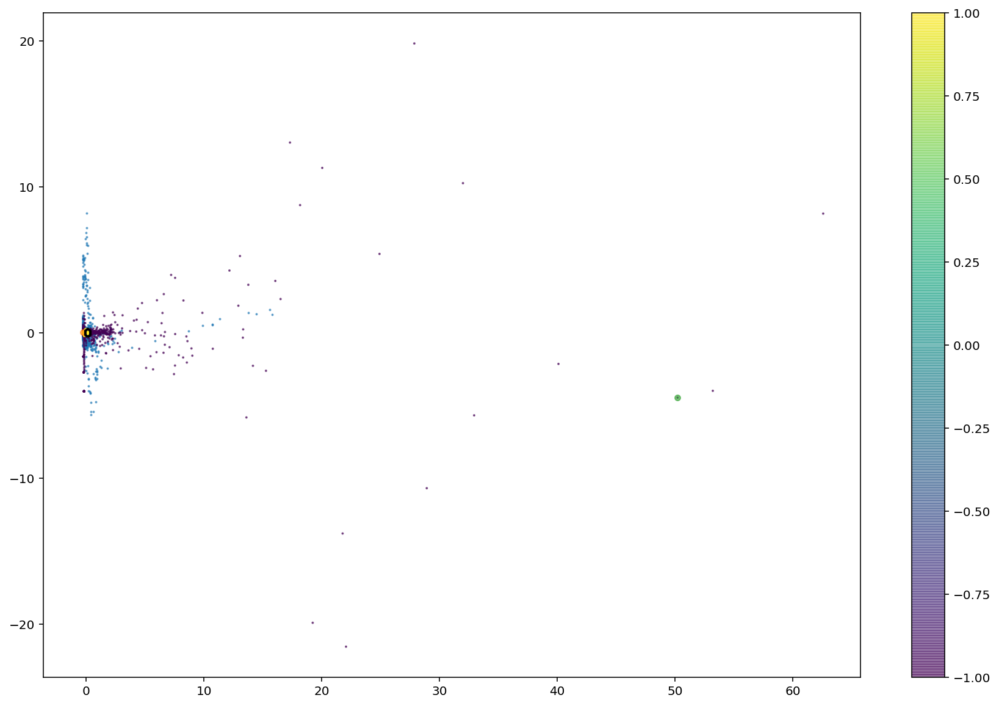

In [458]:
from sklearn.svm import OneClassSVM
pca2d= PCA(n_components = 2, whiten = True)
xtrain_fpca2d=pca2d.fit_transform(xtrain_new)
X = xtrain_fpca2d
clf = OneClassSVM(nu=0.5,kernel="rbf", gamma=0.01).fit(X)
xtest_fpca2d=pca2d.transform(xtest_new)
c=clf.predict(xtest_fpca2d)
#############
xmin=np.min([xtest_fpca2d[:,0].min(),xtrain_fpca2d[:,0].min()])
xmax=np.max([xtest_fpca2d[:,0].max(),xtrain_fpca2d[:,0].max()])
ymin=np.min([xtest_fpca2d[:,1].min(),xtrain_fpca2d[:,1].min()])
ymax=np.max([xtest_fpca2d[:,1].max(),xtrain_fpca2d[:,1].max()])
xx, yy = np.meshgrid(np.linspace(xmin,xmax, 150),
                     np.linspace(ymin,ymax, 150))
Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)
plt.figure(figsize=(15, 10))
plt.scatter(xtrain_fpca2d[:, 0], xtrain_fpca2d[:, 1],alpha=0.6,s=1) #,c=MSE)
plt.scatter(xtest_fpca2d[:, 0], xtest_fpca2d[:, 1],alpha=0.6,s=1,c=c)
plt.colorbar()
plt.scatter(xtest_fpca2d[2019, 0], xtest_fpca2d[2019, 1],alpha=0.6,s=20)
plt.scatter(xtest_fpca2d[2433, 0], xtest_fpca2d[2433, 1],alpha=0.6,s=20)
plt.contour(xx, yy, Z, levels=[0], linewidths=2, colors='black')
plt.show()

In [283]:
np.min([np.min(xtest_fpca2d[:,0]),-20])

-20.0

## standartized data
0.551120422213

In [314]:
xtrain_standartize=np.zeros(xtrain.shape)
for i in range(len(xtrain)):
    xtrain_standartize[i]=xtrain[i]/xtrain[i].std()
    
xtest_standartize=np.zeros(xtest.shape)
for i in range(len(xtest)):
    xtest_standartize[i]=xtest[i]/xtest[i].std()

//anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in true_divide
  import sys


In [328]:
xtest_standartize[201].var()

0.9999999999999999

[0.97226606 1.81344514 1.42943709 1.13283382 1.66925574 0.97995799
 1.64373954 1.28685385 1.34367046 2.40278852 1.45381811 1.69442754
 1.25836909 1.95133969 1.20358315 1.02289197 2.20148508 1.21588796
 1.07328504 1.24657574 2.50079071 1.72461044 1.85498665 4.24142694
 0.99934457 1.02560185 1.06261152 2.31994428 1.88716248 1.46502807
 1.14209132 1.59531909 1.13469164 0.95530856 1.11498217 1.38348724
 2.09141475 1.00626328 1.79362652 1.13363324 1.70352666 2.65225236
 1.39233051 0.99934457 4.80349794 1.68563758 0.97019081 2.92963943
 2.8839676  1.25416865 1.56065423 1.47721436 1.32253578 1.02554745
 1.04813477 1.38652366 2.44322868 1.25245028 1.07991084 1.44626879
 1.14846703 3.43574293 3.04391349 2.11499293 1.00232631 1.03089431
 1.6963955  1.59282313 1.44484692 3.95628682 0.9950333  1.94692006
 2.57521249 1.58382039 0.9887764  1.15994394 1.67545832 1.11321562
 1.53137269 1.06592564 1.34127224 1.98699945 2.43438656 0.96076681
 1.15337598 0.98755015 1.65055108 1.19387045 1.19782536 1.2403

In [445]:
print(sscore.shape)
print(sscore[2019])
np.savetxt('ytest_challenge_student03.csv', sscore, fmt = '%1.6f', delimiter=',')

(2511,)
10.756144671549025


In [460]:
####################
pca2d = PCA(n_components=2, whiten=True)
xtrain_fpca2d = pca2d.fit_transform(xtrain)
xtest_fpca2d = pca2d.transform(xtest)

# SVM
from sklearn.svm import OneClassSVM
clf = OneClassSVM(nu=0.005, kernel="rbf", gamma=4).fit(xtrain_fpca2d)
c=clf.predict(xtest_fpca2d)


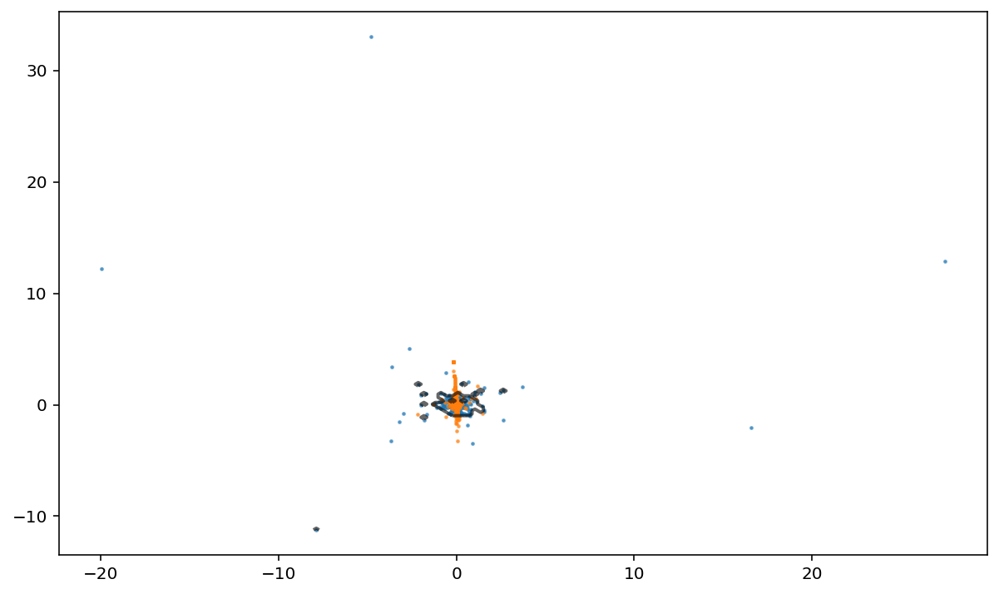

In [461]:
# Compare given classifiers under given settings
xmin = np.min([xtest_fpca2d[:, 0].min(), xtrain_fpca2d[:, 0].min()])
xmax = np.max([xtest_fpca2d[:, 0].max(), xtrain_fpca2d[:, 0].max()])
ymin = np.min([xtest_fpca2d[:, 1].min(), xtrain_fpca2d[:, 1].min()])
ymax = np.max([xtest_fpca2d[:, 1].max(), xtrain_fpca2d[:, 1].max()])
xx, yy = np.meshgrid(np.linspace(xmin, xmax, 150),
                     np.linspace(ymin, ymax, 150))
Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)


plt.figure(figsize=(10, 6))
plt.scatter(xtrain_fpca2d[:, 0], xtrain_fpca2d[:, 1],  alpha=0.6, s=2)  # ,c=MSE)

plt.scatter(xtest_fpca2d[:, 0], xtest_fpca2d[:, 1], alpha=0.6, s=2)
#plt.colorbar()

plt.contour(xx, yy, Z, levels=[0], alpha=0.6, linewidths=2, colors='black')

plt.show()

## construction of new features

In [7]:
# interpolation matrix
xnew = np.arange(0,61440,1/10)
def derivative_matrix(xtrain):
    xnew = np.arange(0, 61440, 1)
    for i in range(len(xtrain)):

        # spline interpolation
        tck = interpolate.splrep(range(61440), xtrain[i], s=0)
        #ynew = interpolate.splev(xnew, tck, der=0)
        yder1 = interpolate.splev(xnew, tck, der=1)
        #yder2 = interpolate.splev(xnew, tck, der=2)
        if i % 200 == 0:
            print(i)
        if i == 0:
            interpolation = interpolate.splev(xnew, tck, der=0)
            derivative1=interpolate.splev(xnew, tck, der=1)
            derivative2=interpolate.splev(xnew, tck, der=2)
        else:
            #interpolation = np.vstack((interpolation, ynew))
            derivative1=np.vstack((derivative1,yder1))
            #derivative2=np.vstack((derivative2,yder2))
    return interpolation,derivative1, derivative2


#xtrain_interpolation, xtrain_derivative1, xtrain_derivative2 = derivative_matrix(
 #   xtrain)
xtest_interpolation, xtest_derivative1, xtest_derivative2 = derivative_matrix(
    xtest)

0
200
400


KeyboardInterrupt: 

In [329]:
#interpolation 

for i in range(4): #len(xtrain)
    #spline interpolation
    tck = interpolate.splrep(range(61440),xtrain[i,:], s=0)
    xnew = np.arange(0,61440,1/10) 
    ynew = interpolate.splev(xnew, tck, der=0)
    derive1 = interpolate.splev(xnew, tck, der=1)
    derive2 = interpolate.splev(xnew, tck, der=2)
    if i==0:
        xtrain_interpolated=ynew
        derive1train = derive1
        derive2train = derive2
        
    else:
        print(i)
        xtrain_interpolated = np.vstack((xtrain_interpolated, ynew))
        derive1train = np.vstack((derive1train, derive1))
        derive2train = np.vstack((derive2train, derive2))
        
    

1
2
3


In [321]:
xtrain_interpolated.shape

(2, 614400)

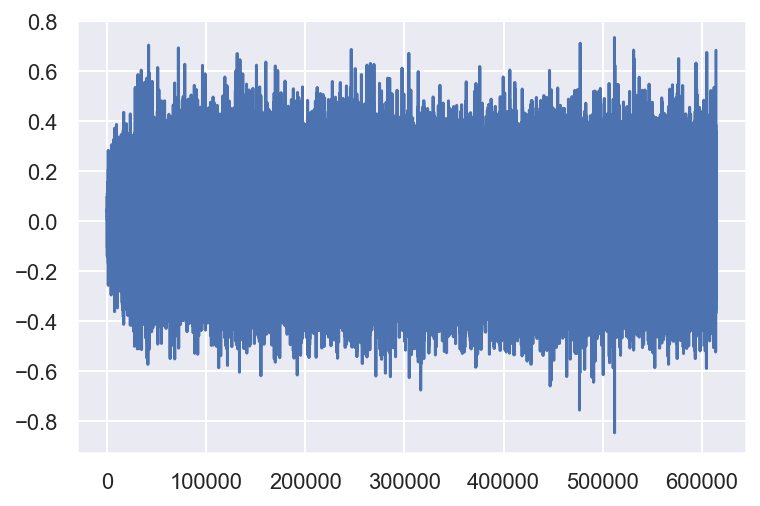

In [332]:
plt.plot(derive2train[1])

In [ ]:
# basic statistic features
xmax = np.max(xtrain_interpolated,axis=1)
xmin = np.max(xtrain_interpolated,axis=1)
xmean = np.mean(xtrain_interpolated,axis=1)
xmaxabs=np.max(np.abs(xtrain_interpolated),axis=1)


# basic statistic features on 1st order derives
xmax = np.max(xtrain_interpolated,axis=1)
xmin = np.max(xtrain_interpolated,axis=1)
xmean = np.mean(xtrain_interpolated,axis=1)
xmaxabs=np.max(np.abs(xtrain_interpolated),axis=1)


# basic statistic features on 2nd order derive

divistion = x_train[:, 13:25]/(x_train[:, 0:12]+0.00000000000001)
xtrain_new = np.c_[xtrain_interpolated, substraction, divistion]

In [328]:
np.mean(xtrain_interpolated,axis=1)

array([0.03937291, 0.00372429, 0.01277522, 0.00491984])

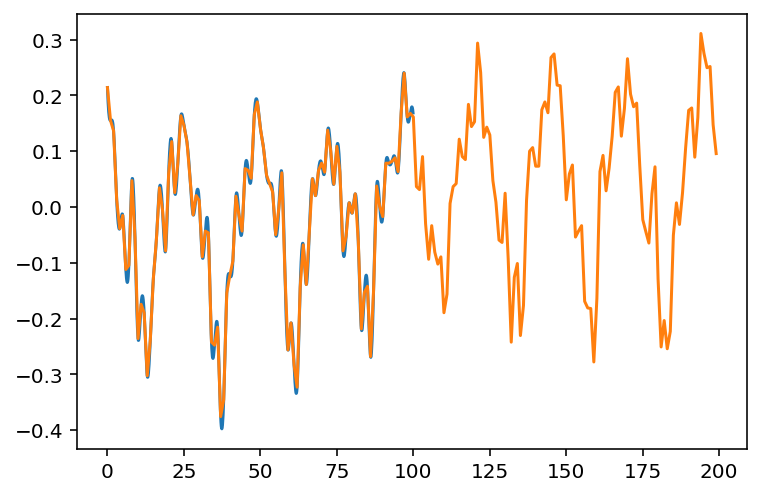

In [16]:
xtrain.shape
xnew = np.arange(0,61440,1/10)
tck = interpolate.splrep(range(61440), xtrain[2], s=0)
ynew = interpolate.splev(xnew, tck, der=0)
plt.plot(xnew[:1000],ynew[:1000])
plt.plot(xtrain[2][:200])

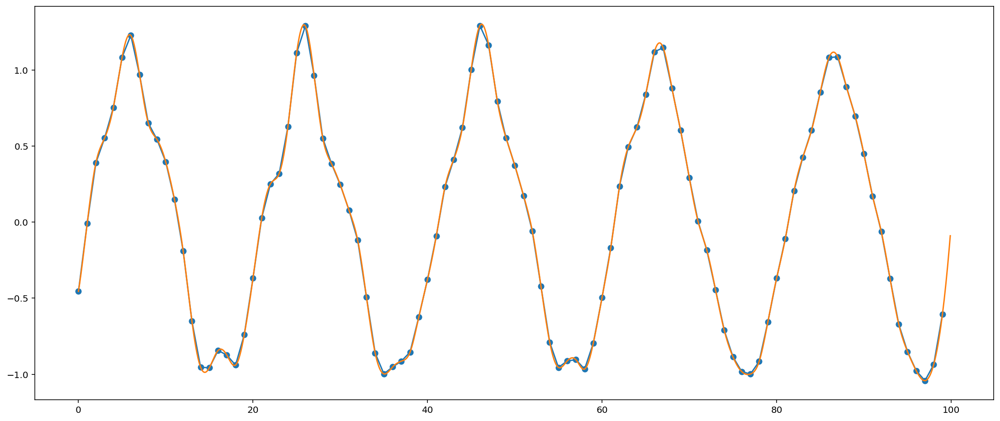

In [21]:
i=10
k=1
start=0
end=100

length=end-start
ynew=[]



plt.figure(figsize=(19,8))
for n in range(k):
    #spline interpolation
    tck = interpolate.splrep(range(start,end),xtrain[i+n,start:end], s=0)
    #xnew = np.linspace(start,end,length*10) 
    xnew = np.arange(start,end,1/10) 
    ynew = interpolate.splev(xnew, tck, der=0)

    
    #raw data
    plt.scatter(range(start,end),xtrain[i+n,start:end])
    #plt.scatter(xnew,ynew)
    plt.plot(range(start,end),xtrain[i+n,start:end])

    #spline
    #plt.scatter(xnew,ynew)
    plt.plot(xnew,ynew)

    
    

# History
## Prepare a file for submission

In [5]:
# Save the anomaly scores to file
print(sscore.shape)
np.savetxt('ytest_challenge_student.csv', sscore, fmt = '%1.6f', delimiter=',')

(2511,)


#### Now it's your turn. Good luck !  :) 

In [20]:
def plot_wave(t,x):
    dt = 1/1024
    t = np.arange(0.0, 60.0, dt)
    plt.figure(figsize=(20, 4))
    plt.plot(t,x)
    plt.show()

for i in range(20):
    k=10
    plot_wave(t,xtrain[k+i])
    plot_derive(xtrain[k+i])
    #plot_spectrum(xtrain[k+i])
    f,Zxx = plot_STFT(xtrain[k+i])
    #average frequence
    #plt.plot((f@np.abs(Zxx))/np.sum(np.abs(Zxx),axis=0))

NameError: name 't' is not defined

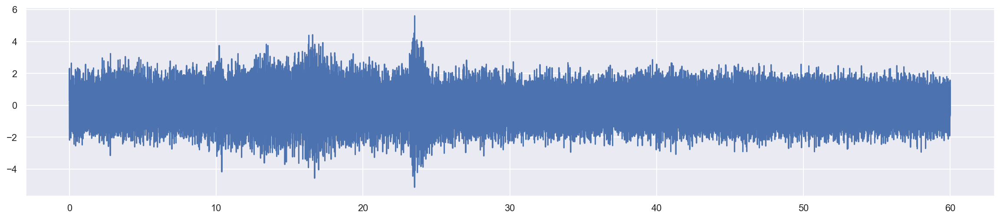

//anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


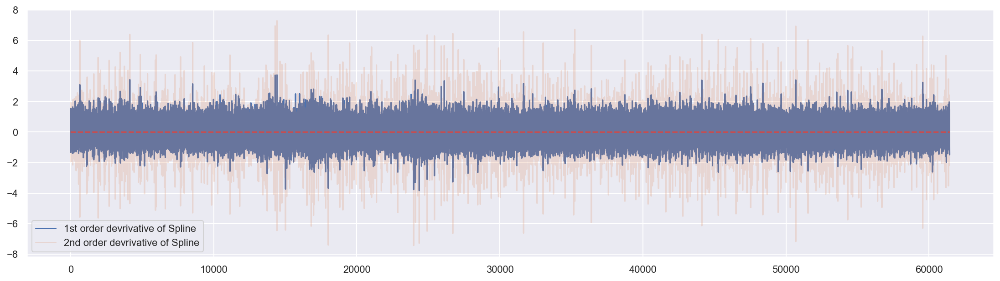

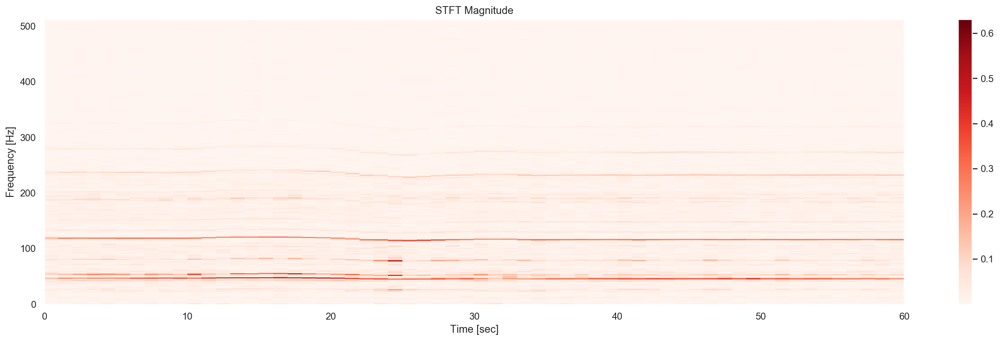

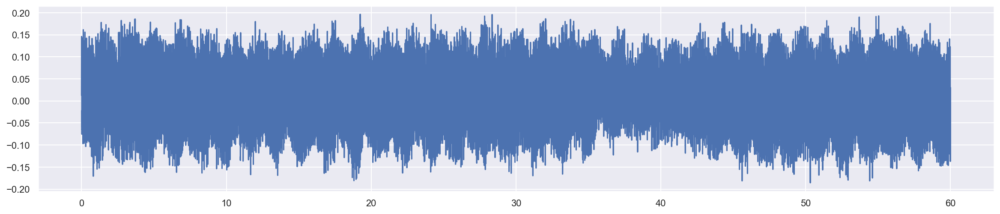

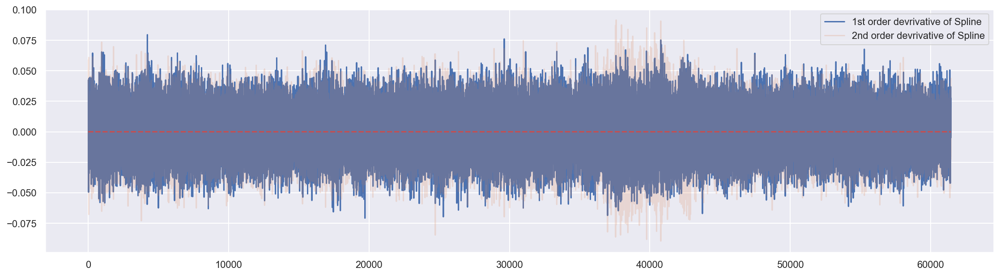

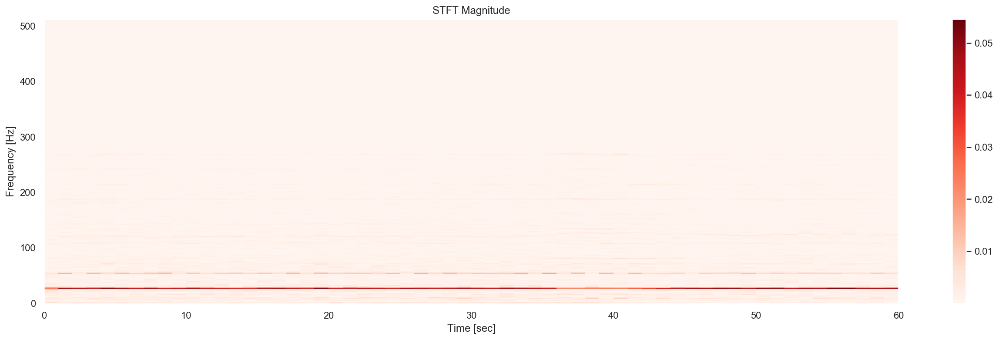

...

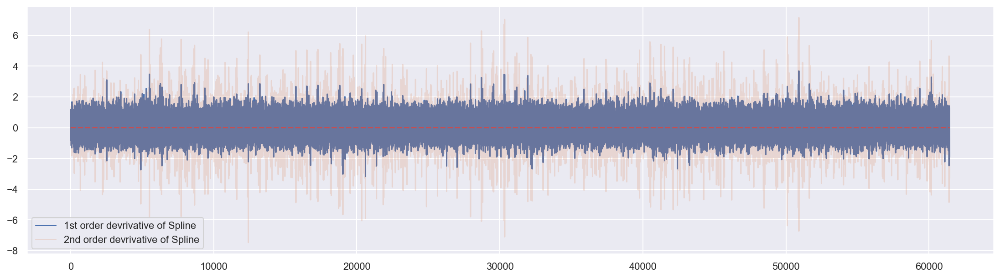

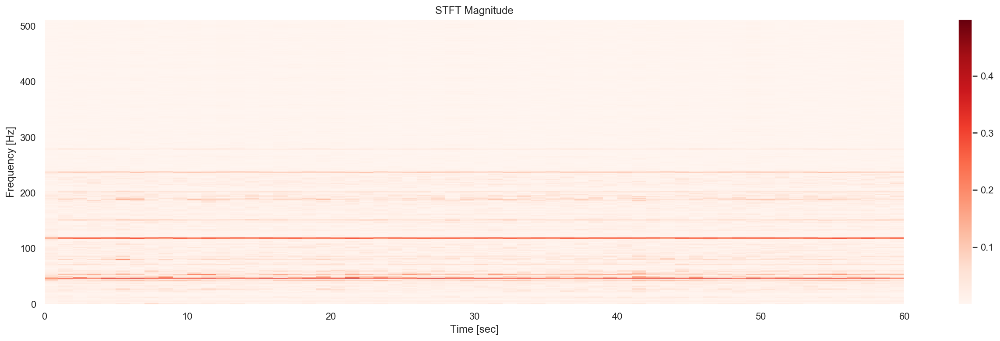

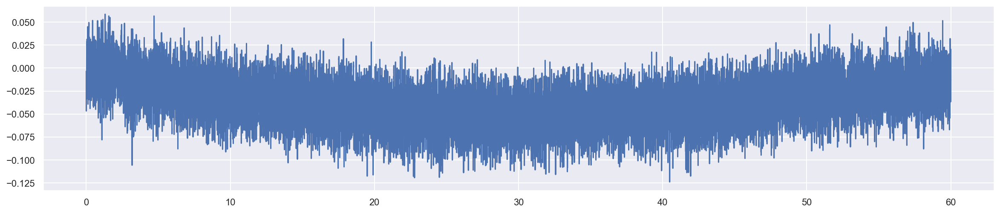

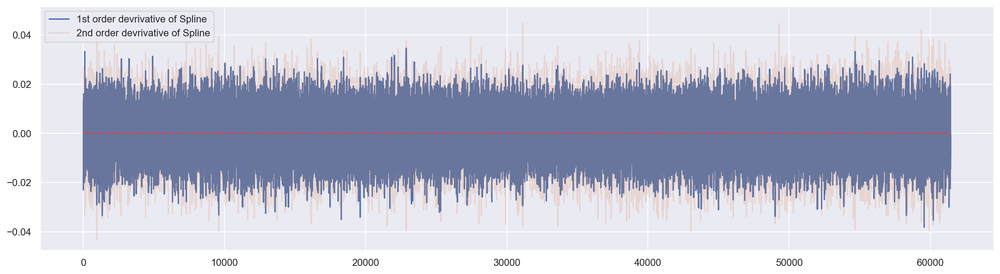

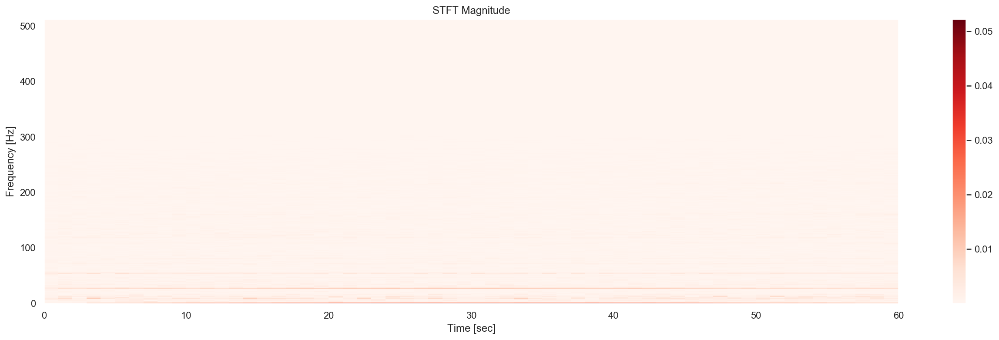

In [1420]:
for i in range(20):
    k=10
    plot_wave(t,xtest[k+i])
    plot_derive(xtest[k+i])
    #plot_spectrum(xtrain[k+i])
    f,Zxx = plot_STFT(xtest[k+i])
    #average frequence
    #plt.plot((f@np.abs(Zxx))/np.sum(np.abs(Zxx),axis=0))

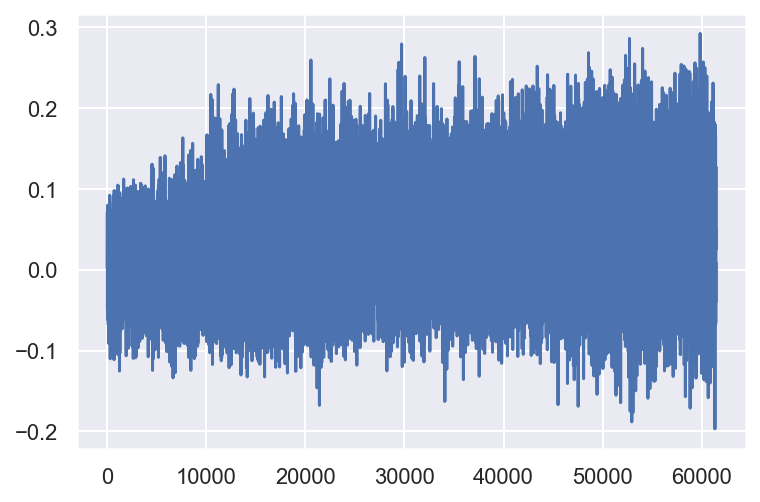

//anaconda3/lib/python3.7/site-packages/sklearn/ensemble/iforest.py:247: FutureWarning: behaviour="old" is deprecated and will be removed in version 0.22. Please use behaviour="new", which makes the decision_function change to match other anomaly detection algorithm API.
  FutureWarning)
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   2 out of   4 | elapsed:    0.2s remaining:    0.2s
[Parallel(n_jobs=4)]: Done   4 out of   4 | elapsed:    0.2s finished
//anaconda3/lib/python3.7/site-packages/sklearn/ensemble/iforest.py:415: DeprecationWarning: threshold_ attribute is deprecated in 0.20 and will be removed in 0.22.
  " be removed in 0.22.", DeprecationWarning)


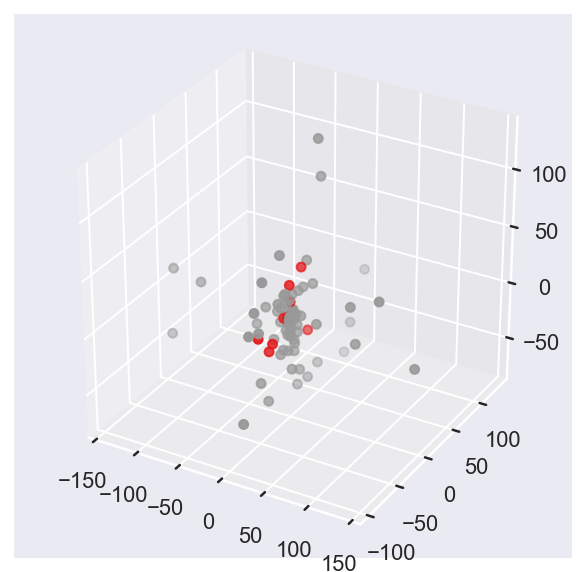

In [936]:
#use FFT 
X = np.abs(fftpack.fft(xtrain[:100]))

clf = IsolationForest(random_state=0, n_jobs=-1,verbose=1,
                      contamination=0.1, max_features=1, max_samples=1.0)
clf.fit(X)
labels=clf.predict(X)

viz_PCA3D(X,labels)
#1 for inliers, -1 for outliers.

In [909]:
'''Average anomaly score of X of the base classifiers.

The anomaly score of an input sample is computed as the mean anomaly score of the trees in the forest.

The measure of normality of an observation given a tree is the depth of the leaf containing this observation, which is equivalent to the number of splittings required to isolate this point. In case of several observations n_left in the leaf, the average path length of a n_left samples isolation tree is added.''''''
'''
#The anomaly score of the input samples. The lower, the more abnormal. Negative scores represent outliers, positive scores represent inliers.
clf.decision_function(xtrain[:10])

array([ 0.07247204, -0.00702694, -0.01103481,  0.07438618,  0.02299427,
        0.03632603,  0.07578097,  0.05121294,  0.00821044,  0.06004336])

In [892]:
#The anomaly score of the input samples. The lower, the more abnormal.
clf.score_samples(xtrain[:10])


array([-0.42752796, -0.50702694, -0.51103481, -0.42561382, -0.47700573,
       -0.46367397, -0.42421903, -0.44878706, -0.49178956, -0.43995664])

In [921]:
from sklearn.decomposition import PCA

def viz_PCA(x,labels):
    pca = PCA(n_components=2).fit(xtrain[:100])
    datapoint = pca.transform(xtrain[:100])
    plt.figure(figsize=(5,5))
    plt.scatter(datapoint[:, 0], datapoint[:, 1],c  = labels,cmap='Set1')
    plt.show()
    
def viz_PCA3D(x,labels):    
    pca3D = PCA(n_components=3).fit(xtrain[:100])
    datapoint3D = pca3D.transform(xtrain[:100])
    fig = plt.figure(figsize=(5,5))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(datapoint3D[:, 0], datapoint3D[:, 1], datapoint3D[:, 2],c  = labels,cmap='Set1')
    plt.show()

In [938]:
X = fftpack.fft(xtrain[1])

In [927]:
X.shape

(61440,)

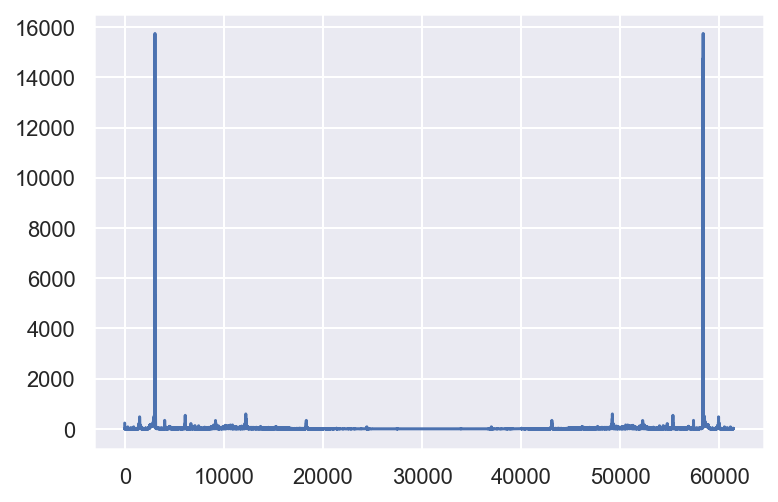

In [932]:
plt.plot(np.abs(X))

AAAAA
AAAAA


//anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  """


KeyboardInterrupt: 

Error in callback <function install_repl_displayhook.<locals>.post_execute at 0x1a15e2c840> (for post_execute):


KeyboardInterrupt: 

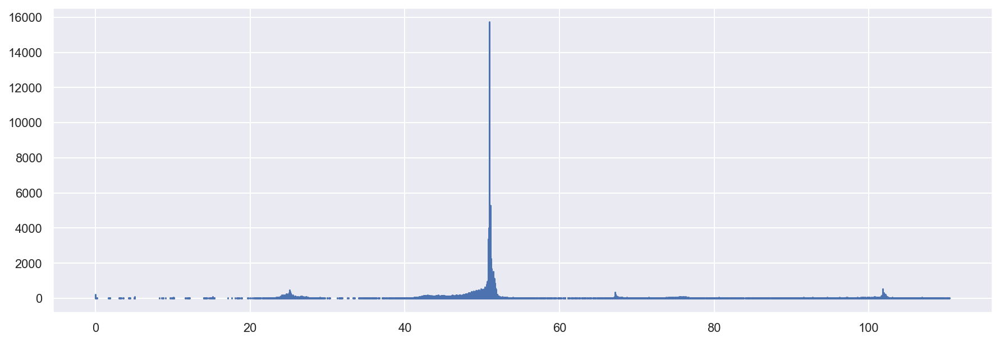

In [941]:
freqs = fftpack.fftfreq(len(X)) * f_s
print('AAAAA')
fig, ax = plt.subplots(figsize=(15, 5))
print('AAAAA')
ax.stem(freqs, np.abs(X), markerfmt='C1.', basefmt='C3-')

In [42]:
#from __future__ import absolute_import, division, print_function, unicode_literals

import tensorflow as tf

#from tensorflow.keras.layers import Dense, Flatten

import os
import time
import numpy as np
import glob
import matplotlib.pyplot as plt
import PIL
import imageio
#from keras.layers import Conv1DTranspose

from IPython import display

TRAIN_BUF = 60000
BATCH_SIZE = 100

TEST_BUF = 10000

In [944]:
train_dataset = tf.data.Dataset.from_tensor_slices(xtrain).shuffle(TRAIN_BUF).batch(BATCH_SIZE)
test_dataset = tf.data.Dataset.from_tensor_slices(xtest).shuffle(TEST_BUF).batch(BATCH_SIZE)

In [41]:
 tf.keras.layers.InputLayer(input_shape=(latent_dim,)),
          tf.keras.layers.Dense(units=32*32, activation=tf.nn.relu),
          tf.keras.layers.Reshape(target_shape=(32, 32)),
          tf.keras.layers.Conv1DTranspose(
              filters=64,
              kernel_size=3,
              strides=2,
              padding="SAME",
              activation='relu'),
          tf.keras.layers.Conv1D(
              filters=32,
              kernel_size=3,
              strides=2,
              padding="SAME",
              activation='relu'),
          # No activation
          tf.keras.layers.Conv1D(
              filters=1, kernel_size=3, strides=1, padding="SAME"),

IndentationError: unexpected indent (<ipython-input-41-95d950507eaf>, line 2)

In [1564]:
import keras
#from tensorflow import keras
from keras import layers
from keras import backend as K

In [1594]:
encoder_input = keras.Input(shape=(512, 20, 1), name='sequence')
x = layers.Conv2D(filters=12, kernel_size=2, strides=1,
                  activation='relu')(encoder_input)
x = layers.Conv2D(filters=12, kernel_size=3, strides=2, activation='relu')(x)
#x = layers.Conv2D(filters=24, kernel_size=3,  activation='relu')(x)
#x = layers.Conv2D(filters=64, kernel_size=3, activation='relu')(x)
x = layers.MaxPooling2D(2)(x)
shape_before_flattening = K.int_shape(x)
x = layers.Flatten()(x)
encoder_output = layers.Dense(4)(x)
#encoder_output = layers.Dense(latent_dim + latent_dim)(x)

encoder = keras.Model(encoder_input, encoder_output, name='encoder')
encoder.summary()

x = layers.InputLayer(input_shape=(latent_dim,))(encoder_output)
x = layers.Dense(np.prod(shape_before_flattening[1:]), activation='relu')(x)
x = layers.Reshape(shape_before_flattening[1:])(x)
x = layers.Conv2DTranspose(32, kernel_size=3, strides=2, activation='relu')(x)
x = layers.Conv2D(1, 3, activation='relu')(x)
#x = layers.UpSampling2D(3)(x)
x = layers.Conv2DTranspose(16, (3, 3), activation='relu')(x)
decoder_output = x
#decoder = keras.Model(encoder_output, decoder_output)

autoencoder = keras.Model(encoder_input, decoder_output, name='autoencoder')
autoencoder.summary()

Model: "encoder"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequence (InputLayer)        (None, 512, 20, 1)        0         
_________________________________________________________________
conv2d_99 (Conv2D)           (None, 511, 19, 12)       60        
_________________________________________________________________
conv2d_100 (Conv2D)          (None, 255, 9, 12)        1308      
_________________________________________________________________
max_pooling2d_29 (MaxPooling (None, 127, 4, 12)        0         
_________________________________________________________________
flatten_28 (Flatten)         (None, 6096)              0         
_________________________________________________________________
dense_101 (Dense)            (None, 4)                 24388     
Total params: 25,756
Trainable params: 25,756
Non-trainable params: 0
_______________________________________________________

In [1570]:
shape_before_flattening
np.prod(shape_before_flattening[1:])

8064

In [178]:
#use FFT 
from sklearn.ensemble import IsolationForest

clf = IsolationForest(random_state=0, n_jobs=-1,verbose=1,
                      contamination=0.1, max_features=1, max_samples=1.0)
clf.fit(xtrain_STFT)
labels=clf.predict(X)

viz_PCA3D(X,labels)
#1 for inliers, -1 for outliers.

ValueError: Found array with dim 3. Estimator expected <= 2.